<div class="alert alert-block alert-success">

## <center> Tracking Issues created for Repos on GitHub </center>
## <center> Plot and Forecast Issues </center>
    

</div>

<div class="alert alert-block alert-danger">
    
### Deliverables:
- Submit a single ZIP file  that has the folowing items:
    1. Your PDF document for the analysis report.
    2. Your IPYNB script with the name GitHub_Repos_Issues_Forecasting.ipynb that has your source code and output for the requirements listed
    2. Your HTML/PDF document that has your source code and output for the requirements listed

<br>
    
</div>

<hr style="border:2px solid black"> </hr>
<div class="alert alert-info">



        
## REQUIREMENT 1

Use Python/GitHub API to retrieve Issues/Repos information of the **past 2 months** for the following  repositories:
- https://github.com/meta-llama/llama3
- https://github.com/ollama/ollama
- https://github.com/langchain-ai/langchain
- https://github.com/langchain-ai/langgraph
- https://github.com/microsoft/autogen
- https://github.com/openai/openai-cookbook
- https://github.com/elastic/elasticsearch
- https://github.com/milvus-io/pymilvus


## Important: Data Retrieval Timeframe

 - For **chart visualizations below**, retrieve **past 2 years** of data.
 - For **semantic search and vector embeddings**, use **past 2 months** of data from the above repositories.

    
</div>



In [148]:
!pip install tensorflow pandas numpy requests matplotlib scikit-learn python-dateutil
!pip install pygithub
!pip install scikit-learn 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from github import Github
import requests
from datetime import datetime, timedelta
import time

In [ ]:
# Add github token here for sure.
GITHUB_TOKEN = ""
headers = {"Authorization": f"token {GITHUB_TOKEN}"}

REPOSITORY = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

end_date = datetime.now()
start_date = end_date - timedelta(days = 365 * 2)
print(365 * 2)

git = Github(GITHUB_TOKEN)

730


In [ ]:
def fetch_issues(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching issues for {repoName}")
    allIssues = repo.get_issues(state='all', since=start_date)
    issueObjects = []
    for issue in allIssues:
        issueObjects.append({
            'title': issue.title,
            'created_at': issue.created_at,
            'closed_at': issue.closed_at,
            'number': issue.number,
        })

    return issueObjects

# Fetching issues data for each repository
issues_data = {repo: fetch_issues(repo) for repo in REPOSITORY}

Fetching issues for meta-llama/llama3
Fetching issues for ollama/ollama
Fetching issues for langchain-ai/langchain
Fetching issues for langchain-ai/langgraph
Fetching issues for microsoft/autogen
Fetching issues for openai/openai-cookbook
Fetching issues for elastic/elasticsearch
Fetching issues for milvus-io/pymilvus


In [ ]:
issues_data

{'meta-llama/llama3': [{'title': 'A TEST file',
   'created_at': datetime.datetime(2025, 4, 15, 20, 30, 15, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 397},
  {'title': 'Difficulty Accessing Llama-3.1, 3.2, 3.3, and Llama 4.',
   'created_at': datetime.datetime(2025, 4, 8, 15, 31, 19, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 396},
  {'title': 'How to SFT llama3 with a labelled dataset',
   'created_at': datetime.datetime(2025, 3, 29, 8, 52, 49, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 395},
  {'title': 'Codespace musical space umbrella',
   'created_at': datetime.datetime(2025, 3, 27, 7, 48, 25, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 394},
  {'title': "llama model list keeps fail in a fresh env: module 'jsonschema' has no attribute 'Draft201909Validator",
   'created_at': datetime.datetime(2025, 3, 22, 7, 8, 51, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 393},
  {'

In [ ]:
import csv

# Save issues data to a CSV
def save_issues_to_csv(issues_data, filename="issues_all_repo.csv"):

    for repo, issues in issues_data.items():
        print(len(issues))
        repoName = repo.replace("/", "_")
        fileName = f"issue_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=issues[0].keys())
            writer.writeheader()
            writer.writerows(issues)

    all_entries = []
    for repo, issues in issues_data.items():
        for issue in issues:
            entry = {"repository": repo, **issue}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved issues data to {filename}")

save_issues_to_csv(issues_data)

issues_df = pd.read_csv("issues_all_repo.csv")

row_count = issues_df.shape[0]
row_count


388
10125
21749
3226
5601
1382
37429
1426
Saved issues data to issues_all_repo.csv


81326

In [ ]:
starsDict = dict()
forkedDict = dict()

for repoName in REPOSITORY:
    repo = git.get_repo(repoName)
    starsDict[repoName] = repo.stargazers_count
    forkedDict[repoName] = repo.forks_count

print(starsDict)
print(forkedDict)

stars_df = pd.DataFrame(list(starsDict.items()), columns=["Repository", "Stars"])
forked_df = pd.DataFrame(list(forkedDict.items()), columns=["Repository", "Forks"])

stars_df.to_csv("all_repo_stars.csv", index = False)
forked_df.to_csv("all_repo_forkedIssues.csv", index = False)

{'meta-llama/llama3': 28631, 'ollama/ollama': 138123, 'langchain-ai/langchain': 106094, 'langchain-ai/langgraph': 11756, 'microsoft/autogen': 43492, 'openai/openai-cookbook': 63369, 'elastic/elasticsearch': 72430, 'milvus-io/pymilvus': 1159}
{'meta-llama/llama3': 3365, 'ollama/ollama': 11506, 'langchain-ai/langchain': 17235, 'langchain-ai/langgraph': 1953, 'microsoft/autogen': 6552, 'openai/openai-cookbook': 10293, 'elastic/elasticsearch': 25177, 'milvus-io/pymilvus': 350}


In [ ]:
from datetime import datetime, timedelta, timezone

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_pulls(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching pulls for {repoName}")
    allPulls = repo.get_pulls(state='all')
    print(f"Done pulls for {repoName}")
    allPullsObj = []

    for issue in allPulls:
        createdAt = issue.created_at.replace(tzinfo=None)
        if createdAt >= startDate:
            issue_created = issue.created_at.replace(tzinfo=None)
            closed_at = issue.closed_at.replace(tzinfo=None) if issue.closed_at else None
            merged_at = issue.merged_at.replace(tzinfo=None) if issue.merged_at else None

            allPullsObj.append({
                "repo": repoName,
                "pull_id": issue.id,
                'title': issue.title,
                'created_at': issue_created,
                'closed_at': closed_at,
                'merged_at': merged_at,
                'number': issue.number,
                'state': issue.state,
              })
    return allPullsObj

# Fetching issues data for each repository
pulls_data = {repo: fetch_pulls(repo) for repo in REPOSITORY}
print(pulls_data)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Save issues data to a CSV
def save_pulls_to_csv(pulls_data, filename="pulls_all_repo.csv"):

    for repo, issues in pulls_data.items():
        print(len(issues))
        repoName = repo.replace("/", "_")
        fileName = f"pulls_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=issues[0].keys())
            writer.writeheader()
            writer.writerows(issues)

    all_entries = []
    for repo, allPulls in pulls_data.items():
        for issue in allPulls:
            entry = {"repository": repo, **issue}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved allPulls data to {filename}")

save_pulls_to_csv(pulls_data)

pulls_df = pd.read_csv("pulls_all_repo.csv")
pulls_df.shape

99
3304
15391
2629
2913
865
24419
902
Saved allPulls data to pulls_all_repo.csv


(50522, 9)

In [ ]:
from datetime import datetime, timedelta, timezone

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_commits(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching pulls for {repoName}")
    allCommits = repo.get_commits(since = start_date, until = end_date)
    print(f"Done commits for {repoName}")
    allCommitsObj = []
    print(allCommits)
    for commit in allCommits:
        allCommitsObj.append({
            "repo": repoName,
            "commit_id": commit.sha,
            'commit_date': commit.commit.author.date
          })
    return allCommitsObj

# Fetching issues data for each repository
commited_data = {repo: fetch_commits(repo) for repo in REPOSITORY}
print(commited_data)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import csv

# Save commits data to a CSV
def save_commits_to_csv(commits_data, filename="commits_all_repo.csv"):

    for repo, commits in commits_data.items():
        print(len(commits))
        repoName = repo.replace("/", "_")
        fileName = f"commits_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=commits[0].keys())
            writer.writeheader()
            writer.writerows(commits)
        print(f"Commited to {fileName}")

    all_entries = []
    for repo, commits in commits_data.items():
        for issue in commits:
            entry = {"repository": repo, **issue}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved commits data to {filename}")

save_commits_to_csv(commited_data)

commits_df = pd.read_csv("commits_all_repo.csv")
commits_df.shape

132
Commited to commits_meta-llama_llama3.csv
4176
Commited to commits_ollama_ollama.csv
11749
Commited to commits_langchain-ai_langchain.csv
5029
Commited to commits_langchain-ai_langgraph.csv
2955
Commited to commits_microsoft_autogen.csv
689
Commited to commits_openai_openai-cookbook.csv
16866
Commited to commits_elastic_elasticsearch.csv
473
Commited to commits_milvus-io_pymilvus.csv
Saved commits data to commits_all_repo.csv


(42069, 4)

In [ ]:
## Branches

from datetime import datetime, timedelta, timezone

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_branches(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching branches for {repoName}")
    allbranches = repo.get_branches()
    print(f"Done branches for {repoName}")
    allBranchesObj = []
    print(allbranches)
    for branch in allbranches:
        branch_name = branch.name
        commit_sha = branch.commit.sha
        commit = branch.commit
        commit_date = commit.commit.author.date
        commitDate = commit_date.replace(tzinfo=None)
        if commitDate >= startDate:

            allBranchesObj.append({
                "repo": repoName,
                "branch_name": branch_name,
                "branch_commit_id": commit_sha,
                'commit_date': commitDate
              })
        pass
    return allBranchesObj

branch_data = {repo: fetch_branches(repo) for repo in REPOSITORY}
print(branch_data)

Fetching branches for meta-llama/llama3
Done branches for meta-llama/llama3
Fetching branches for ollama/ollama
Done branches for ollama/ollama
Fetching branches for langchain-ai/langchain
Done branches for langchain-ai/langchain
Fetching branches for langchain-ai/langgraph
Done branches for langchain-ai/langgraph
Fetching branches for microsoft/autogen
Done branches for microsoft/autogen
Fetching branches for openai/openai-cookbook
Done branches for openai/openai-cookbook
Fetching branches for elastic/elasticsearch
Done branches for elastic/elasticsearch
Fetching branches for milvus-io/pymilvus
Done branches for milvus-io/pymilvus
{'meta-llama/llama3': [{'repo': 'meta-llama/llama3', 'branch_name': 'gh/HDCharles/1/base', 'branch_commit_id': 'fa87cc3601463f3d0dce6b081e111865e362b622', 'commit_date': datetime.datetime(2024, 4, 5, 0, 24, 41)}, {'repo': 'meta-llama/llama3', 'branch_name': 'gh/HDCharles/1/head', 'branch_commit_id': 'd6a2e3cf19b22ccfbb03e4d3d23ca1853a03f954', 'commit_date': 

In [ ]:
import csv

# Save branches data to a CSV
def save_branches_to_csv(branches_data, filename="branches_all_repo.csv"):

    for repo, branches in branches_data.items():
        print(len(branches))
        repoName = repo.replace("/", "_")
        fileName = f"branches_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=branches[0].keys())
            writer.writeheader()
            writer.writerows(branches)
        print(f"branched to {fileName}")

    all_entries = []
    for repo, branches in branches_data.items():
        for branch in branches:
            entry = {"repository": repo, **branch}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved branches data to {filename}")

save_branches_to_csv(branch_data)

branches_df = pd.read_csv("branches_all_repo.csv")
branches_df.shape

19
branched to branches_meta-llama_llama3.csv
234
branched to branches_ollama_ollama.csv
784
branched to branches_langchain-ai_langchain.csv
151
branched to branches_langchain-ai_langgraph.csv
188
branched to branches_microsoft_autogen.csv
53
branched to branches_openai_openai-cookbook.csv
311
branched to branches_elastic_elasticsearch.csv
5
branched to branches_milvus-io_pymilvus.csv
Saved branches data to branches_all_repo.csv


(1745, 5)

In [ ]:
## Contributions

from datetime import datetime, timedelta, timezone

git = Github(GITHUB_TOKEN)

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

headers = {
    "Accept": "application/vnd.github+json",
    "Authorization": f"Bearer {GITHUB_TOKEN}",
}

def fetch_contributors(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching contributors for {repoName}")
    allContributors = repo.get_contributors()
    print(f"Done contributors for {repoName}")
    allContributorsObj = []

    # print(allContributors)
    for contributor in allContributors:
        # print(contributor)
        login = contributor.login
        name = contributor.name
        email = contributor.email
        contributions = contributor.contributions
        avatar_url = contributor.avatar_url
        html_url = contributor.html_url

        userURL = f"https://api.github.com/users/{login}/events/public"
        eventRes = requests.get(userURL, headers=headers, params={"per_page": 100})
        time.sleep(4)
        if eventRes.status_code == 200:
            events = eventRes.json()
            for event in events:
                createdEventDate = event.get("created_at")
                if createdEventDate:
                    event_datetime = datetime.fromisoformat(createdEventDate[:-1])
                    if start_date <= event_datetime <= end_date:
                        allContributorsObj.append({
                            "repository": repo,
                            "contributor": login,
                            "event_date": createdEventDate,
                            "contributorName": name
                        })
                        break
    return allContributorsObj

contributors_data = {repo: fetch_contributors(repo) for repo in REPOSITORY}
print(contributors_data) 

Fetching contributors for meta-llama/llama3
Done contributors for meta-llama/llama3
Fetching contributors for ollama/ollama
Done contributors for ollama/ollama
Fetching contributors for langchain-ai/langchain
Done contributors for langchain-ai/langchain
Fetching contributors for langchain-ai/langgraph
Done contributors for langchain-ai/langgraph
Fetching contributors for microsoft/autogen
Done contributors for microsoft/autogen
Fetching contributors for openai/openai-cookbook
Done contributors for openai/openai-cookbook
Fetching contributors for elastic/elasticsearch
Done contributors for elastic/elasticsearch
Fetching contributors for milvus-io/pymilvus
Done contributors for milvus-io/pymilvus


In [4]:
import csv
# Save contributor data to a CSV
def save_contributor_to_csv(contributor_data, filename="contributor_all_repo.csv"):

    for repo, contributor in contributor_data.items():
        print(len(contributor))
        repoName = repo.replace("/", "_")
        fileName = f"contributor_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=contributor[0].keys())
            writer.writeheader()
            writer.writerows(contributor)
        print(f"contributor to {fileName}")

    all_entries = []
    for repo, contributor in contributor_data.items():
        for contri in contributor:
            entry = {"repository": repo, **contri}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved contributor data to {filename}")

save_contributor_to_csv(contributors_data)

contributor_df = pd.read_csv("contributor_all_repo.csv")
contributor_df.shape 

Saved contributor data to contributor_all_repo.csv


In [ ]:
# Releases

from datetime import datetime, timedelta, timezone

git = Github(GITHUB_TOKEN)

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_releases(repoName):
    repo = Github(GITHUB_TOKEN).get_repo(repoName)
    print(f"Fetching releases for {repoName}")

    releases = repo.get_releases()  # Gets all releases (paginated)
    releases_data = []

    for release in releases:
        start_date1 = start_date.replace(tzinfo=timezone.utc)
        end_date1 = end_date.replace(tzinfo=timezone.utc)

        if start_date1 <= release.published_at <= end_date1:
            releases_data.append({
                "repo": repoName,
                "release_id": release.id,
                "name": release.title,
                "tag_name": release.tag_name,
                "published_at": release.published_at,
                "tag_name": release.tag_name,
            })

    return releases_data

releases_data = {repo: fetch_releases(repo) for repo in REPOSITORY}
print(releases_data)


In [ ]:
import csv

# Save releases data to a CSV
def save_releases_to_csv(releases_data, filename="releases_all_repo.csv"):

    for repo, releases in releases_data.items():
        print(len(releases))
        repoName = repo.replace("/", "_")
        fileName = f"releases_{repoName}.csv"
        if releases:
            with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
                writer = csv.DictWriter(csvfile, fieldnames=releases[0].keys())
                writer.writeheader()
                writer.writerows(releases)
        print(f"releases to {fileName}")

    all_entries = []
    for repo, releases in releases_data.items():
        for release in releases:
            entry = {"repository": repo, **release}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved releases data to {filename}")

save_releases_to_csv(releases_data)

releases_df = pd.read_csv("releases_all_repo.csv")
releases_df.shape

<hr style="border:1px solid black"> </hr>

<div class="alert alert-info">   
    
## REQUIREMENT 2
- A line chart to plot the issues for every repository
    
</div>


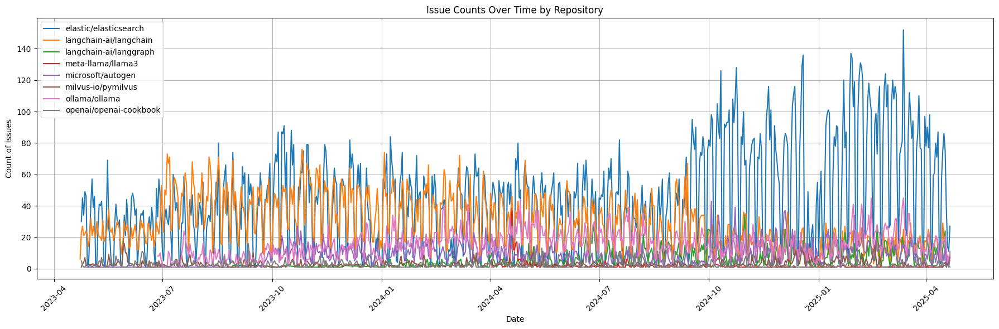

In [ ]:
#Add your code for requirement 2 in this cell

import pandas as pd
from datetime import datetime, timedelta
import pytz

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days = 365* 2)).astimezone(pytz.UTC)

req2 = pd.read_csv('dataset/issues_all_repo.csv')
req2 = req2.dropna(subset="created_at")

req2['created_at'] = pd.to_datetime(req2['created_at'], errors='coerce').dt.tz_convert('UTC')

req2['only_date'] = req2['created_at'].dt.date
req2 = req2[req2['created_at'] >= oldDate]

issues = req2.groupby(['repository', 'only_date']).size().reset_index(name="Count-of-Issues")
issues.tail(35)

issues['only_date'] = pd.to_datetime(issues['only_date'])

plt.figure(figsize=(18, 6))
 
for repo in issues["repository"].unique():
    repo_data = issues[issues["repository"] == repo]
    plt.plot(repo_data["only_date"], repo_data["Count-of-Issues"], label=repo)

# Adding labels and title
plt.title("Issue Counts Over Time by Repository")
plt.xlabel("Date")
plt.ylabel("Count of Issues")
plt.xticks(rotation=45)
plt.legend(title="Repository Name")
plt.grid(True)
plt.tight_layout()
 
plt.show()

 

<hr style="border:1px solid black"> </hr>

<div class="alert alert-info">   
    
## REQUIREMENT 3
- A bar chart to plot the issues created for every month for every repository
    
</div>

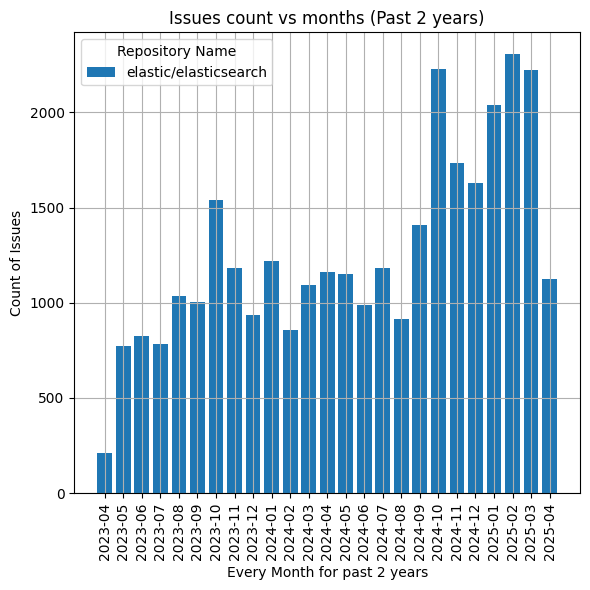

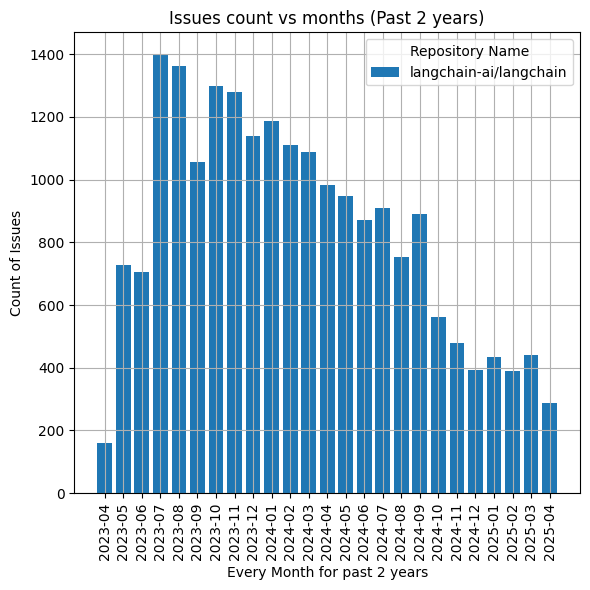

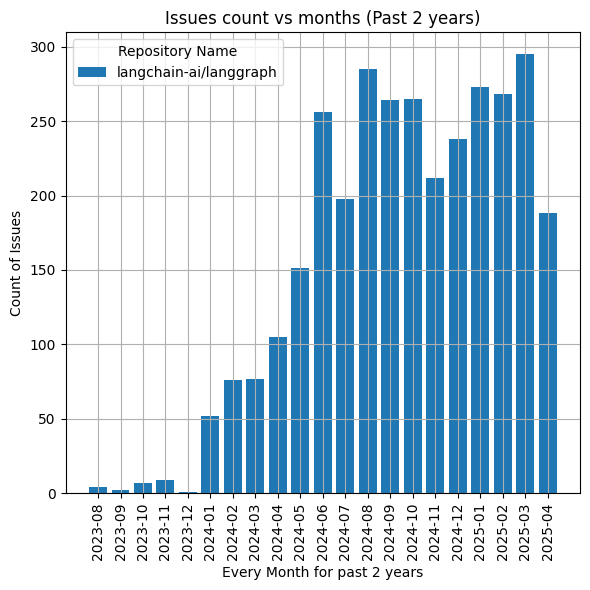

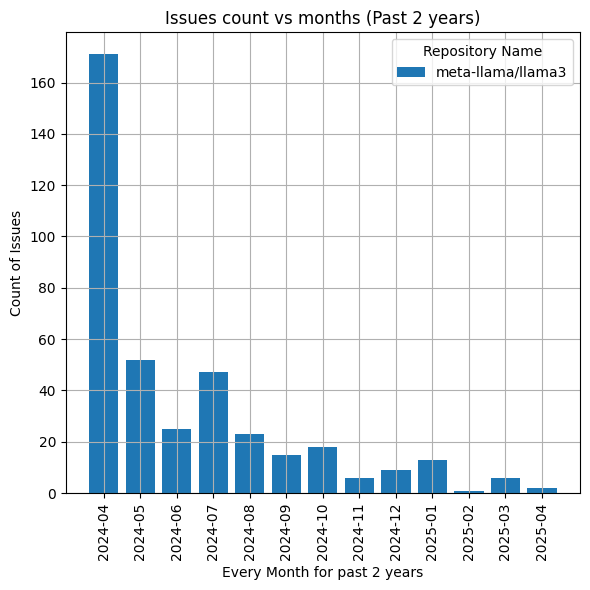

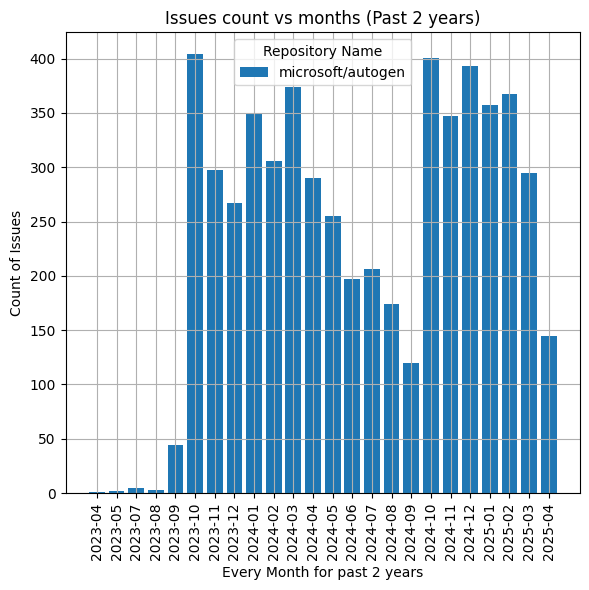

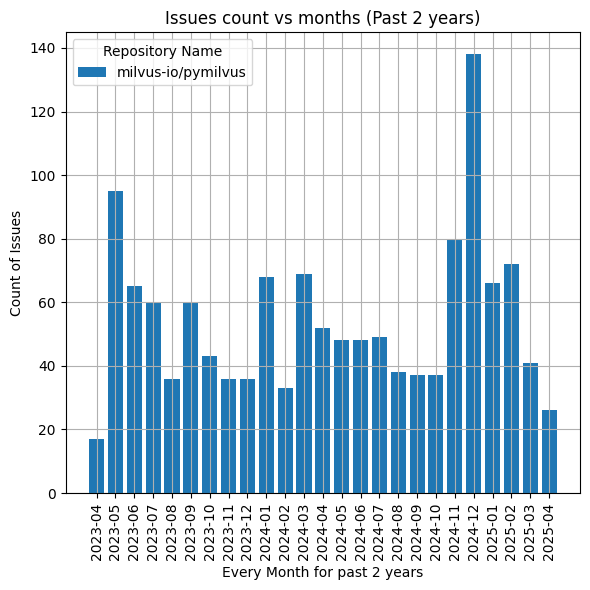

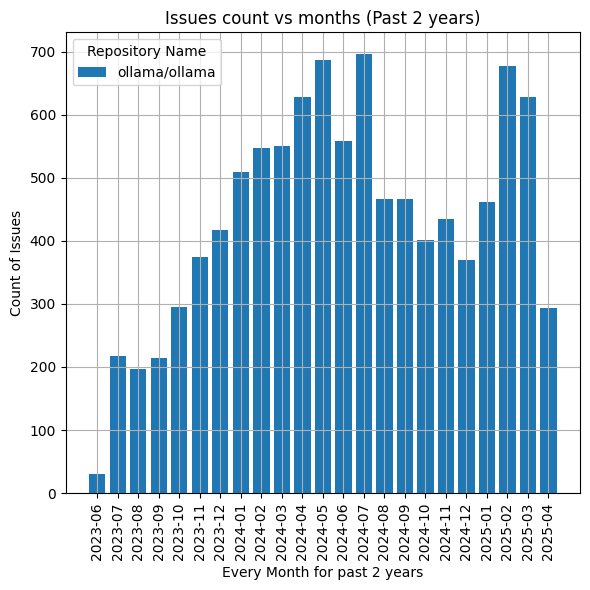

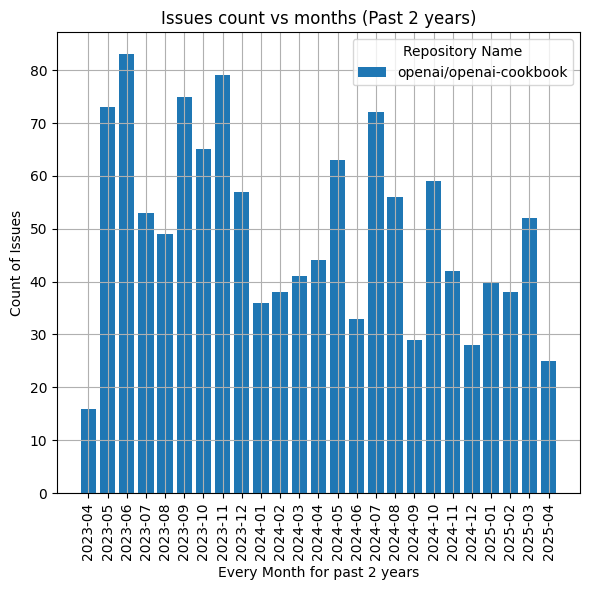

In [51]:
#Add your code for requirement 3 in this cell

from datetime import datetime, timedelta
import pytz

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days = 365 * 2)).astimezone(pytz.UTC)

req3 = pd.read_csv('dataset/issues_all_repo.csv')
req3 = req3.dropna(subset="created_at")

req3['created_at'] = pd.to_datetime(req3['created_at'], errors='coerce').dt.tz_convert('UTC')

req3['only_date'] = req3['created_at'].dt.date
req3 = req3[req3['created_at'] >= oldDate]

req3['only_date'] = pd.to_datetime(req3['only_date'])

req3["month"] = req3["only_date"].dt.to_period("M")

issues = req3.groupby(['repository', 'month']).size().reset_index(name="Count-of-Issues")

issues.head(35)

issues["month"] = issues["month"].astype(str)
 
for repo in issues["repository"].unique():
    plt.figure(figsize=(6, 6))
    repo_data = issues[issues["repository"] == repo]
    plt.bar(repo_data["month"], repo_data["Count-of-Issues"], label=repo)

    plt.title("Issues count vs months (Past 2 years)")
    plt.xlabel("Every Month for past 2 years")
    plt.ylabel("Count of Issues")
    plt.xticks(rotation=90)
    plt.legend(title="Repository Name")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 4
- A bar chart to plot the starts for every repository
    
</div>

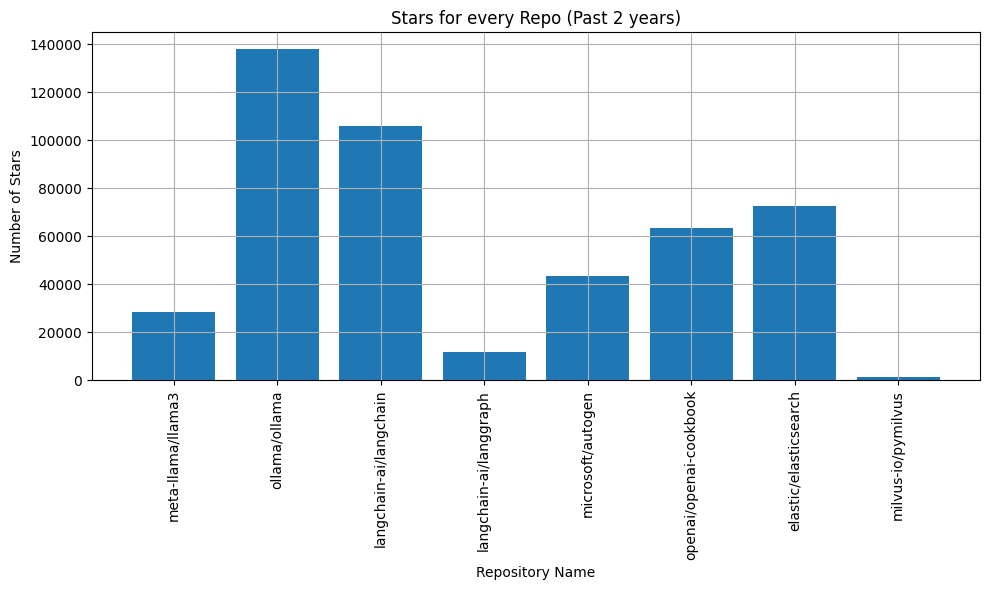

In [59]:
#Add your code for requirement 4 in this cell
req4 = pd.read_csv('dataset/all_repo_stars.csv')
req4.head()

plt.figure(figsize=(10,6))
plt.bar(req4["Repository"], req4["Stars"])
plt.title("Stars for every Repo (Past 2 years)")
plt.xlabel("Repository Name")
plt.ylabel("Number of Stars")
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 5
- A bar chart to plot the forks for every repository
    
</div>

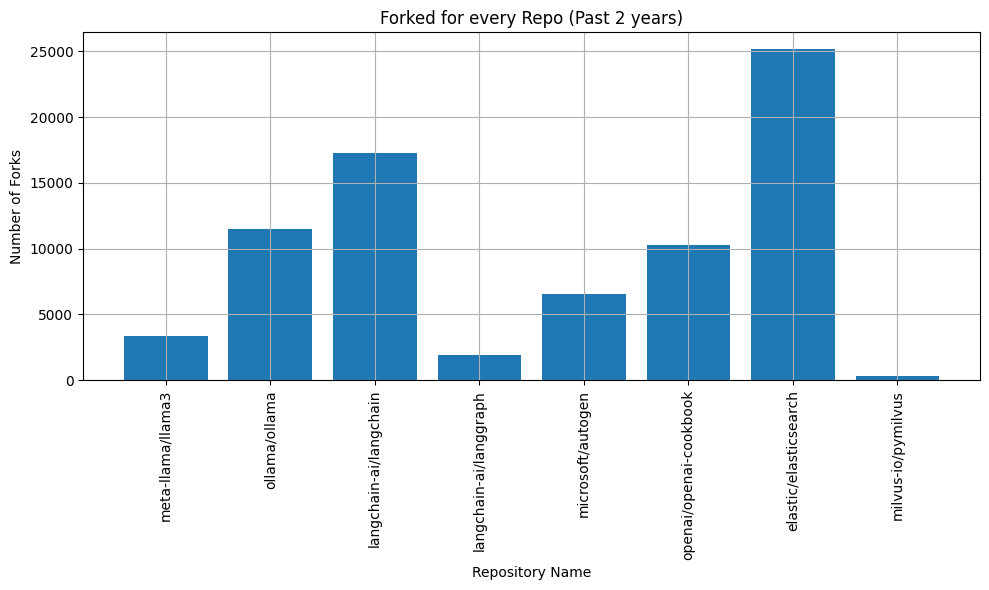

In [63]:
#Add your code for requirement 5 in this cell

req5 = pd.read_csv('dataset/all_repo_forkedIssues.csv')
req5.head()

plt.figure(figsize=(10,6))
plt.bar(req5["Repository"], req5["Forks"])
plt.title("Forked for every Repo (Past 2 years)")
plt.xlabel("Repository Name")
plt.ylabel("Number of Forks")
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 6
- A bar chart to plot the issues closed for every week for every repository
    
</div>

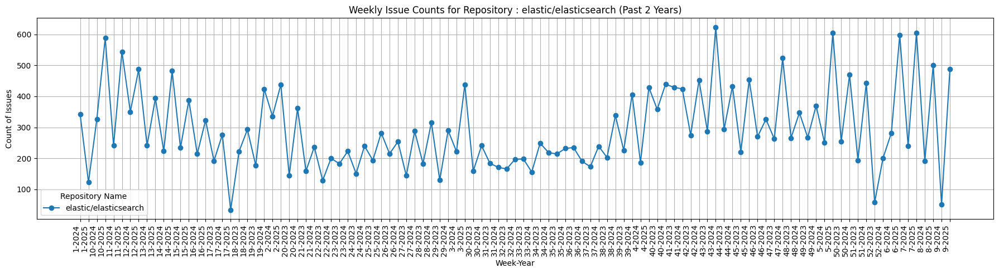

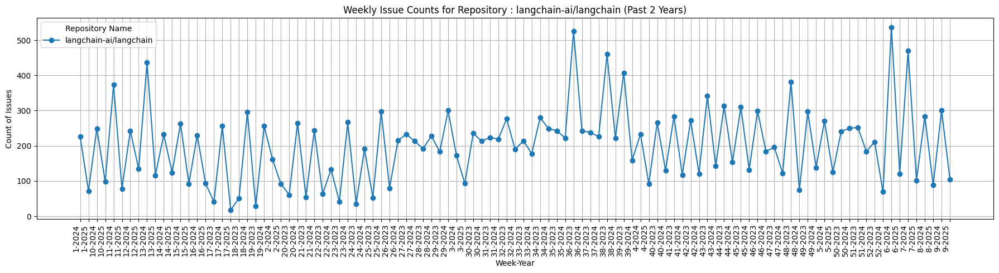

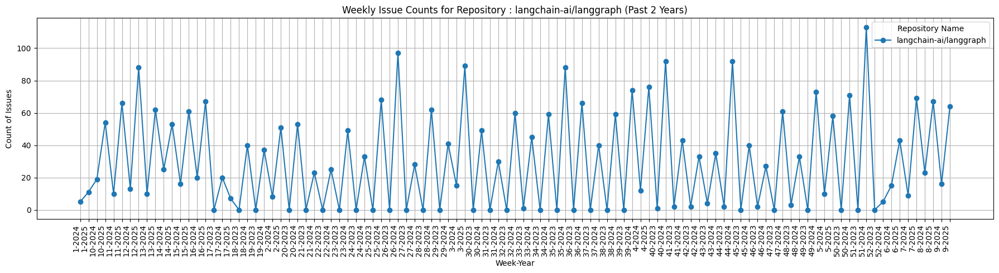

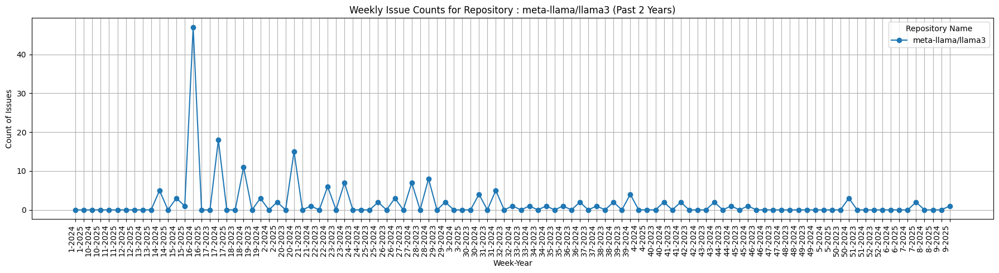

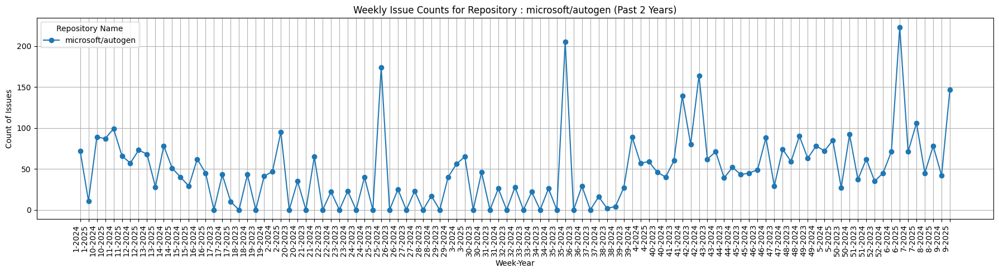

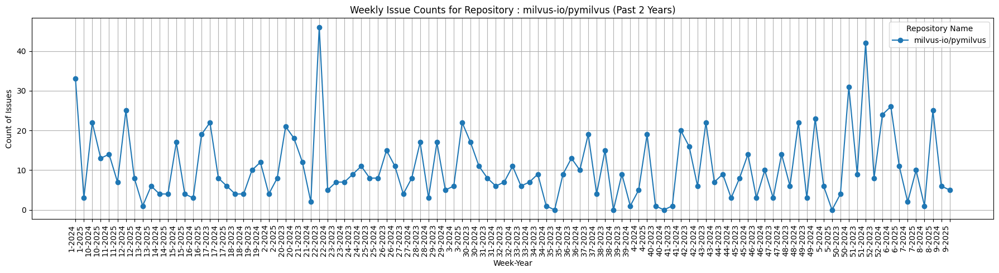

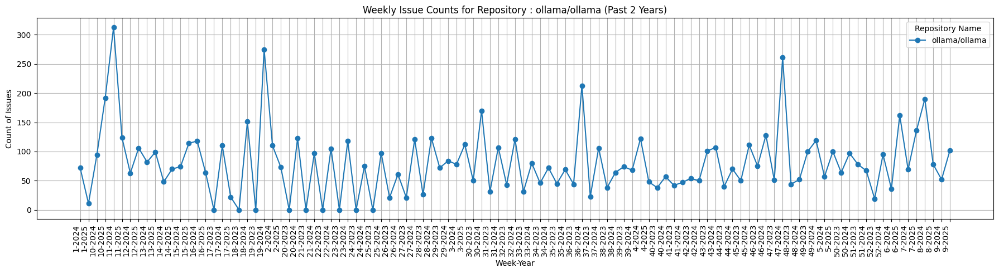

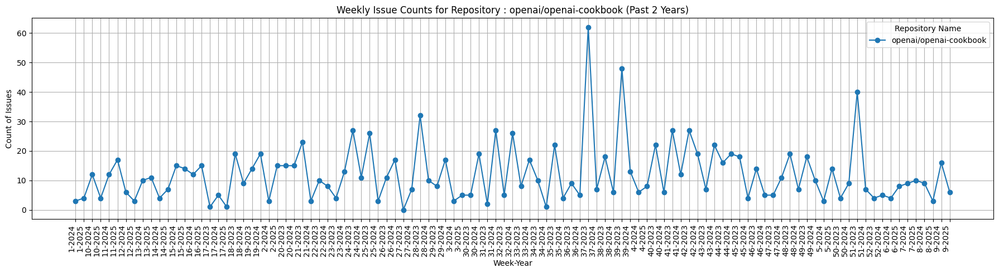

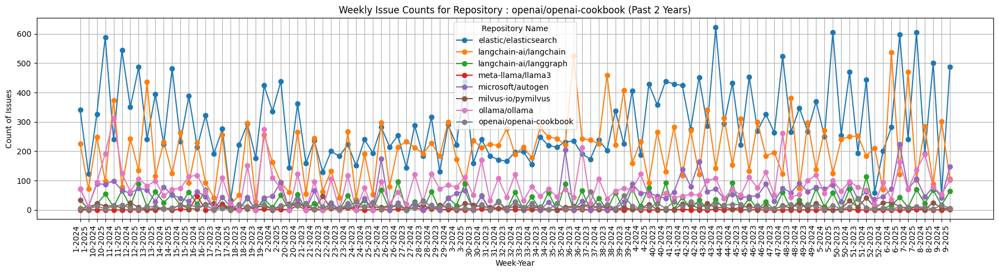

In [122]:
from datetime import datetime, timedelta
import pytz
import pandas as pd


nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).astimezone(pytz.UTC)

req6 = pd.read_csv('dataset/issues_all_repo.csv')

req6['closed_at'] = pd.to_datetime(req6['closed_at'], errors='coerce')

issues = req6.dropna(subset=['closed_at'])
issues = issues[issues['closed_at'] >= oldDate]

issues['week_based'] = issues['closed_at'].apply(lambda x: f"{x.isocalendar().week}-{x.year}")

weeklyInfo = issues.groupby(['repository', 'week_based']).size().reset_index(name='Count-of-Issues')

pivot_data = weeklyInfo.pivot(index='week_based', columns='repository', values='Count-of-Issues').fillna(0)


for repoName in pivot_data.columns:
    plt.figure(figsize=(18, 5))
    plt.plot(pivot_data.index, pivot_data[repoName], label=repoName, marker='o', linestyle='-')
    plt.title(f"Weekly Issue Counts for Repository : {repoName} (Past 2 Years)")
    plt.xlabel("Week-Year")
    plt.ylabel("Count of Issues")
    plt.xticks(rotation=90, ha='right')
    plt.legend(title="Repository Name")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plt.figure(figsize=(18, 5))
for repoName in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[repoName], label=repoName, marker='o', linestyle='-')
plt.title(f"Weekly Issue Counts for Repository : {repoName} (Past 2 Years)")
plt.xlabel("Week-Year")
plt.ylabel("Count of Issues")
plt.xticks(rotation=90, ha='right')
plt.legend(title="Repository Name")
plt.grid(True)
plt.tight_layout()
plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 7
- A stack-bar Chart to plot the created and closed issues for every repository
    
</div>

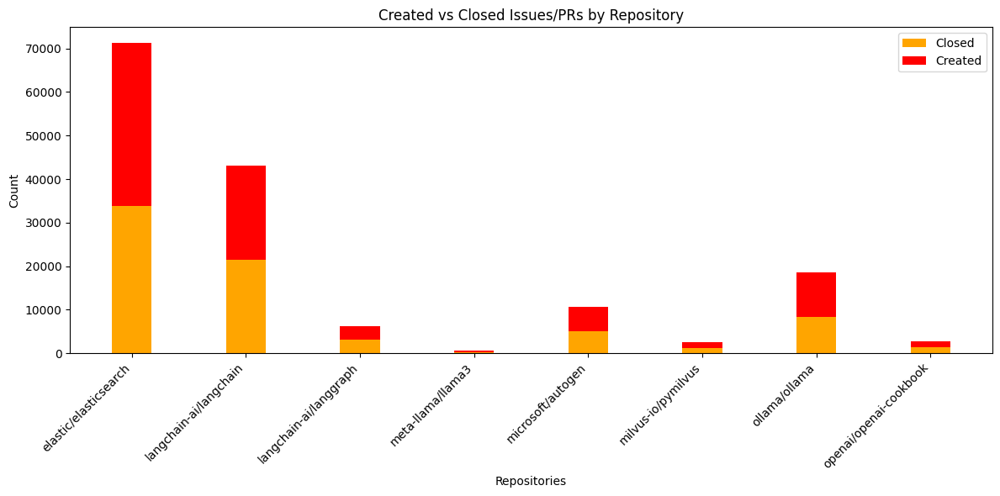

In [143]:
#Add your code for requirement 7 in this cell

from datetime import datetime, timedelta
import pytz
import pandas as pd

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).astimezone(pytz.UTC)

req7 = pd.read_csv('dataset/issues_all_repo.csv')

req7['created_at'] = pd.to_datetime(req7['created_at'], errors='coerce')
req7['closed_at'] = pd.to_datetime(req7['closed_at'], errors='coerce')

issues = req7[(req7['created_at'] >= oldDate) | (req7['closed_at'] >= oldDate)]

createdColumnSum = req7.groupby('repository')['created_at'].count()
closedColumnSum =  req7.dropna(subset = ['closed_at']).groupby('repository')['closed_at'].count()

repositories = [
    'elastic/elasticsearch',
    'langchain-ai/langchain',
    'langchain-ai/langgraph',
    'meta-llama/llama3',
    'microsoft/autogen',
    'milvus-io/pymilvus',
    'ollama/ollama',
    'openai/openai-cookbook'
]
createdByList =[]
for i in createdColumnSum:
    createdByList.append(i)

closedByList =[]
for i in closedColumnSum:
    closedByList.append(i)

fig, ax = plt.subplots(figsize=(12, 6))
bar_width = 0.35
x = np.arange(len(repositories))

bars1 = ax.bar(x, closedByList, bar_width, label='Closed', color='orange')
bars2 = ax.bar(x, createdByList, bar_width, bottom=closedByList, label='Created', color='red')
ax.set_xlabel('Repositories')
ax.set_ylabel('Count')
ax.set_title('Created vs Closed Issues/PRs by Repository')
ax.set_xticks(x)
ax.set_xticklabels(repositories, rotation=45, ha='right')
ax.legend()
plt.tight_layout()
plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 8 (TENSORFLOW/KERAS LSTM)
- Use TensorFlow/Keras LSTM package to forecast the following for every repository  
</div>

<div class="alert alert-block alert-success">   
    
#### REQ8-1). The day of the week maximum number of issues created
    
</div>

In [156]:
%pip install scikit-learn
%pip install tensorflow matplotlib python-dateutil


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python3.10 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
  Using cached tensorflow-2.19.0-cp310-cp310-macosx_12_0_arm64.whl.metadata (4.0 kB)
  Using cached absl_py-2.2.2-py3-none-any.whl.metadata (2.6 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Using cached flatbuffers-25.2.10-py2.py3-none-any.whl.metadata (875 bytes)
  Using cached gast-0.6.0-py3-none-any.whl.metadata (1.3 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl.metadata (814 bytes)
  Using cached libclang-18.1.1-1-py2.py3-none-macosx_11_0_arm64.whl.metadata (5.2 kB)
  Using cached opt_einsum-3.4.0-py3-none-any.whl.metadata (6.3 kB)
  Using cached protobuf-5.29.4-cp38-abi3-macosx_10_9_universal2.whl.metadata (592 bytes)
  Using cached termcolor-3.0.1-py3-none-any.whl.metadata (6.1 kB)
  Using cached grpcio-1.71.0-cp310-cp310-macosx_12_0_universal2.whl.m

/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues created is on Friday for the repo : meta-llama/llama3


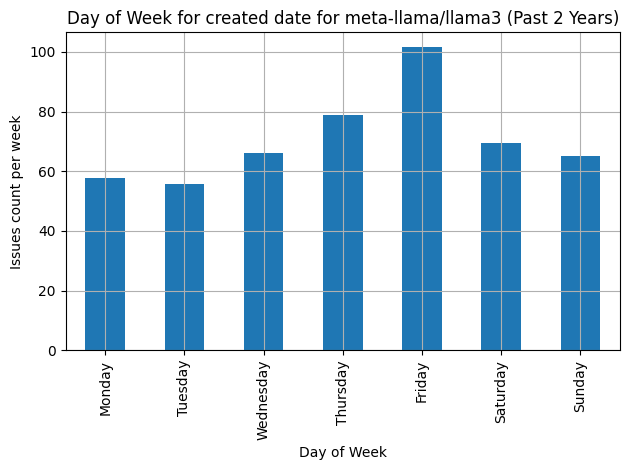

------------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues created is on Thursday for the repo : ollama/ollama


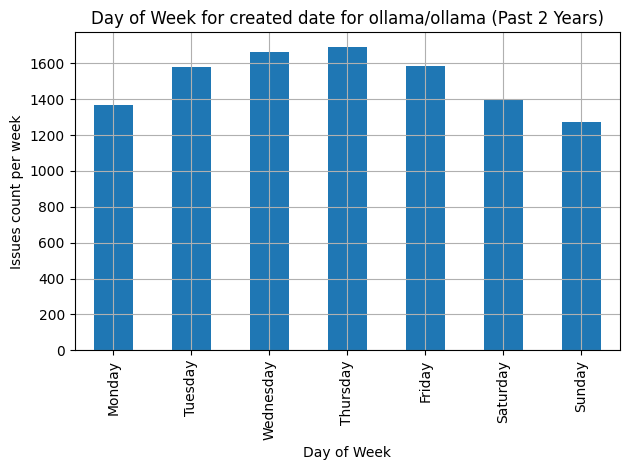

------------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues created is on Wednesday for the repo : langchain-ai/langchain


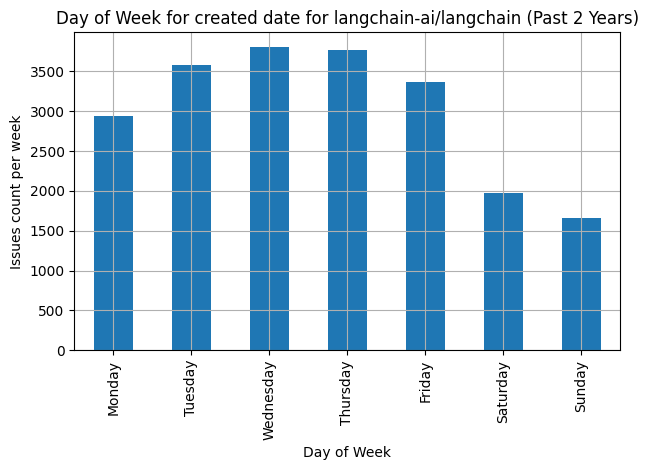

------------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues created is on Wednesday for the repo : langchain-ai/langgraph


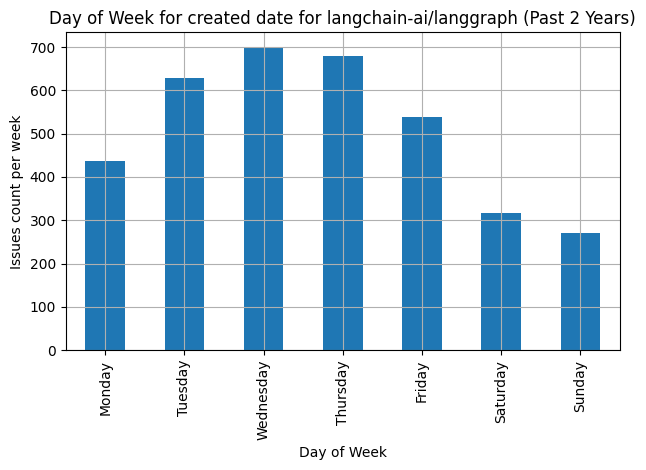

------------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues created is on Wednesday for the repo : microsoft/autogen


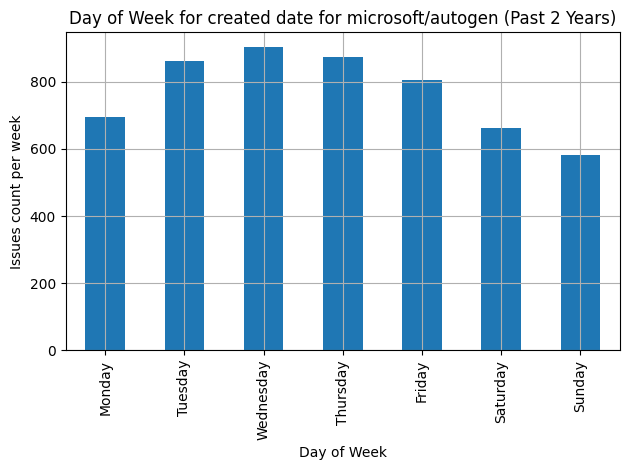

------------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues created is on Wednesday for the repo : openai/openai-cookbook


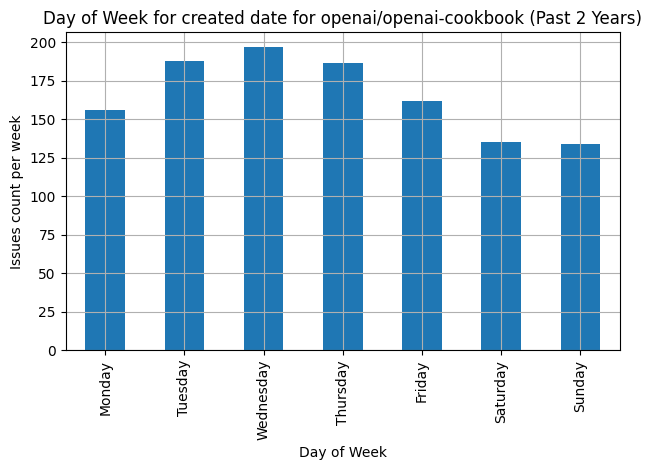

------------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues created is on Wednesday for the repo : elastic/elasticsearch


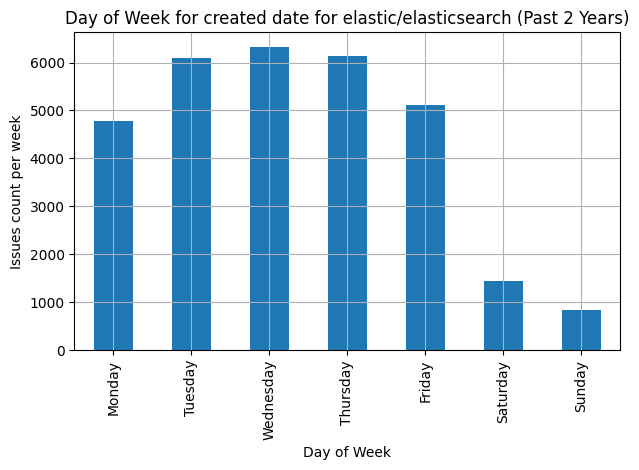

------------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues created is on Tuesday for the repo : milvus-io/pymilvus


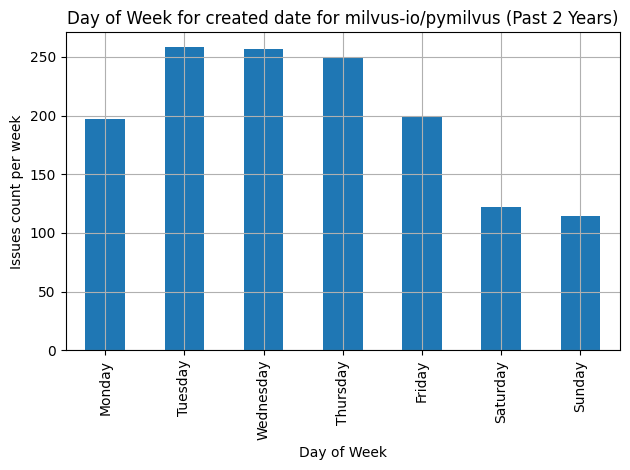

------------------------------------------------------


In [202]:
#Add your code for requirement 8.1 in this cell
import warnings
import pandas as pd
warnings.filterwarnings('ignore', category=pd.errors.SettingWithCopyWarning)

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()
weeksList = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
req8_1 = pd.read_csv("dataset/issues_all_repo.csv")

def preprocessingData(data, sequence_length=7):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i + sequence_length])
        y.append(data[i + sequence_length])
    return np.array(X), np.array(y)


def fit_lstm(X, Y):
    model = Sequential([LSTM(40, activation='relu', input_shape=(X.shape[1], 1)),Dense(1)])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, Y, epochs=20, batch_size=16, verbose=0)
    
    pred = model.predict(X, verbose=0).flatten()
    pred = scaler.inverse_transform(pred.reshape(-1, 1)).flatten()
    return pred

for i in req8_1['repository'].unique():
    
    repoBasedDf = req8_1[req8_1['repository'] == i]

    repoBasedDf['created_at'] = pd.to_datetime(repoBasedDf['created_at'], errors='coerce').dt.date
    repoBasedDfBasedOnDate = repoBasedDf.groupby('created_at').size().reset_index(name='count')

    repoBasedDfBasedOnDate['created_at'] = pd.to_datetime(repoBasedDfBasedOnDate['created_at'])
    repoBasedDfBasedOnDate = repoBasedDfBasedOnDate[(repoBasedDfBasedOnDate['created_at'] >=  pd.to_datetime(oldDate)) & (repoBasedDfBasedOnDate['created_at'] <= pd.to_datetime(nowDate))]
    repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['created_at'].dt.day_name()  

    everydayCounts = repoBasedDfBasedOnDate.groupby('created_at')['count'].sum().reindex(pd.date_range(start = pd.to_datetime(oldDate), end = pd.to_datetime(nowDate), freq='D'), fill_value = 0).values.reshape(-1, 1)

    scaler = StandardScaler()
    scaled_RepoBasedInfoCounts = scaler.fit_transform(everydayCounts)
    nSequence = 7

    X, Y = preprocessingData(scaled_RepoBasedInfoCounts, sequence_length = 7)
    X = X.reshape((X.shape[0], X.shape[1], 1)) 
    
    pred = fit_lstm(X, Y)
    
    availableDates = pd.date_range(start = pd.to_datetime(oldDate), end = pd.to_datetime(nowDate), freq='D')[7:]

    datesDF = pd.DataFrame({'createdDate': availableDates, 'pred': pred})
    datesDF['weeks'] = datesDF['createdDate'].dt.day_name()
    predByDay = datesDF.groupby('weeks')['pred'].sum().reindex(weeksList, fill_value = 0)

    print(f" The day of the week with the maximum number of issues created is on {predByDay.idxmax()} for the repo : {i}")    
    
    predByDay.plot(kind="bar")
    plt.title(f"Day of Week for created date for {i} (Past 2 Years)")
    plt.xlabel("Day of Week")
    plt.ylabel("Issues count per week")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    print("------------------------------------------------------")


<div class="alert alert-block alert-success">   
    
#### REQ8-2). The day of the week maximum number of issues closed

</div>

/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues closed is on Thursday for the repo : meta-llama/llama3


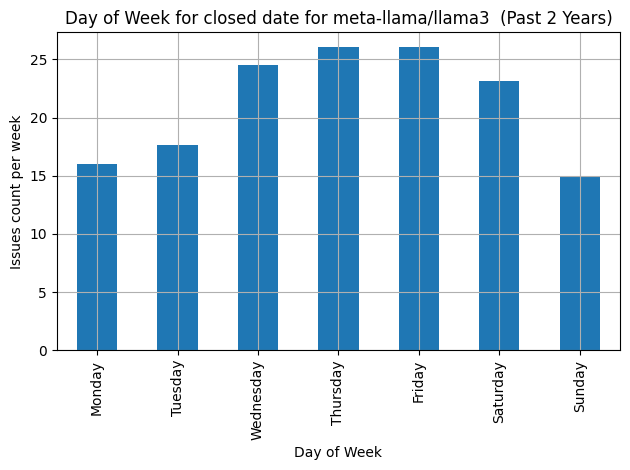

----------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues closed is on Tuesday for the repo : ollama/ollama


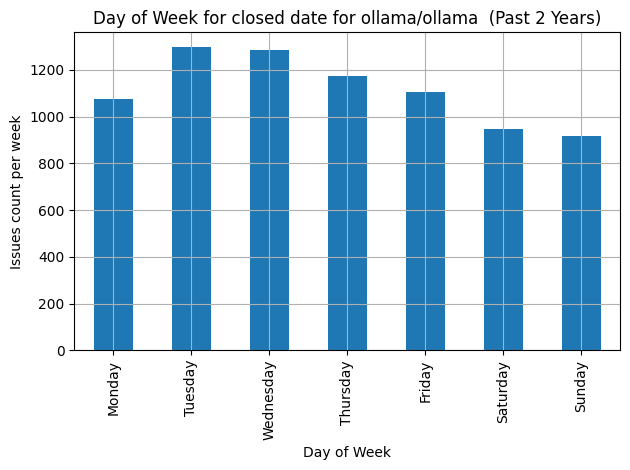

----------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues closed is on Wednesday for the repo : langchain-ai/langchain


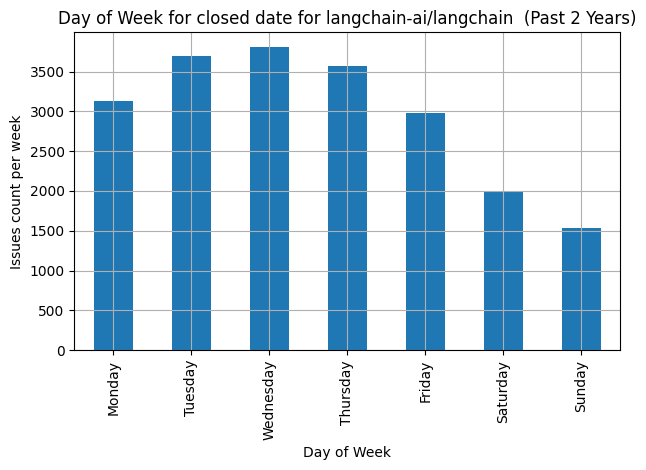

----------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues closed is on Wednesday for the repo : langchain-ai/langgraph


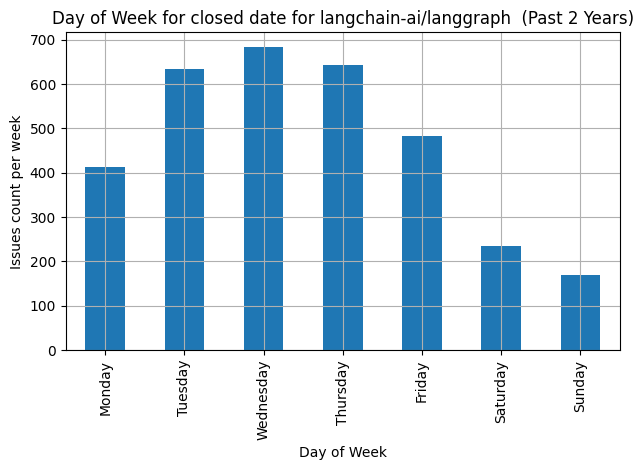

----------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues closed is on Tuesday for the repo : microsoft/autogen


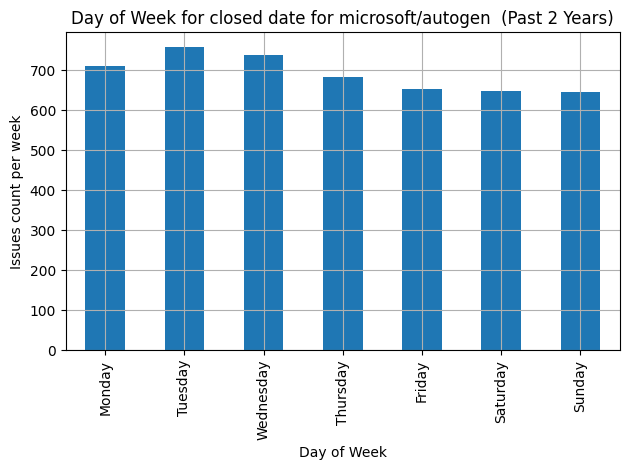

----------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues closed is on Tuesday for the repo : openai/openai-cookbook


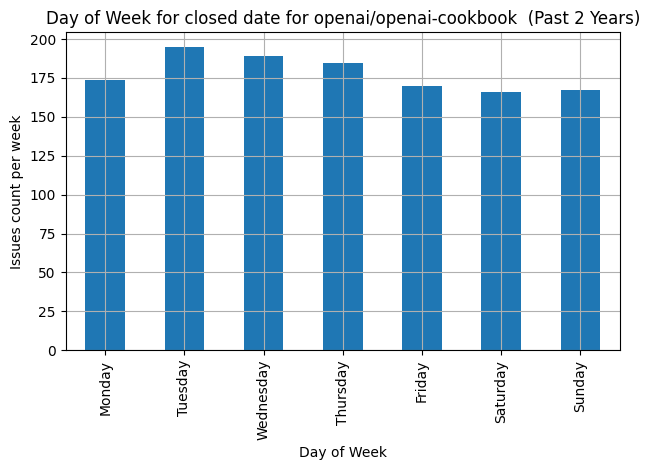

----------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues closed is on Wednesday for the repo : elastic/elasticsearch


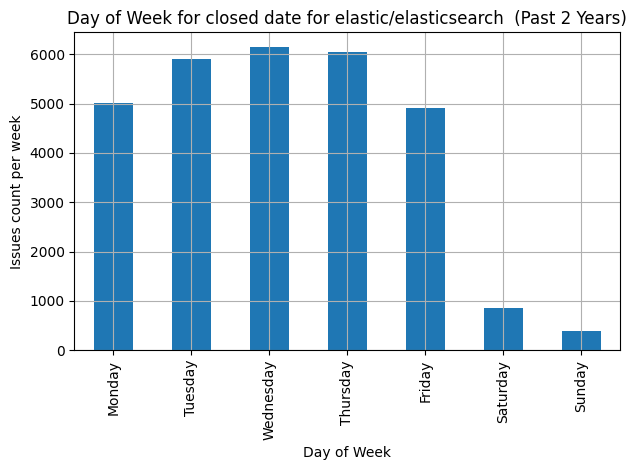

----------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 The day of the week with the maximum number of issues closed is on Tuesday for the repo : milvus-io/pymilvus


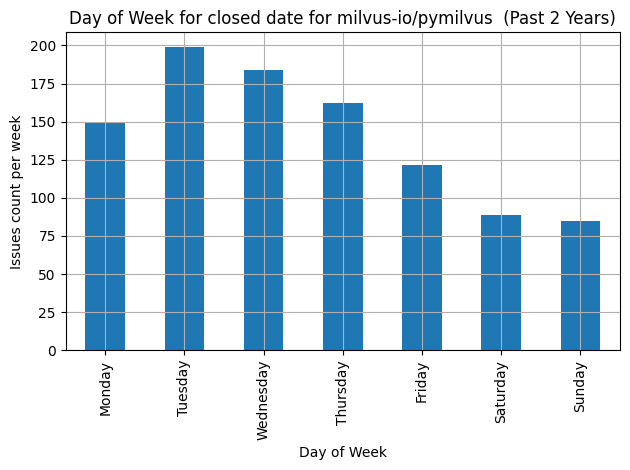

----------------------------------------------


In [210]:
#Add your code for requirement 8.2 in this cell

import warnings
import pandas as pd
warnings.filterwarnings('ignore', category=pd.errors.SettingWithCopyWarning)

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()
weeksList = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
req8_2 = pd.read_csv("dataset/issues_all_repo.csv")

def preprocessingData(data, sequence_length=7):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i + sequence_length])
        y.append(data[i + sequence_length])
    return np.array(X), np.array(y)


def fit_lstm(X, Y):
    model = Sequential([LSTM(40, activation='relu', input_shape=(X.shape[1], 1)),Dense(1)])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, Y, epochs=20, batch_size=16, verbose=0)
    
    pred = model.predict(X, verbose=0).flatten()
    pred = scaler.inverse_transform(pred.reshape(-1, 1)).flatten()
    return pred

for i in req8_2['repository'].unique():
    
    repoBasedDf = req8_2[req8_2['repository'] == i]

    repoBasedDf['closed_at'] = pd.to_datetime(repoBasedDf['closed_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset = 'closed_at')

    repoBasedDfBasedOnDate = repoBasedDf.groupby('closed_at').size().reset_index(name='count')

    repoBasedDfBasedOnDate['closed_at'] = pd.to_datetime(repoBasedDfBasedOnDate['closed_at'])
    repoBasedDfBasedOnDate = repoBasedDfBasedOnDate[(repoBasedDfBasedOnDate['closed_at'] >=  pd.to_datetime(oldDate)) & (repoBasedDfBasedOnDate['closed_at'] <= pd.to_datetime(nowDate))]
    repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['closed_at'].dt.day_name()  

    everydayCounts = repoBasedDfBasedOnDate.groupby('closed_at')['count'].sum().reindex(pd.date_range(start = pd.to_datetime(oldDate), end = pd.to_datetime(nowDate), freq='D'), fill_value = 0).values.reshape(-1, 1)

    scaler = StandardScaler()
    scaled_RepoBasedInfoCounts = scaler.fit_transform(everydayCounts)
    nSequence = 7

    X, Y = preprocessingData(scaled_RepoBasedInfoCounts, sequence_length = 7)
    X = X.reshape((X.shape[0], X.shape[1], 1)) 
    
    pred = fit_lstm(X, Y)
    
    availableDates = pd.date_range(start = pd.to_datetime(oldDate), end = pd.to_datetime(nowDate), freq='D')[7:]

    datesDF = pd.DataFrame({'closedDate': availableDates, 'pred': pred})
    datesDF['weeks'] = datesDF['closedDate'].dt.day_name()
    predByDay = datesDF.groupby('weeks')['pred'].sum().reindex(weeksList, fill_value = 0)

    print(f" The day of the week with the maximum number of issues closed is on {predByDay.idxmax()} for the repo : {i}")    
    
    predByDay.plot(kind="bar")
    plt.title(f"Day of Week for closed date for {i}  (Past 2 Years)")
    plt.xlabel("Day of Week")
    plt.ylabel("Issues count per week")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    print("----------------------------------------------")



<div class="alert alert-block alert-success">   
    
#### REQ8-3). The month of the year that has maximum number of issues closed


</div>

/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


PeriodIndex(['2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10',
             '2024-11', '2024-12', '2025-01', '2025-02', '2025-03', '2025-04'],
            dtype='period[M]')
month-name
January      8.191246
February     8.277767
March        8.397419
April        8.587830
May          8.945638
June         9.269364
July         9.237545
August       9.287972
September    8.753392
October      8.574844
November     8.308405
December     8.192773
Name: pred, dtype: float32
The month of year that has maximum number of issues closed August for the repo : meta-llama/llama3


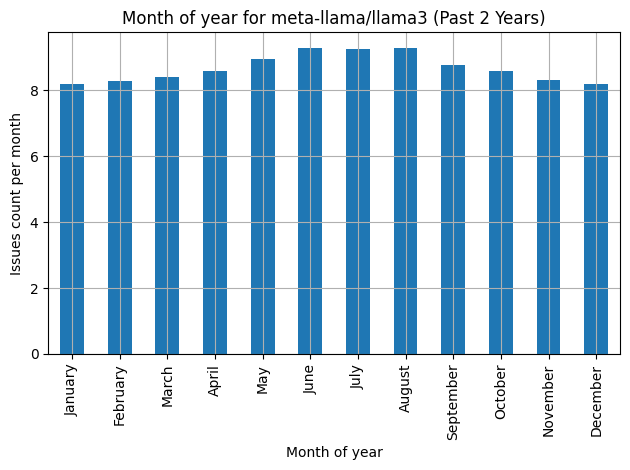

--------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


PeriodIndex(['2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10',
             '2024-11', '2024-12', '2025-01', '2025-02', '2025-03', '2025-04'],
            dtype='period[M]')
month-name
January      397.022339
February     402.420715
March        399.279755
April        389.344116
May          413.117950
June         393.691071
July         395.607452
August       390.087280
September    395.614014
October      392.586487
November     398.948669
December     391.643036
Name: pred, dtype: float32
The month of year that has maximum number of issues closed May for the repo : ollama/ollama


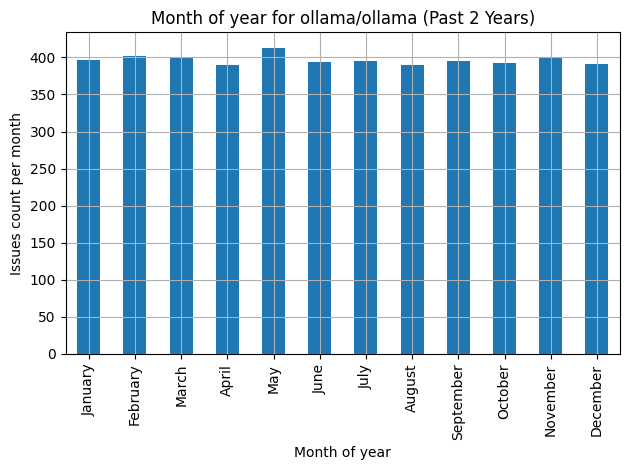

--------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


PeriodIndex(['2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10',
             '2024-11', '2024-12', '2025-01', '2025-02', '2025-03', '2025-04'],
            dtype='period[M]')
month-name
January      778.061096
February     752.012329
March        729.588867
April        714.114990
May          871.013428
June         863.331848
July         857.169800
August       856.550415
September    847.888062
October      842.408386
November     814.482361
December     789.648926
Name: pred, dtype: float32
The month of year that has maximum number of issues closed May for the repo : langchain-ai/langchain


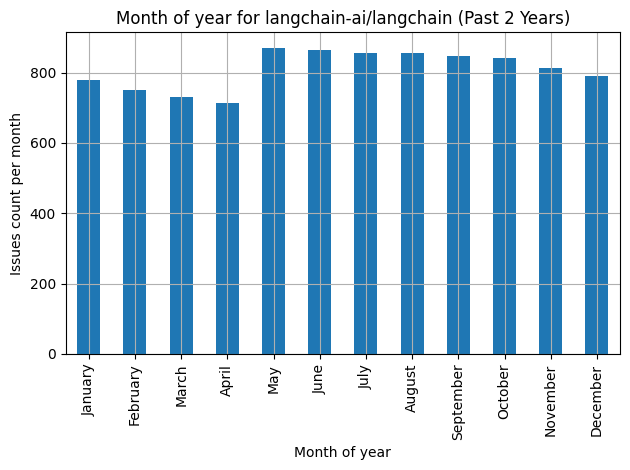

--------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


PeriodIndex(['2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10',
             '2024-11', '2024-12', '2025-01', '2025-02', '2025-03', '2025-04'],
            dtype='period[M]')
month-name
January      197.703781
February     205.671661
March        207.808746
April        214.057220
May          161.185303
June         163.186035
July         172.498993
August       173.945816
September    183.501556
October      190.901062
November     195.945099
December     191.657944
Name: pred, dtype: float32
The month of year that has maximum number of issues closed April for the repo : langchain-ai/langgraph


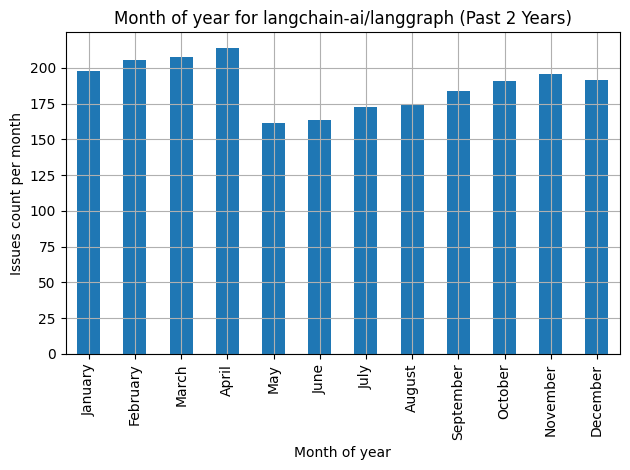

--------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


PeriodIndex(['2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10',
             '2024-11', '2024-12', '2025-01', '2025-02', '2025-03', '2025-04'],
            dtype='period[M]')
month-name
January      245.695755
February     247.058868
March        259.238312
April        258.111237
May          238.907928
June         235.004486
July         234.586533
August       231.499573
September    233.003159
October      230.451569
November     239.480774
December     243.372131
Name: pred, dtype: float32
The month of year that has maximum number of issues closed March for the repo : microsoft/autogen


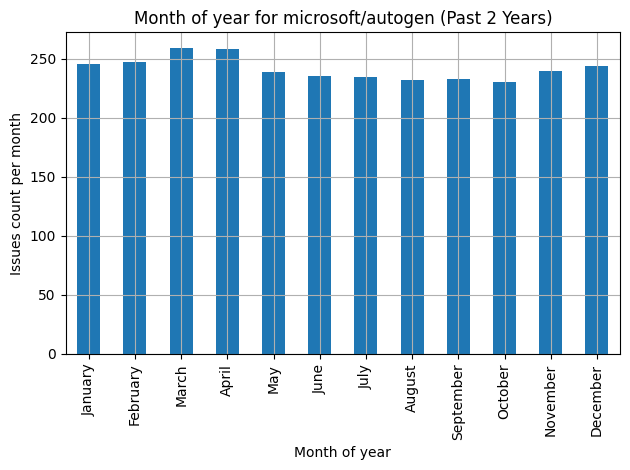

--------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


PeriodIndex(['2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10',
             '2024-11', '2024-12', '2025-01', '2025-02', '2025-03', '2025-04'],
            dtype='period[M]')
month-name
January      45.176216
February     45.811657
March        45.087288
April        44.893517
May          44.261555
June         44.966160
July         45.350967
August       45.932041
September    46.316044
October      45.844185
November     46.541267
December     46.016464
Name: pred, dtype: float32
The month of year that has maximum number of issues closed November for the repo : openai/openai-cookbook


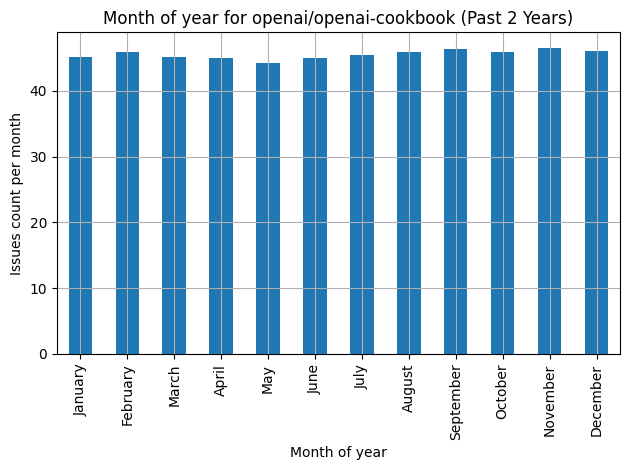

--------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


PeriodIndex(['2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10',
             '2024-11', '2024-12', '2025-01', '2025-02', '2025-03', '2025-04'],
            dtype='period[M]')
month-name
January      1390.126587
February     1390.554810
March        1388.395630
April        1395.239990
May          1453.787231
June         1438.432129
July         1426.329834
August       1412.780518
September    1411.126709
October      1407.023438
November     1412.355713
December     1404.578491
Name: pred, dtype: float32
The month of year that has maximum number of issues closed May for the repo : elastic/elasticsearch


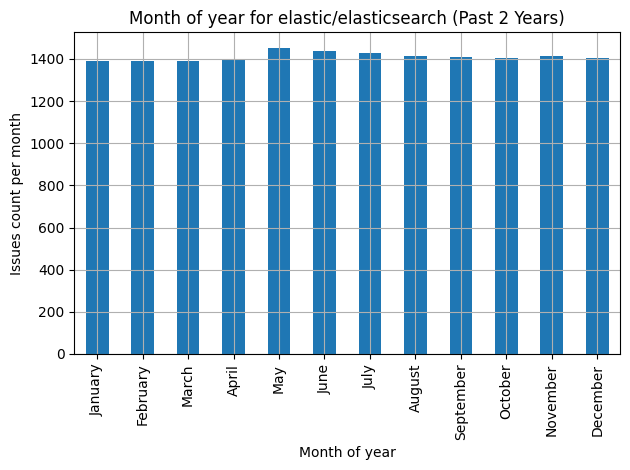

--------------------------------------------------


/opt/homebrew/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


PeriodIndex(['2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10',
             '2024-11', '2024-12', '2025-01', '2025-02', '2025-03', '2025-04'],
            dtype='period[M]')
month-name
January      52.197395
February     48.127708
March        46.619823
April        45.292088
May          46.050137
June         46.053848
July         45.975903
August       46.041321
September    45.986736
October      46.414783
November     47.020969
December     47.841167
Name: pred, dtype: float32
The month of year that has maximum number of issues closed January for the repo : milvus-io/pymilvus


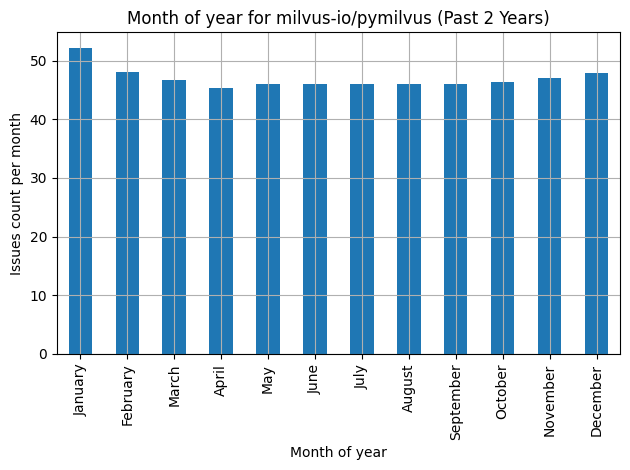

--------------------------------------------------


In [228]:
#Add your code for requirement 8.3 in this cell

#Add your code for requirement 8.1 in this cell
import warnings
import pandas as pd
warnings.filterwarnings('ignore', category=pd.errors.SettingWithCopyWarning)

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()
monthsList = [
    "January",
    "February",
    "March",
    "April",
    "May",
    "June",
    "July",
    "August",
    "September",
    "October",
    "November",
    "December"
]
req8_3 = pd.read_csv("dataset/issues_all_repo.csv")

def preprocessingData(data, sequence_length=7):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i + sequence_length])
        y.append(data[i + sequence_length])
    return np.array(X), np.array(y)


def fit_lstm(X, Y):
    model = Sequential([LSTM(40, activation='relu', input_shape=(X.shape[1], 1)),Dense(1)])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, Y, epochs=20, batch_size=16, verbose=0)
    
    pred = model.predict(X, verbose=0).flatten()
    pred = scaler.inverse_transform(pred.reshape(-1, 1)).flatten()
    return pred

for i in req8_3['repository'].unique():
    
    repoBasedDf = req8_3[req8_3['repository'] == i]

    repoBasedDf['closed_at'] = pd.to_datetime(repoBasedDf['closed_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset = 'closed_at')
    repoBasedDfBasedOnDate = repoBasedDf.groupby('closed_at').size().reset_index(name='count')

    repoBasedDfBasedOnDate['closed_at'] = pd.to_datetime(repoBasedDfBasedOnDate['closed_at'])

    repoBasedDfBasedOnMonth = repoBasedDfBasedOnDate[(repoBasedDfBasedOnDate['closed_at'] >=  pd.to_datetime(oldDate)) & (repoBasedDfBasedOnDate['closed_at'] <= pd.to_datetime(nowDate))]
    repoBasedDfBasedOnMonth['year_month'] = repoBasedDfBasedOnDate['closed_at'].dt.to_period("M")

    everyMonthCounts = repoBasedDfBasedOnMonth.groupby('year_month')['count'].sum().reindex(pd.date_range(start = pd.to_datetime(oldDate), end = pd.to_datetime(nowDate), freq='MS').to_period("M"), fill_value = 0).values.reshape(-1, 1)

    scaler = StandardScaler()
    scaled_RepoBasedInfoCounts = scaler.fit_transform(everyMonthCounts)

    X, Y = preprocessingData(scaled_RepoBasedInfoCounts, sequence_length = 12)
    X = X.reshape((X.shape[0], X.shape[1], 1))    

    pred = fit_lstm(X, Y)
    
    availableMonths = pd.date_range(start = pd.to_datetime(oldDate), end = pd.to_datetime(nowDate), freq='MS').to_period("M")[12:]

    monthDF = pd.DataFrame({'months': availableMonths, 'pred': pred})
  
    monthDF['month-name'] = monthDF['months'].dt.strftime('%B')
    predByMonth = monthDF.groupby('month-name')['pred'].sum().reindex(monthsList, fill_value = 0)
    print(predByMonth)
    print(f"The month of year that has maximum number of issues closed {predByMonth.idxmax()} for the repo : {i}")
    
    predByMonth.plot(kind="bar")
    plt.title(f"Month of year for {i} (Past 2 Years)")
    plt.xlabel("Month of year")
    plt.ylabel("Issues count per month")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    print("-"*100)

<div class="alert alert-block alert-success">   
    
#### REQ8-4). Plot the created issues forecast

</div>

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.4567
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3437
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4175
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2839
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4475
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9536
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0566
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2166
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8412
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5281
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


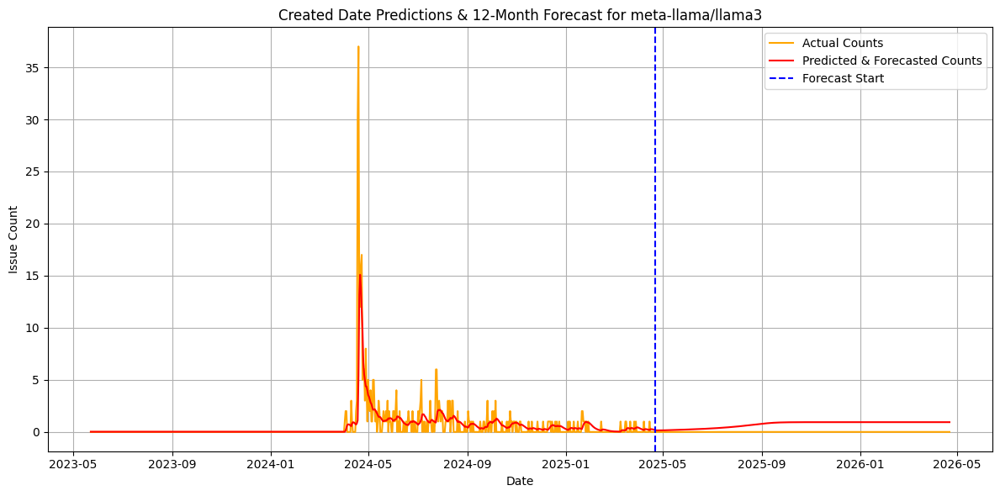

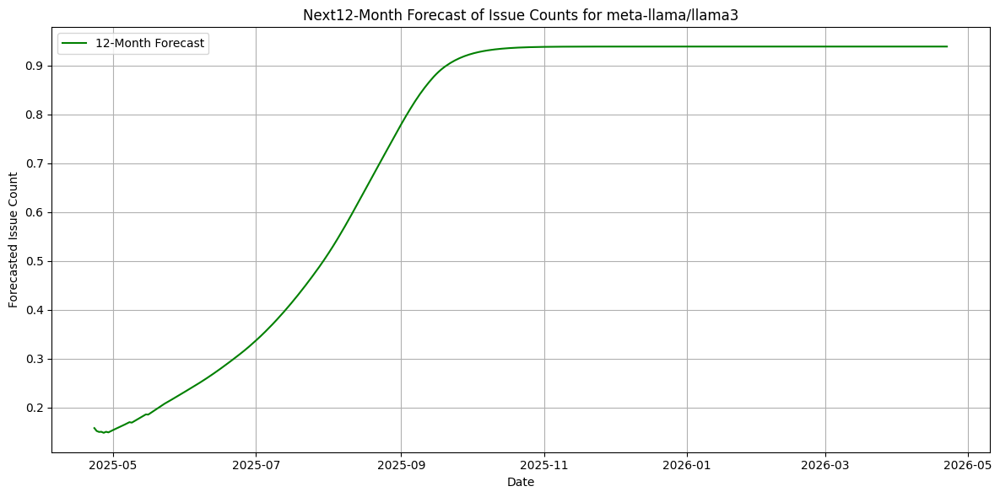

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.7628
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.5729
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4891
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6115
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5279
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4890
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5136
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5462
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4860
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5042
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


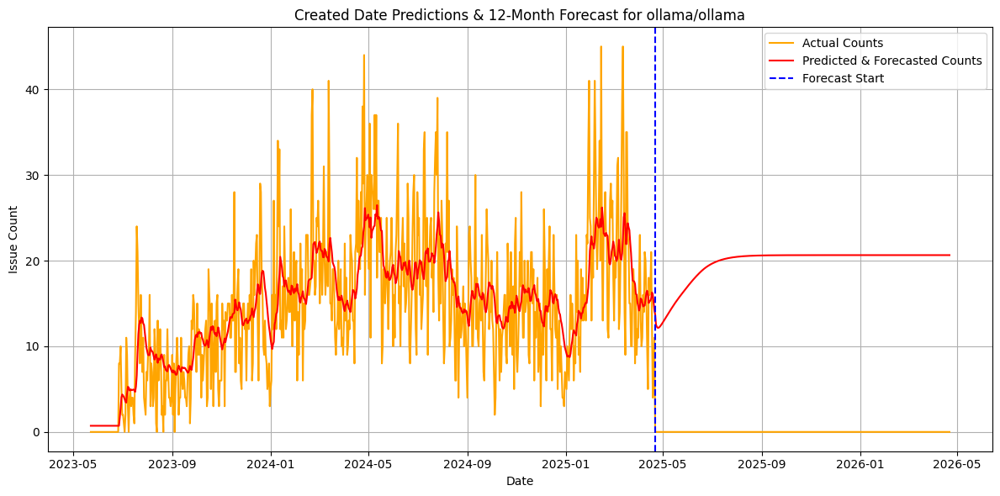

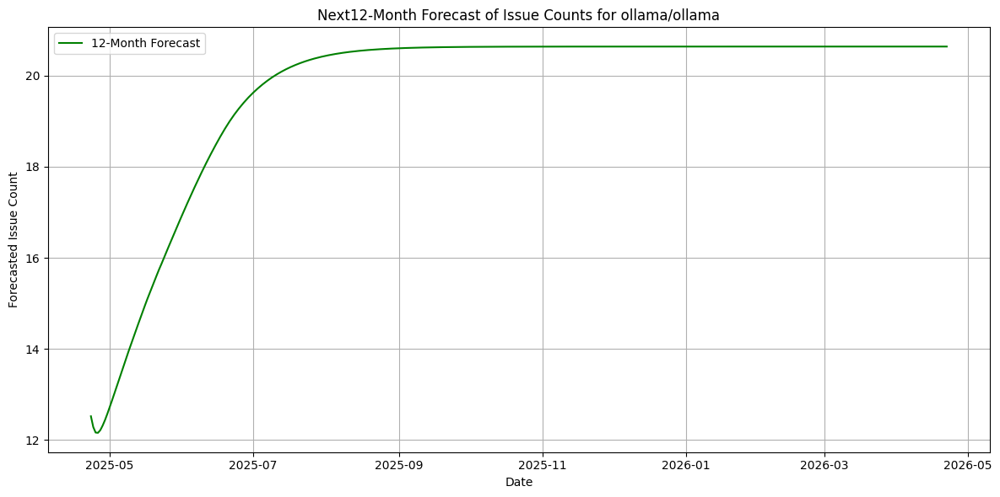

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9320
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7010
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6760
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7361
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7026
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.6741
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6262
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6781
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6706
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7107
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


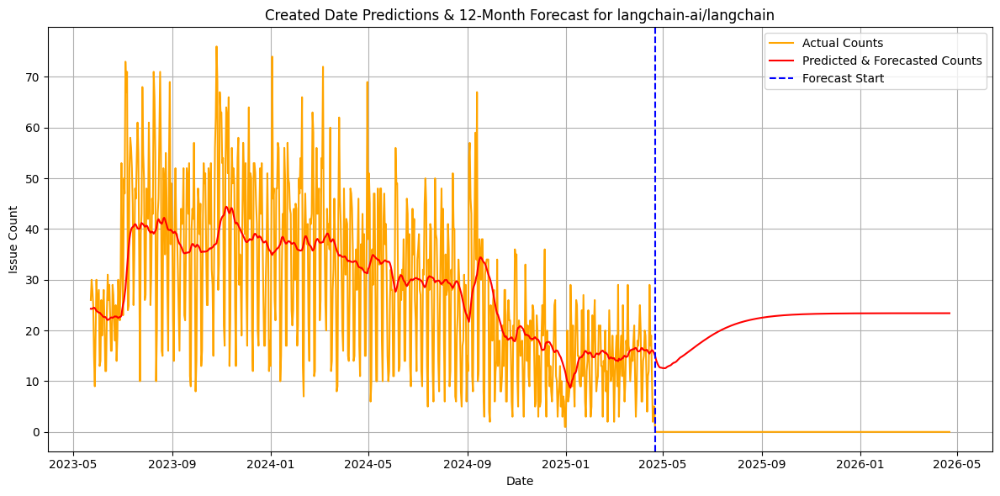

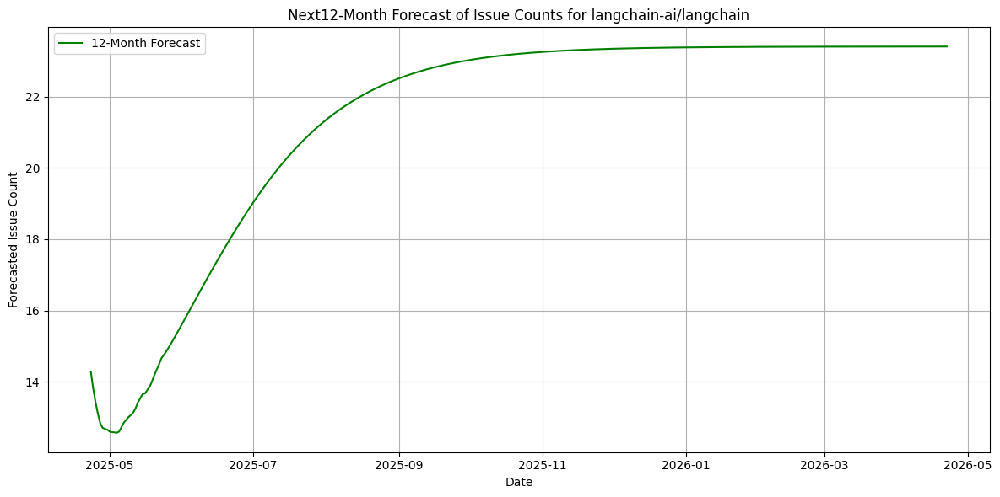

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.9325
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6278
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6869
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5426
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5987
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5935
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6972
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6264
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6787
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6689
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


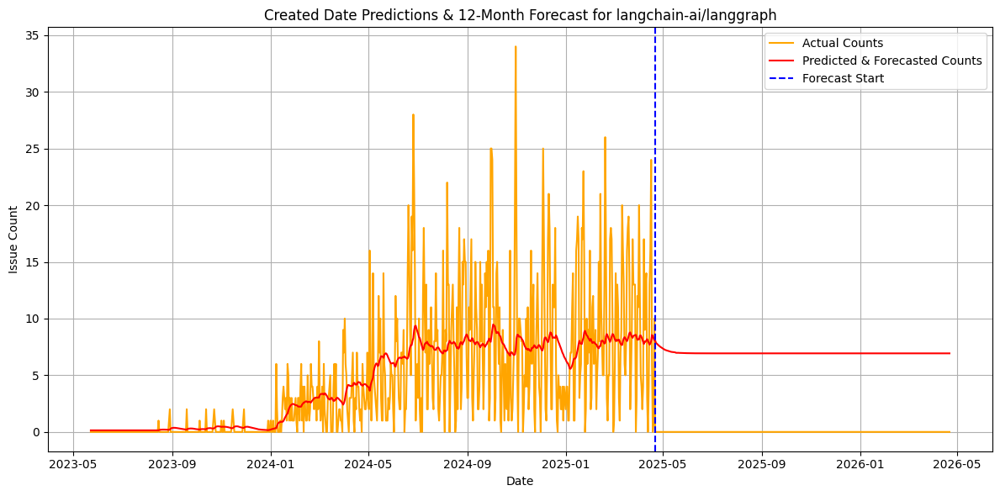

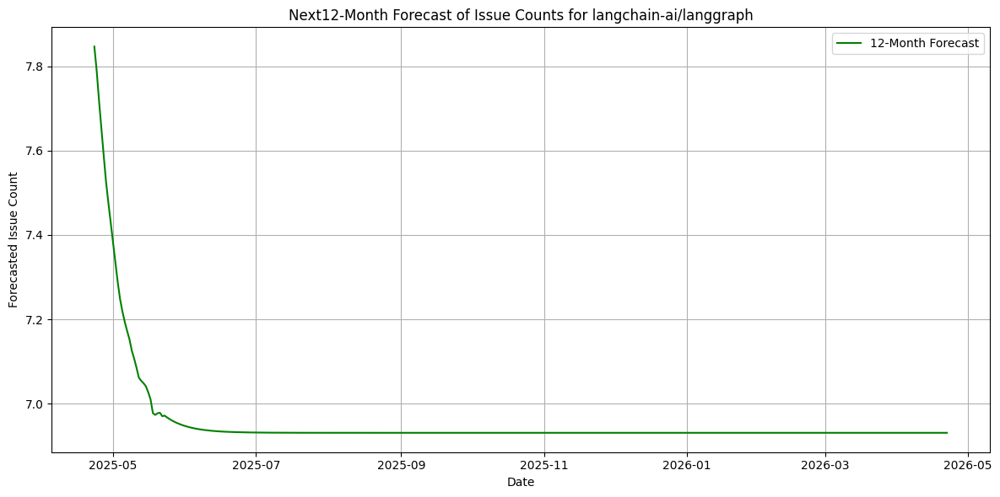

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.7883
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5546
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7141
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7163
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6490
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.6116
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.6823
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6327
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5520
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7388
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


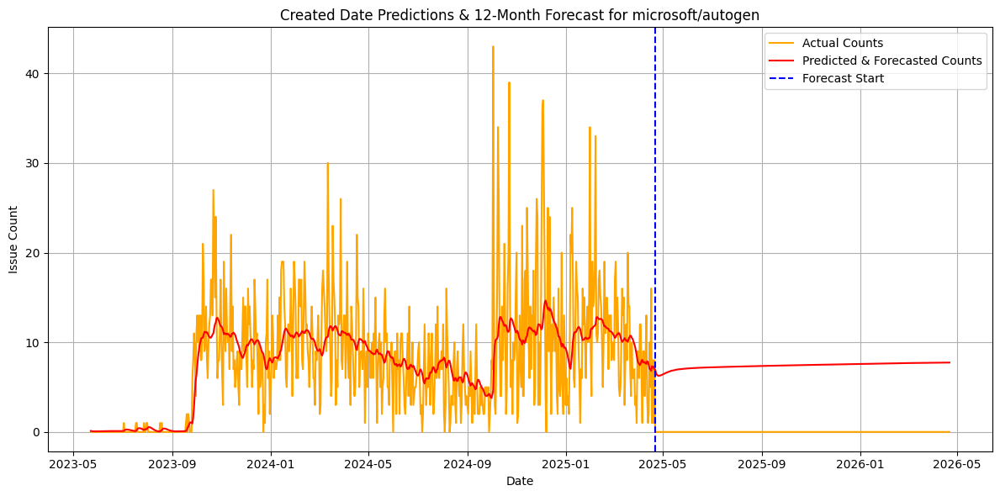

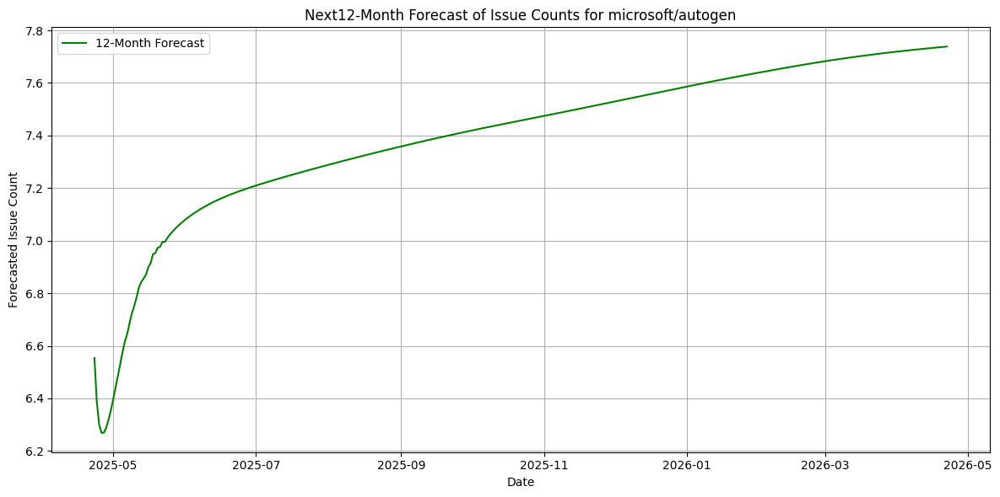

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.0307
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9247
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3826
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9068
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1840
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.1569
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9621
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0053
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0314
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0788
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


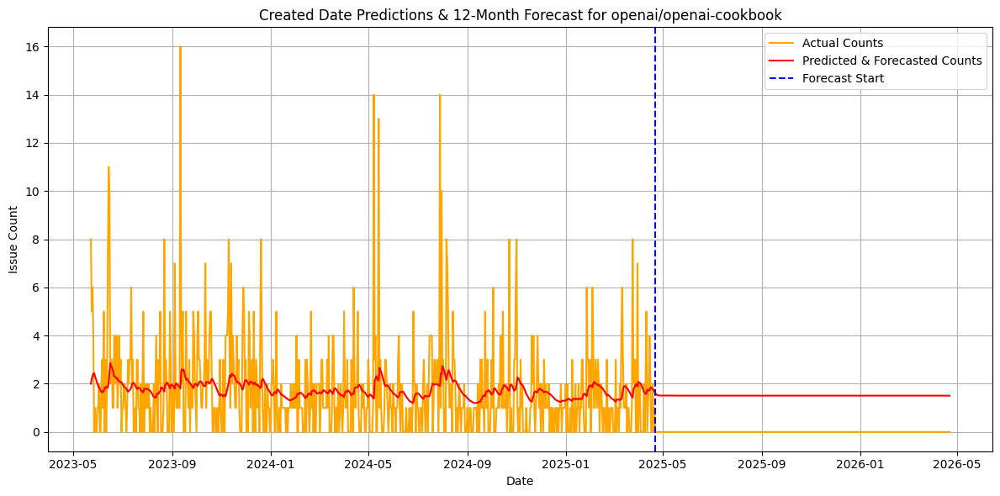

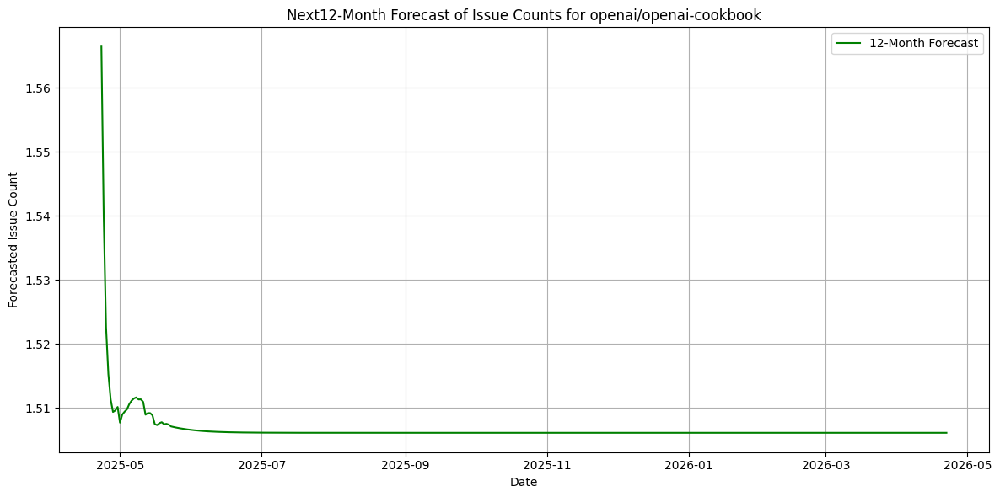

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.9247
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8468
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8330
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8195
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8521
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.8494
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8250
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.8482
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7698
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8203
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


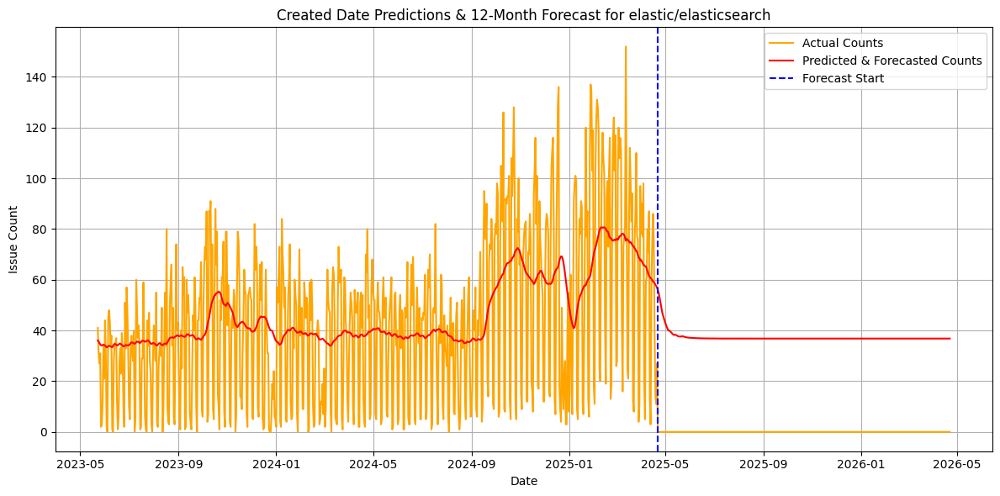

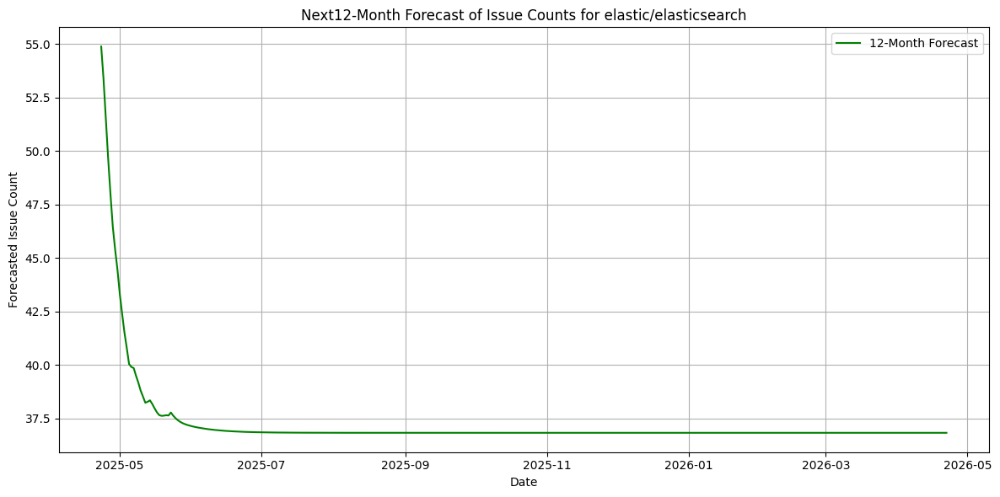

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9466
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9252
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0041
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9888
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.0167
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.9614
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8457
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.1649
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1953
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1276
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


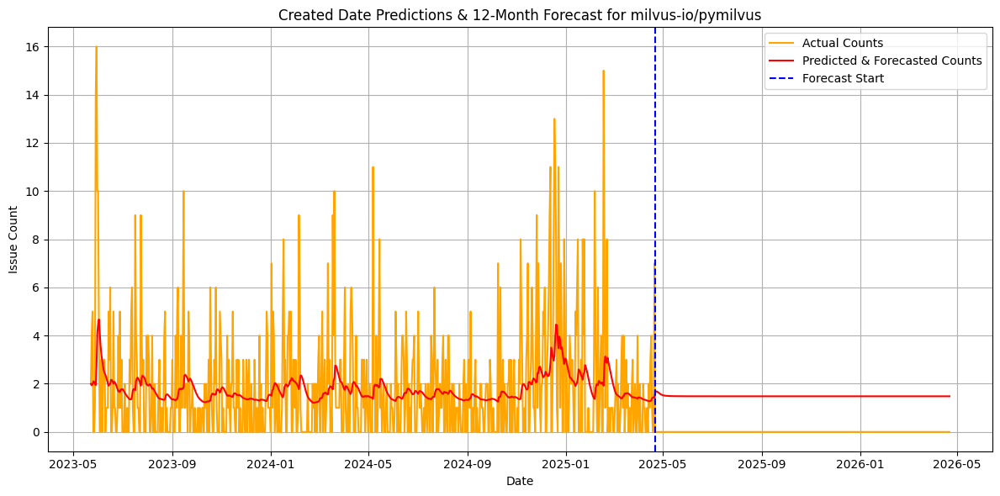

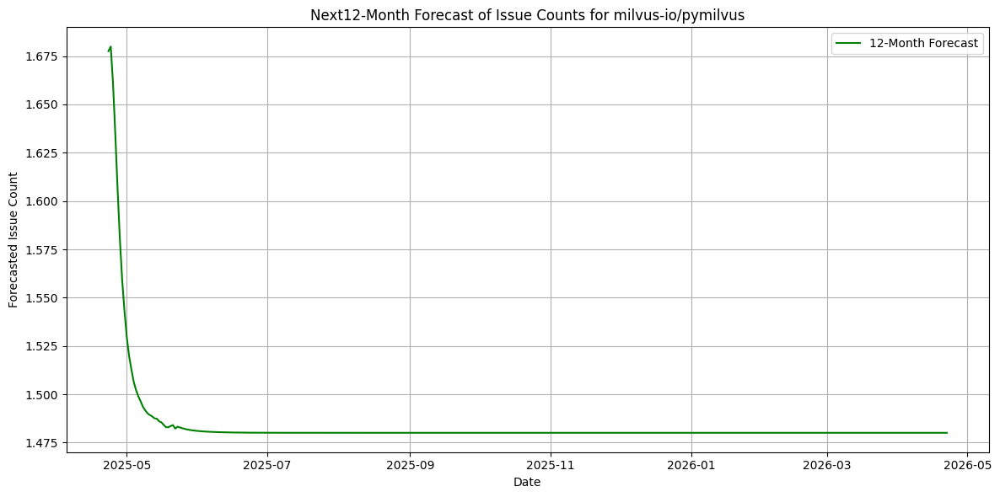

In [2]:
# #Add your code for requirement 8.4 in this cell

import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

warnings.filterwarnings(
    'ignore',
    category=UserWarning,
    message='Converting to PeriodArray/Index representation will drop timezone information'
)
warnings.filterwarnings('ignore', category=UserWarning, module='keras')

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()

req8_4 = pd.read_csv("dataset/issues_all_repo.csv")

def preprocessingData(data, sequence_length):
    X, y = [], []
    for i in range(sequence_length, len(data)):
        X.append(data[i-sequence_length:i])
        y.append(data[i])
    return np.array(X), np.array(y)

def process_LSTM(X, y):
    model = Sequential([
        Input(shape=(X.shape[1], X.shape[2])),
        LSTM(50, activation='relu', return_sequences=True),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=10, batch_size=32, verbose=1)
    return model

def forecast_future(model, last_sequence, scaler, future_days):
    forecast = []
    current_input = last_sequence
    for _ in range(future_days):
        pred = model.predict(current_input.reshape(1, *current_input.shape), verbose=0)
        forecast.append(pred[0, 0])
        current_input = np.append(current_input[1:], pred.reshape(1, 1), axis=0)
    forecast = scaler.inverse_transform(np.array(forecast).reshape(-1, 1)).flatten()
    return forecast

for i in req8_4['repository'].unique():
    repoBasedDf = req8_4[req8_4['repository'] == i].copy()
    repoBasedDf.loc[:, 'created_at'] = pd.to_datetime(repoBasedDf['created_at'], errors='coerce').dt.tz_localize(None).dt.date

    repoBasedDfBasedOnDate = repoBasedDf.groupby('created_at').size().reset_index(name='count')
    repoBasedDfBasedOnDate['created_at'] = pd.to_datetime(repoBasedDfBasedOnDate['created_at'])

    repoBasedDfBasedOnDate = repoBasedDfBasedOnDate[
        (repoBasedDfBasedOnDate['created_at'] >= pd.to_datetime(oldDate)) &
        (repoBasedDfBasedOnDate['created_at'] <= pd.to_datetime(nowDate))
    ]

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    everydayCounts = repoBasedDfBasedOnDate.groupby('created_at')['count'].sum().reset_index(name='count')
    everydayCountIndices = everydayCounts.set_index('created_at').reindex(allDates, fill_value=0).reset_index(names='created_at')
    everydayCountIndices['created_at'] = pd.to_datetime(everydayCountIndices['created_at'])

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(everydayCountIndices['count'].values.reshape(-1, 1))

    nSequence = 30
    
    X, y = preprocessingData(scaled_data, sequence_length=nSequence)
    model = process_LSTM(X, y)

    pred = model.predict(X)
    pred = scaler.inverse_transform(pred)

    everydayCountIndices = everydayCountIndices.iloc[nSequence:].reset_index(drop=True)
    everydayCountIndices['predictions'] = pred.flatten()

    # Forecasting next 12 months
    future_days = 365
    last_sequence = scaled_data[-nSequence:]
    future_preds = forecast_future(model, last_sequence, scaler, future_days)
    future_dates = pd.date_range(start=everydayCountIndices['created_at'].iloc[-1] + pd.Timedelta(days=1), periods=future_days)

    forecast_df = pd.DataFrame({
        'created_at': future_dates,
        'predictions': future_preds,
        'count': 0
    })

    combined_df = pd.concat([
        everydayCountIndices[['created_at', 'count', 'predictions']],
        forecast_df
    ], ignore_index=True)

    plt.figure(figsize=(12, 6))
    plt.plot(combined_df['created_at'], combined_df['count'], label='Actual Counts', color="orange")
    plt.plot(combined_df['created_at'], combined_df['predictions'], label='Predicted & Forecasted Counts', color="red")
    plt.axvline(x=everydayCountIndices['created_at'].iloc[-1], color='blue', linestyle='--', label='Forecast Start')
    plt.title(f'Created Date Predictions & 12-Month Forecast for {i}')
    plt.xlabel('Date')
    plt.ylabel('Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(forecast_df['created_at'], forecast_df['predictions'], label='12-Month Forecast', color='green')
    plt.title(f'Next12-Month Forecast of Issue Counts for {i}')
    plt.xlabel('Date')
    plt.ylabel('Forecasted Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<div class="alert alert-block alert-success">   
    
#### REQ8-5). Plot the closed issues forecast

</div>

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.6625
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.7951
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9068
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7987
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.2333
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.4291
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.2227
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.4487
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8519
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5834
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


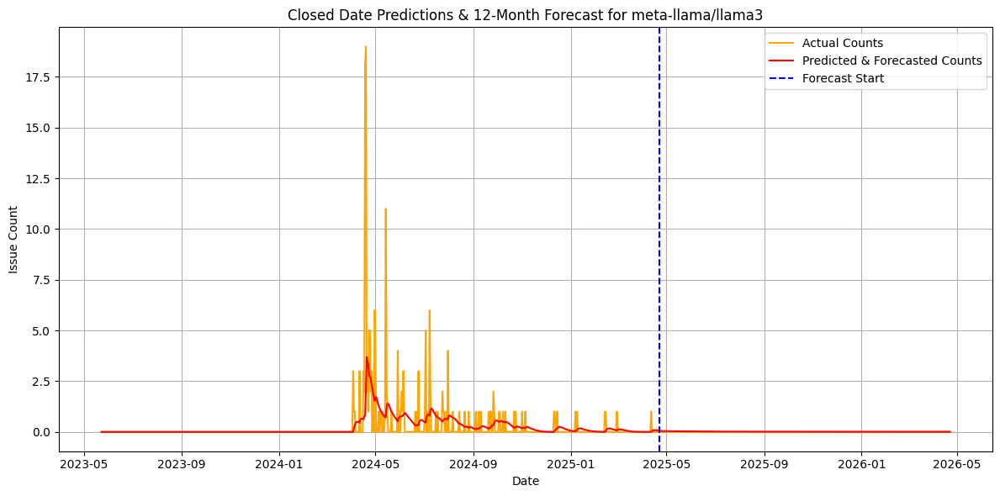

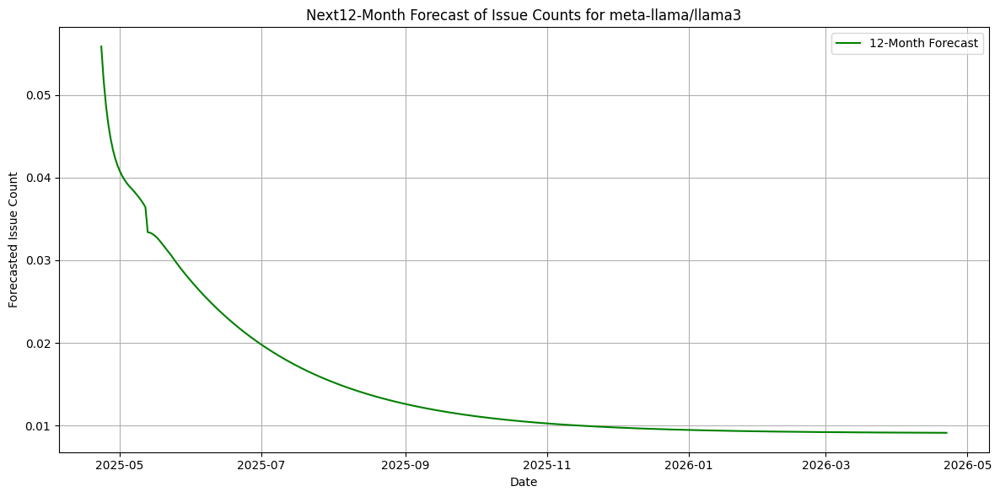

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.8552
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9588
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9405
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0294
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8122
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8910
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8517
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0736
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1385
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1413
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


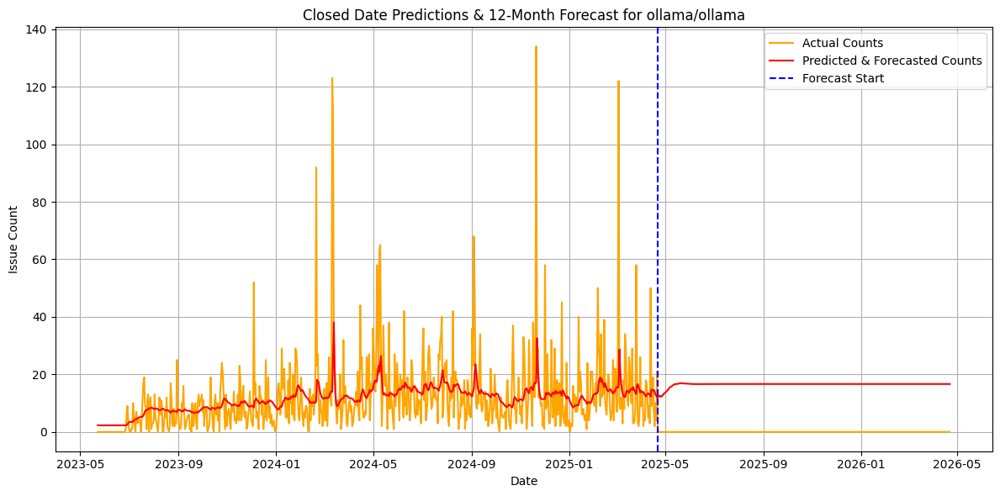

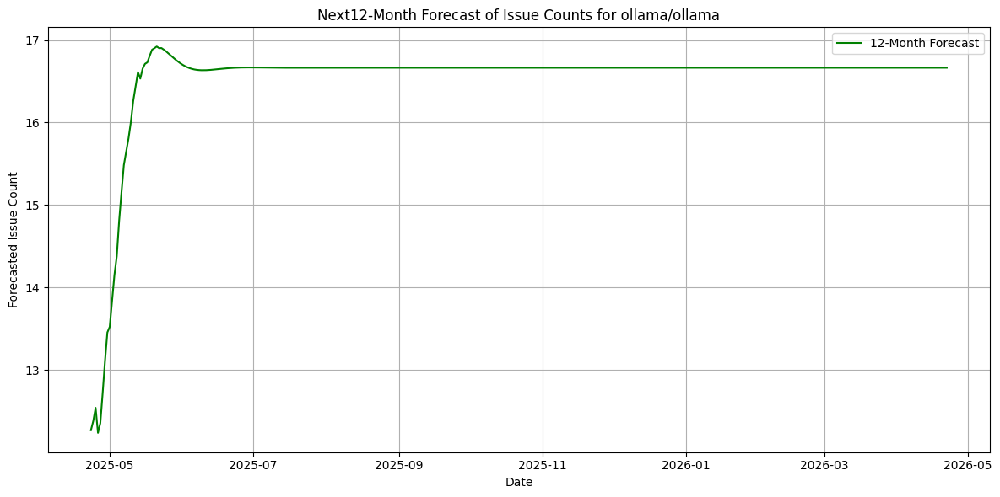

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.8704
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0414
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8667
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8316
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9384
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7636
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6009
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9478
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6471
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5672
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


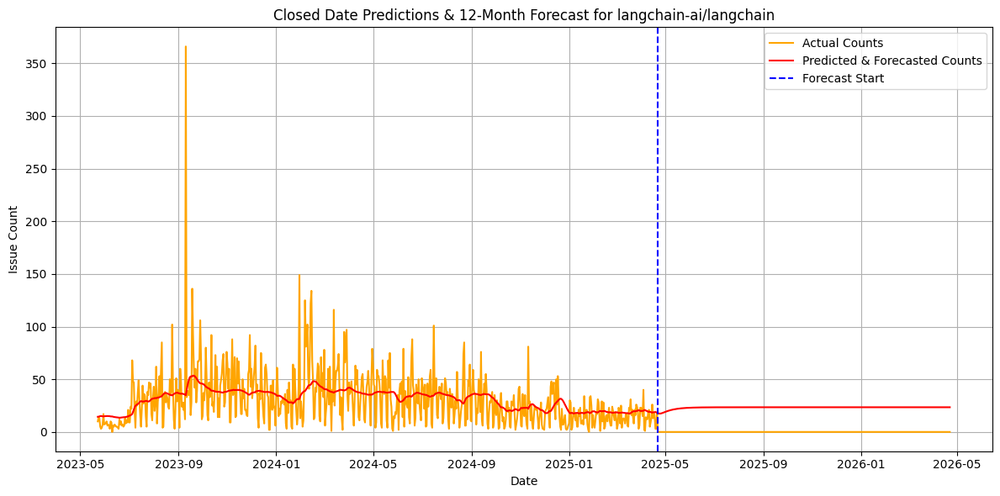

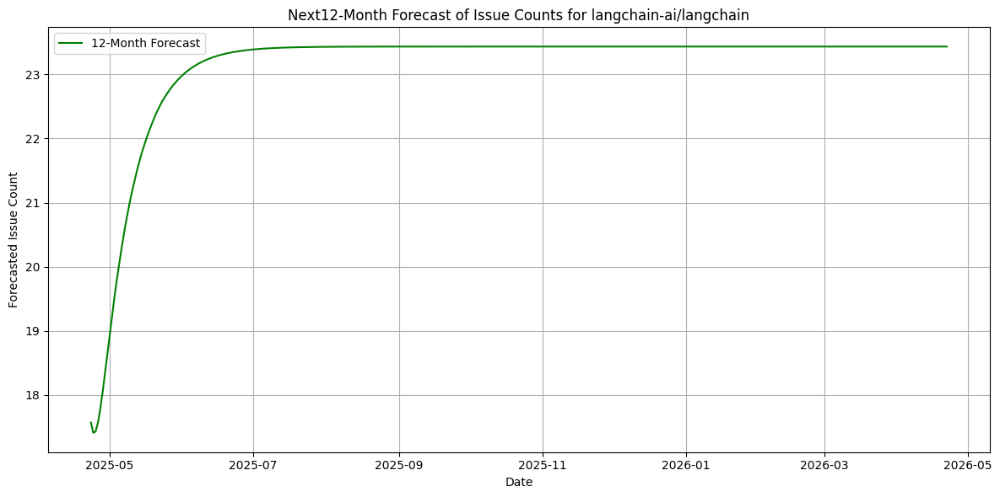

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9885
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7079
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7723
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7433
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8074
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.6518
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6945
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7288
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5719
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6693
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


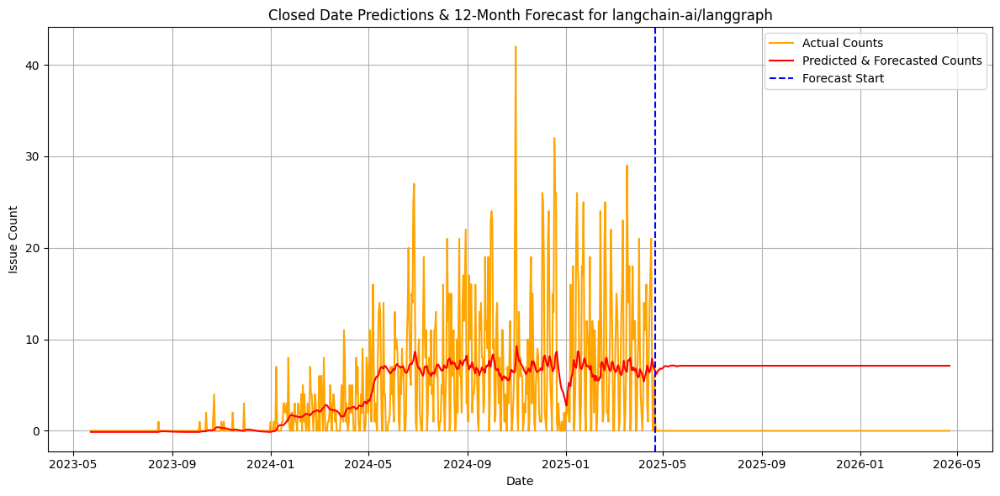

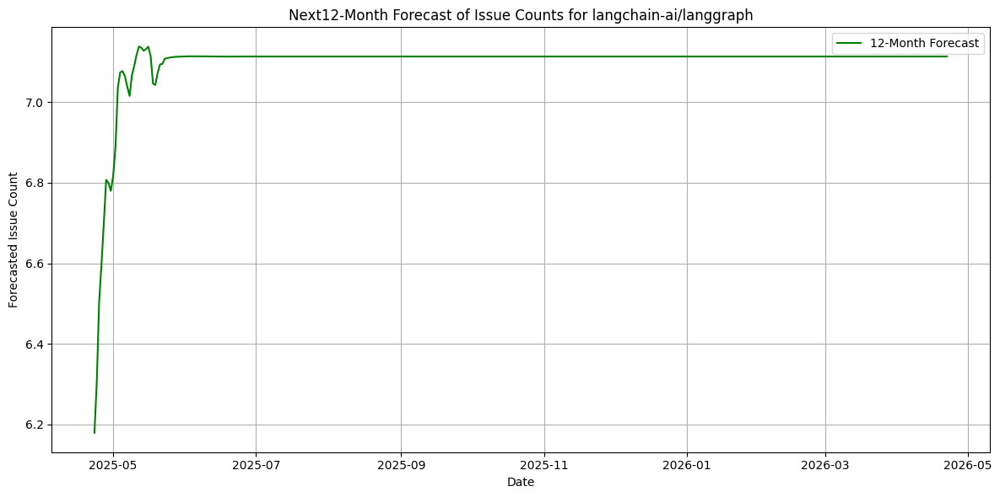

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 1.0898
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3319
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9456
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8202
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8521
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6668
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6861
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9998
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9117
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9898
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


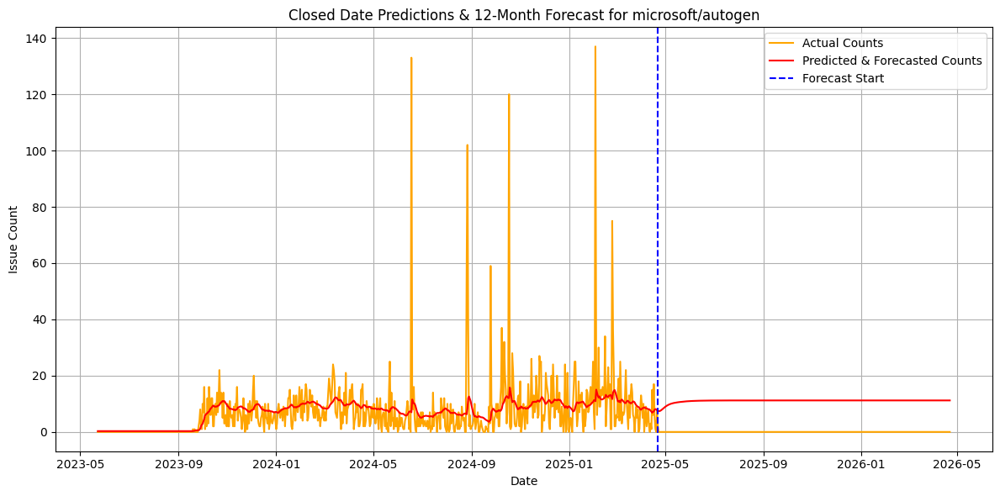

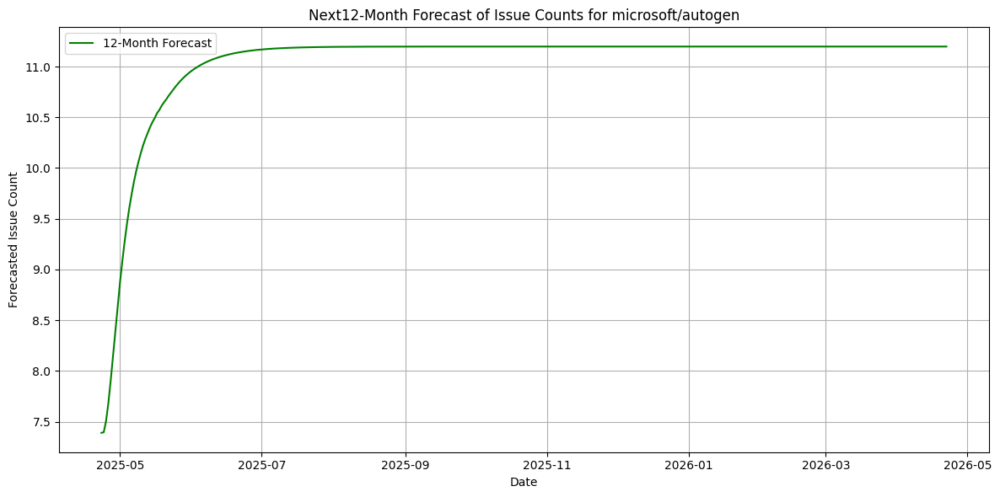

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.7344
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.5991
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9613
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8574
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0846
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7053
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.6181
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1764
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7556
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1124
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


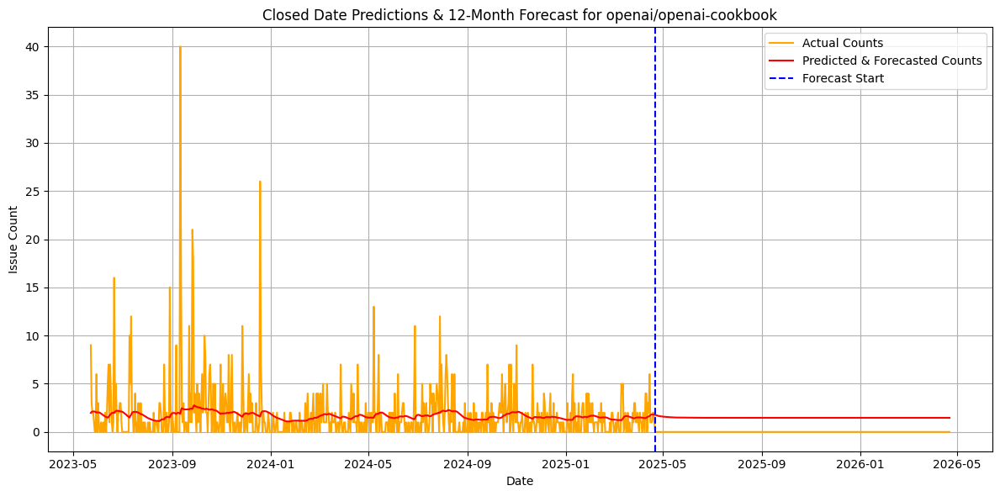

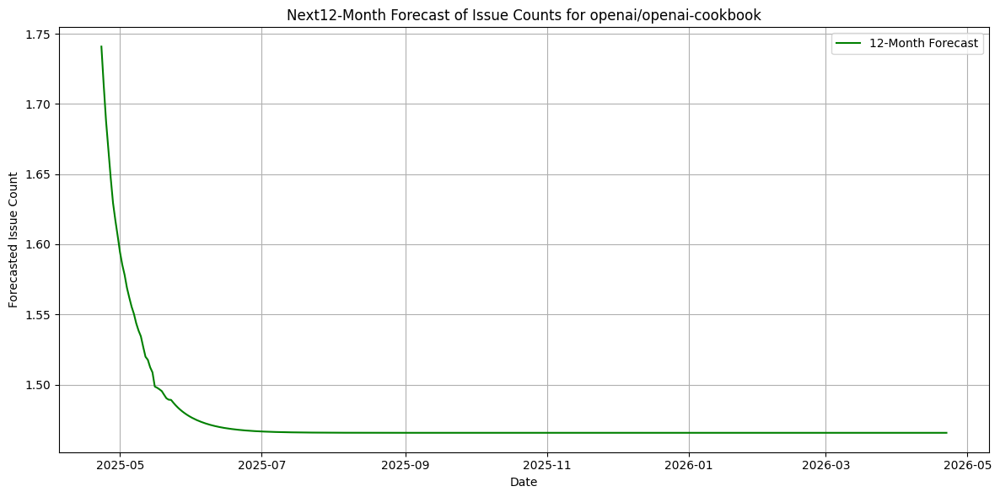

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9728
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9095
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8188
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8218
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8291
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8668
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9837
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7603
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8789
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7873
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


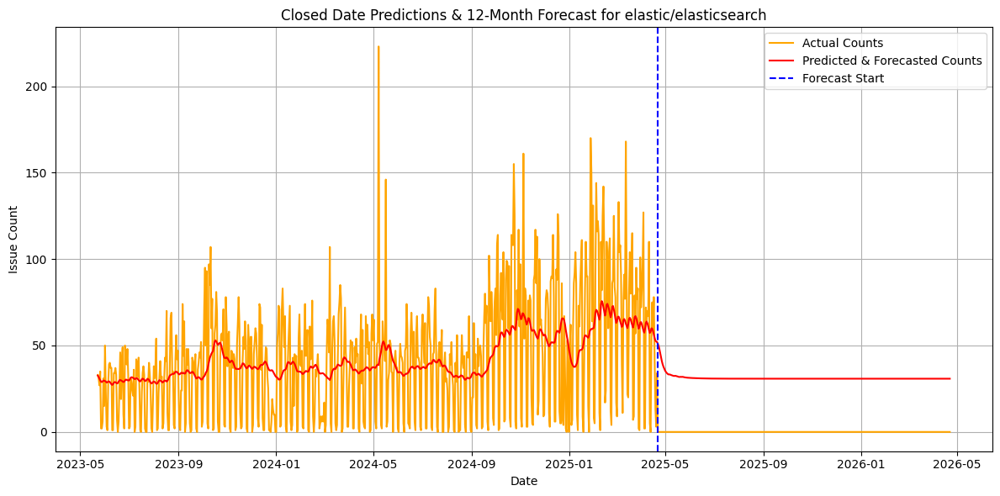

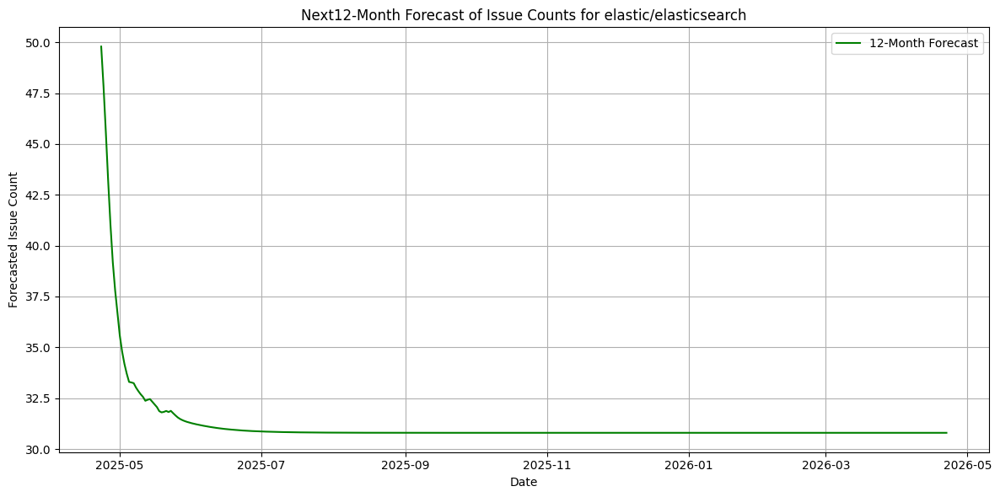

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.9650
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1354
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9577
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8425
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0537
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.0180
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8803
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9447
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7795
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.0499
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


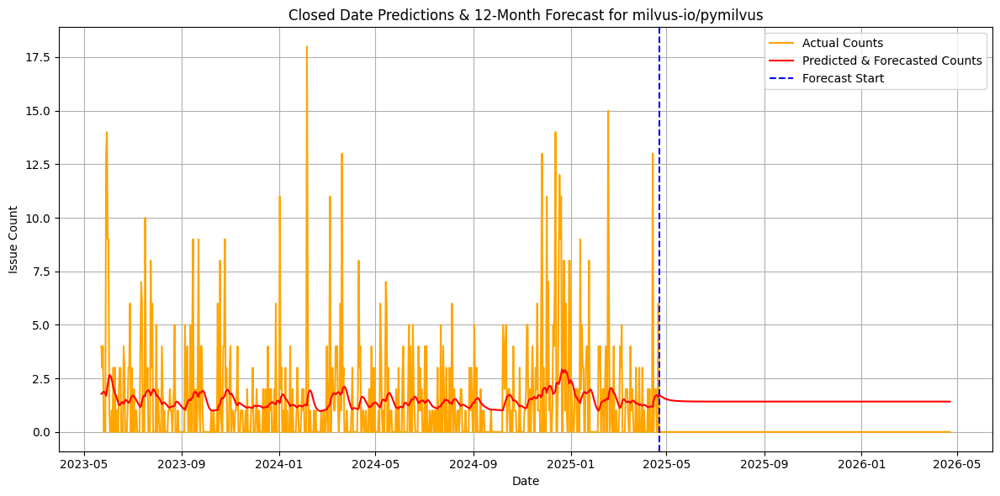

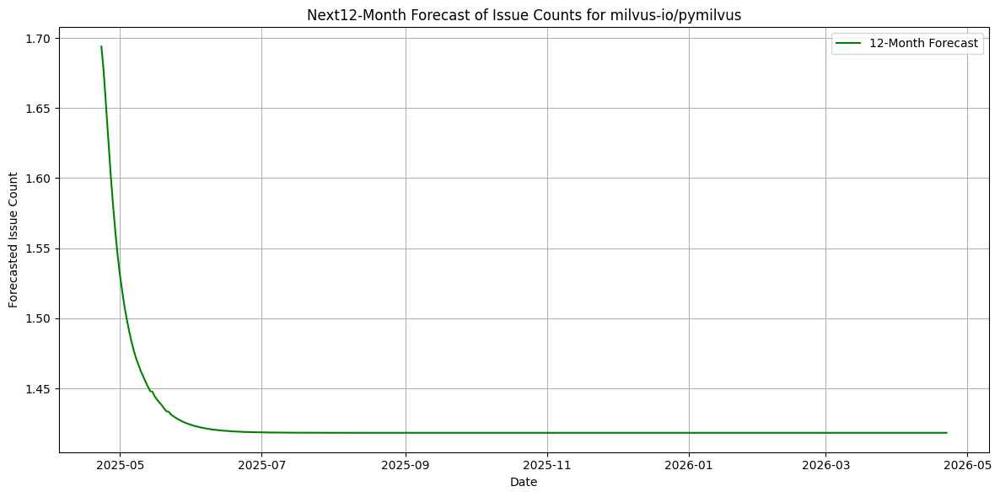

In [1]:
#Add your code for requirement 8.5 in this cell
 
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

warnings.filterwarnings(
    'ignore',
    category=UserWarning,
    message='Converting to PeriodArray/Index representation will drop timezone information'
)
warnings.filterwarnings('ignore', category=UserWarning, module='keras')

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()

req8_4 = pd.read_csv("dataset/issues_all_repo.csv")

def preprocessingData(data, sequence_length):
    X, y = [], []
    for i in range(sequence_length, len(data)):
        X.append(data[i-sequence_length:i])
        y.append(data[i])
    return np.array(X), np.array(y)

def process_LSTM(X, y):
    model = Sequential([
        Input(shape=(X.shape[1], X.shape[2])),
        LSTM(50, activation='relu', return_sequences=True),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=10, batch_size=32, verbose=1)
    return model

def forecast_future(model, last_sequence, scaler, future_days):
    forecast = []
    current_input = last_sequence
    for _ in range(future_days):
        pred = model.predict(current_input.reshape(1, *current_input.shape), verbose=0)
        forecast.append(pred[0, 0])
        current_input = np.append(current_input[1:], pred.reshape(1, 1), axis=0)
    forecast = scaler.inverse_transform(np.array(forecast).reshape(-1, 1)).flatten()
    return forecast

for i in req8_4['repository'].unique():
    repoBasedDf = req8_4[req8_4['repository'] == i].copy()
    repoBasedDf.loc[:, 'closed_at'] = pd.to_datetime(repoBasedDf['closed_at'], errors='coerce').dt.tz_localize(None).dt.date

    repoBasedDfBasedOnDate = repoBasedDf.groupby('closed_at').size().reset_index(name='count')
    repoBasedDfBasedOnDate['closed_at'] = pd.to_datetime(repoBasedDfBasedOnDate['closed_at'])

    repoBasedDfBasedOnDate = repoBasedDfBasedOnDate[
        (repoBasedDfBasedOnDate['closed_at'] >= pd.to_datetime(oldDate)) &
        (repoBasedDfBasedOnDate['closed_at'] <= pd.to_datetime(nowDate))
    ]

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    everydayCounts = repoBasedDfBasedOnDate.groupby('closed_at')['count'].sum().reset_index(name='count')
    everydayCountIndices = everydayCounts.set_index('closed_at').reindex(allDates, fill_value=0).reset_index(names='closed_at')
    everydayCountIndices['closed_at'] = pd.to_datetime(everydayCountIndices['closed_at'])

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(everydayCountIndices['count'].values.reshape(-1, 1))

    nSequence = 30
    
    X, y = preprocessingData(scaled_data, sequence_length=nSequence)
    model = process_LSTM(X, y)

    pred = model.predict(X)
    pred = scaler.inverse_transform(pred)

    everydayCountIndices = everydayCountIndices.iloc[nSequence:].reset_index(drop=True)
    everydayCountIndices['predictions'] = pred.flatten()

    # Forecasting next 12 months
    future_days = 365
    last_sequence = scaled_data[-nSequence:]
    future_preds = forecast_future(model, last_sequence, scaler, future_days)
    future_dates = pd.date_range(start=everydayCountIndices['closed_at'].iloc[-1] + pd.Timedelta(days=1), periods=future_days)

    forecast_df = pd.DataFrame({
        'closed_at': future_dates,
        'predictions': future_preds,
        'count': 0
    })

    combined_df = pd.concat([
        everydayCountIndices[['closed_at', 'count', 'predictions']],
        forecast_df
    ], ignore_index=True)

    plt.figure(figsize=(12, 6))
    plt.plot(combined_df['closed_at'], combined_df['count'], label='Actual Counts', color="orange")
    plt.plot(combined_df['closed_at'], combined_df['predictions'], label='Predicted & Forecasted Counts', color="red")
    plt.axvline(x=everydayCountIndices['closed_at'].iloc[-1], color='blue', linestyle='--', label='Forecast Start')
    plt.title(f'Closed Date Predictions & 12-Month Forecast for {i}')
    plt.xlabel('Date')
    plt.ylabel('Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(forecast_df['closed_at'], forecast_df['predictions'], label='12-Month Forecast', color='green')
    plt.title(f'Next12-Month Forecast of Issue Counts for {i}')
    plt.xlabel('Date')
    plt.ylabel('Forecasted Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<div class="alert alert-block alert-success">   
    
#### REQ8-6). Plot the pulls forecast

</div>

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.6109
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9199
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.9543
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9924
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2376
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9204
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4302
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5858
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.8219
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5709
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


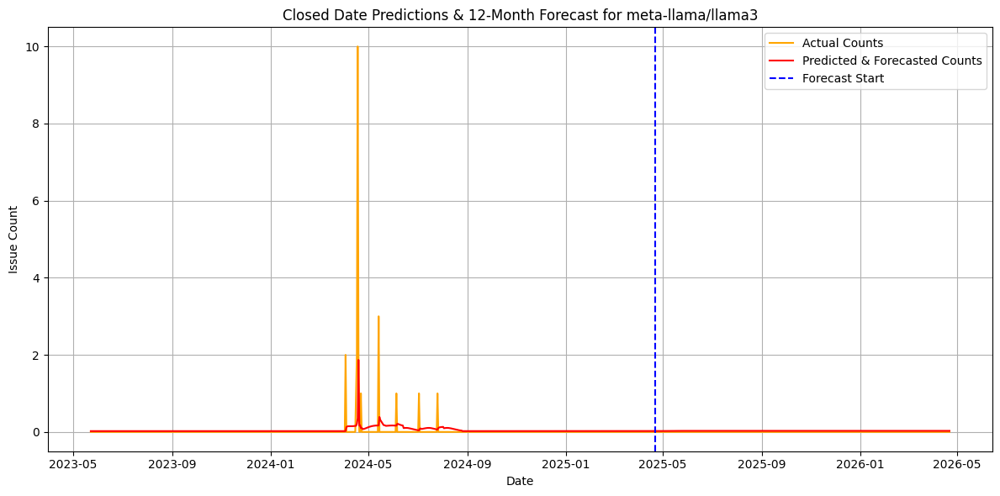

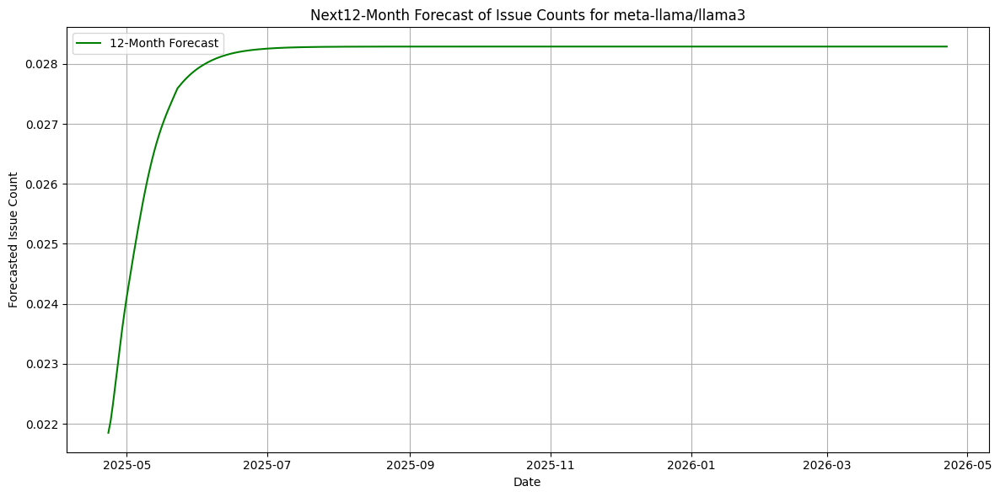

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9400
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8212
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0477
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9523
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8772
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9810
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8215
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8641
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8729
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.8168
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


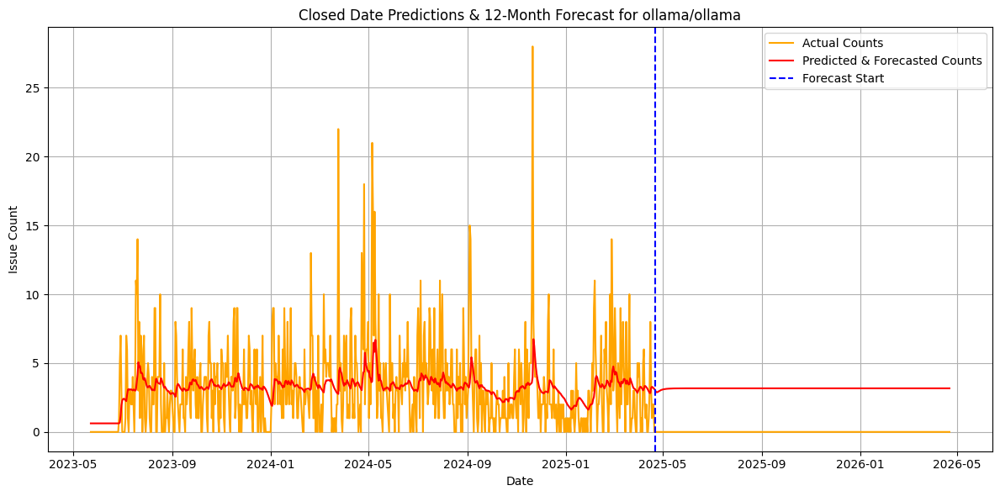

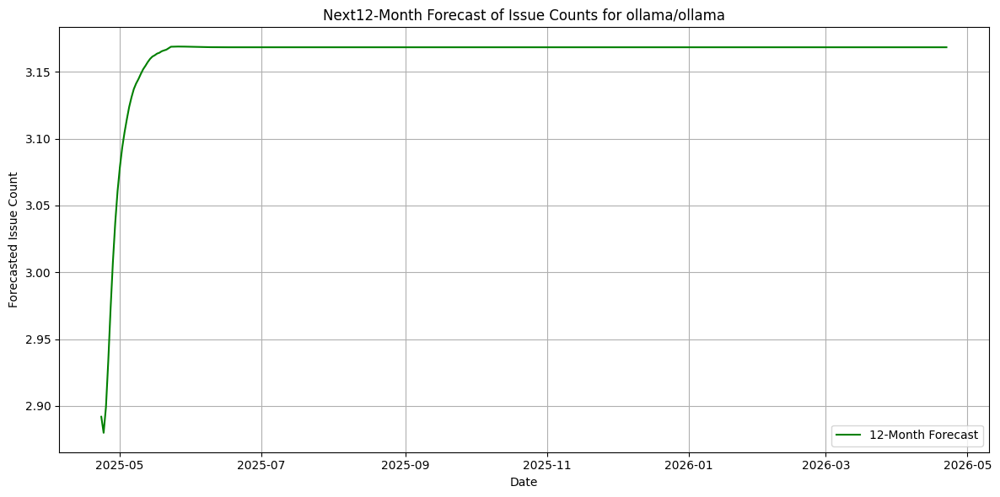

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.9674
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8921
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8139
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7751
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8444
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8851
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.8329
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8340
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7902
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8209
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


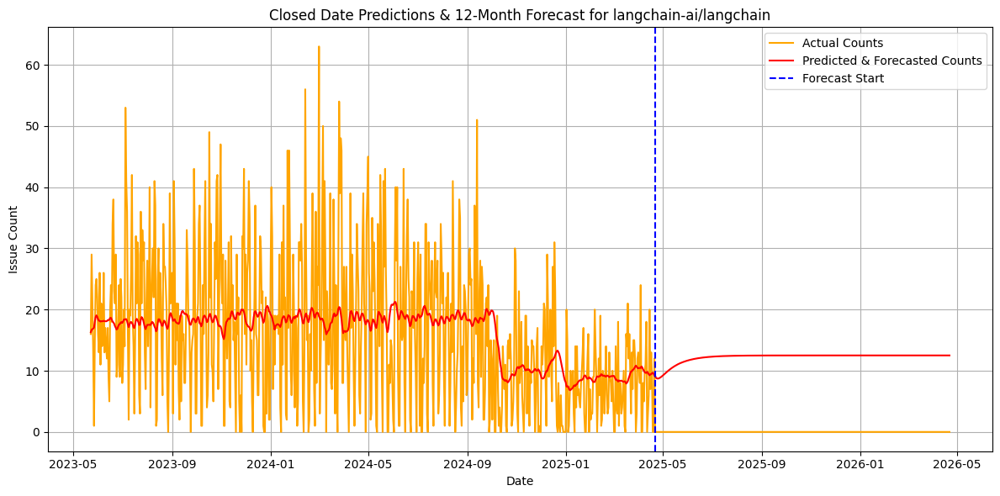

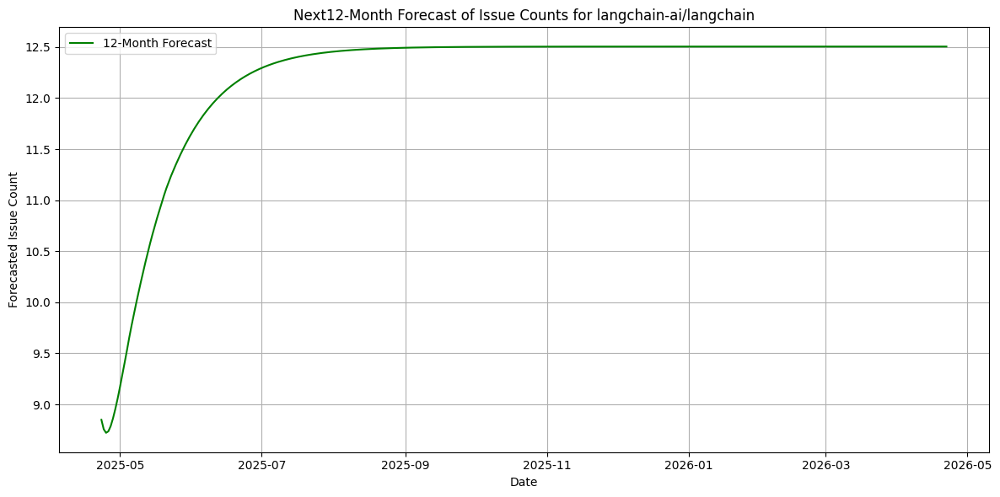

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.9879
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7825
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7501
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8023
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8864
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6971
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7520
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7150
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6642
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7329
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


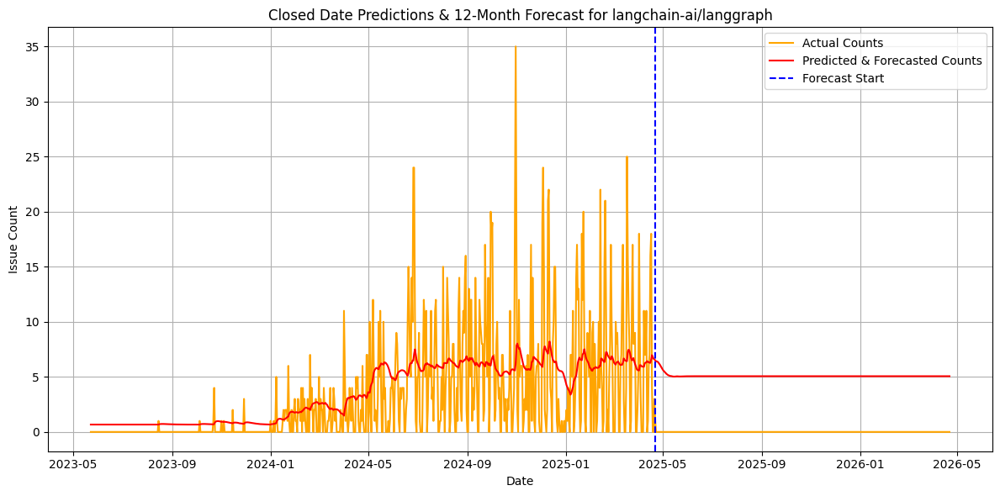

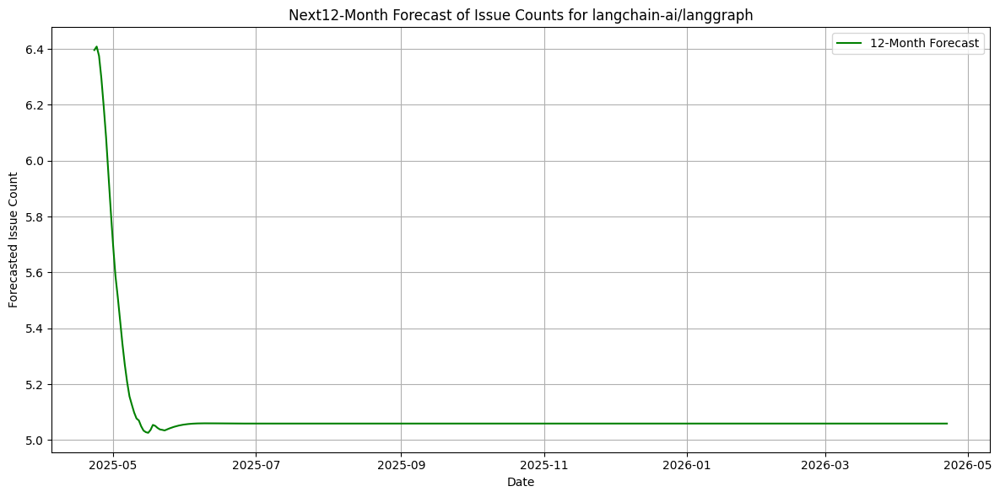

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.9048
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8332
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8263
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8078
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7863
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6503
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8906
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6372
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5919
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7065
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


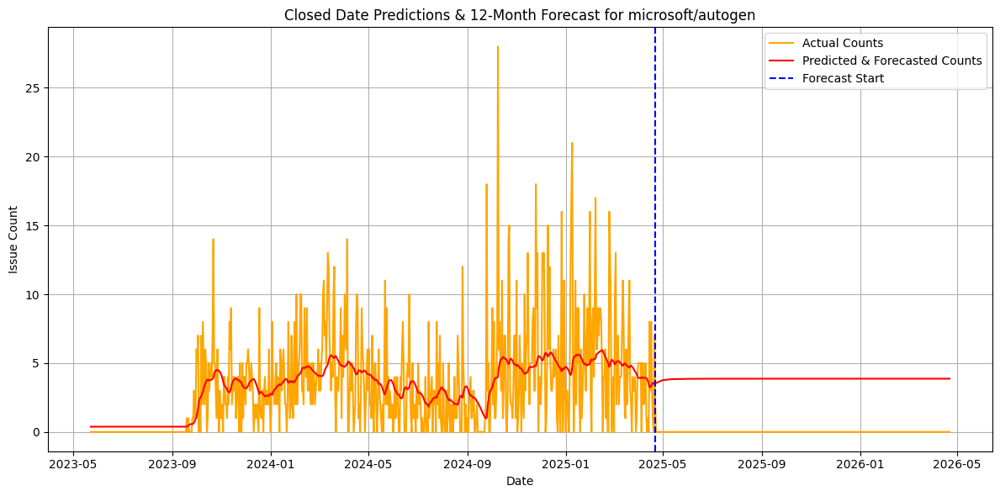

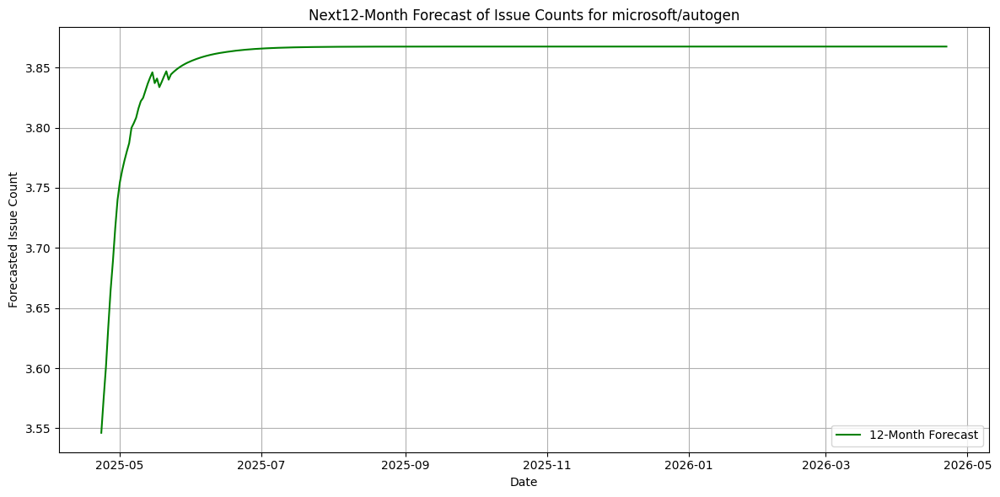

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.8672
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8195
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0603
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0581
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8438
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8607
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8737
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9643
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9103
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7251
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


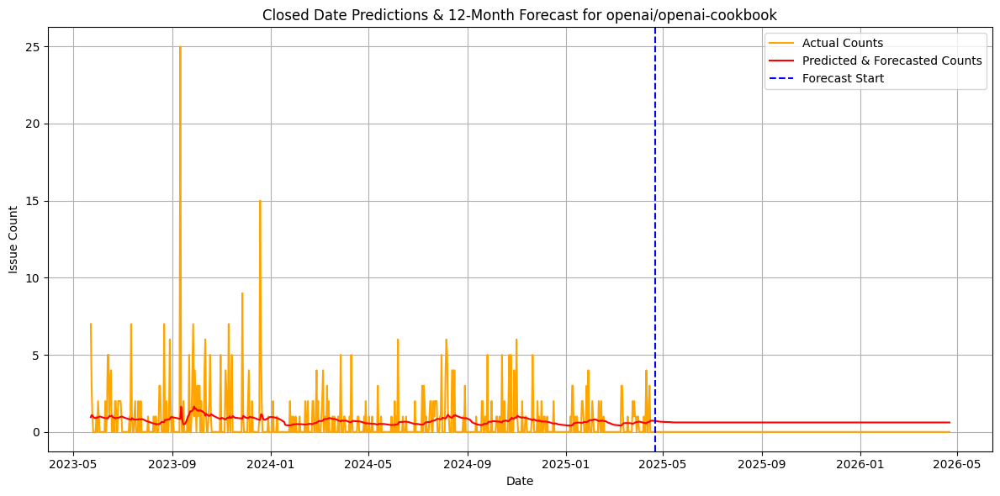

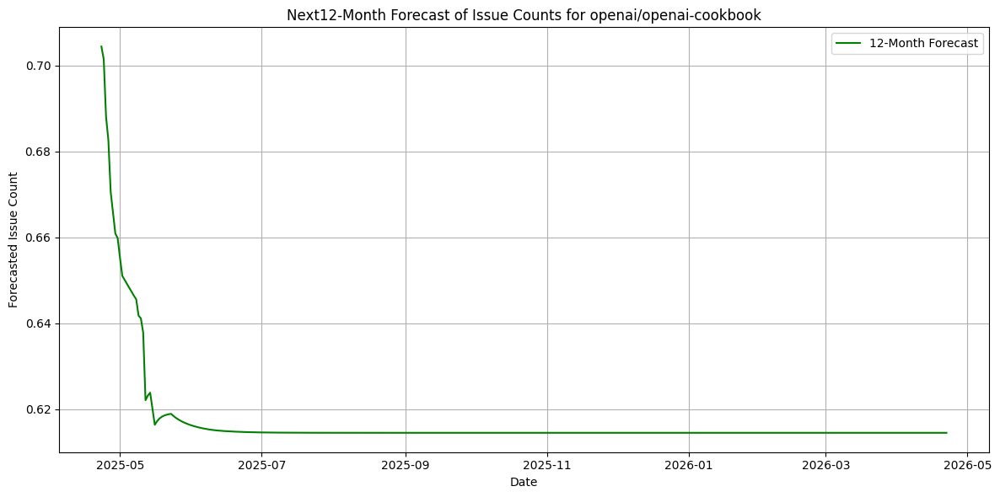

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.9227
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8936
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8625
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8610
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8653
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8329
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8608
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8522
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7996
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7993
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


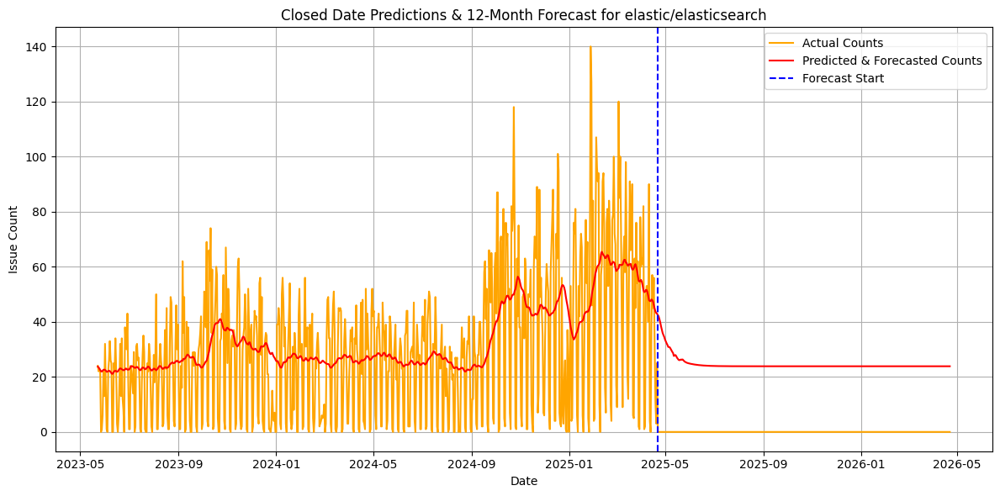

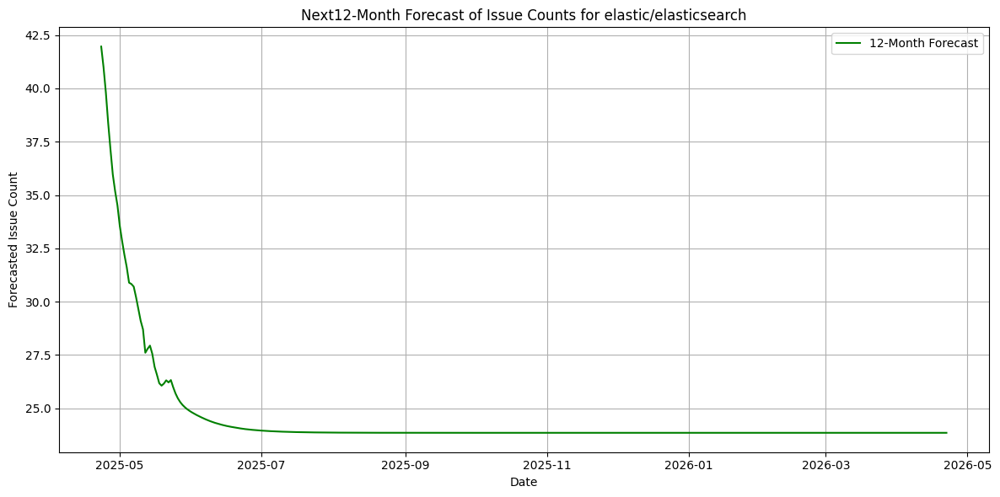

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.8525
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.2273
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0708
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9144
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.1033
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.0613
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8980
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.9991
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.0431
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9405
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


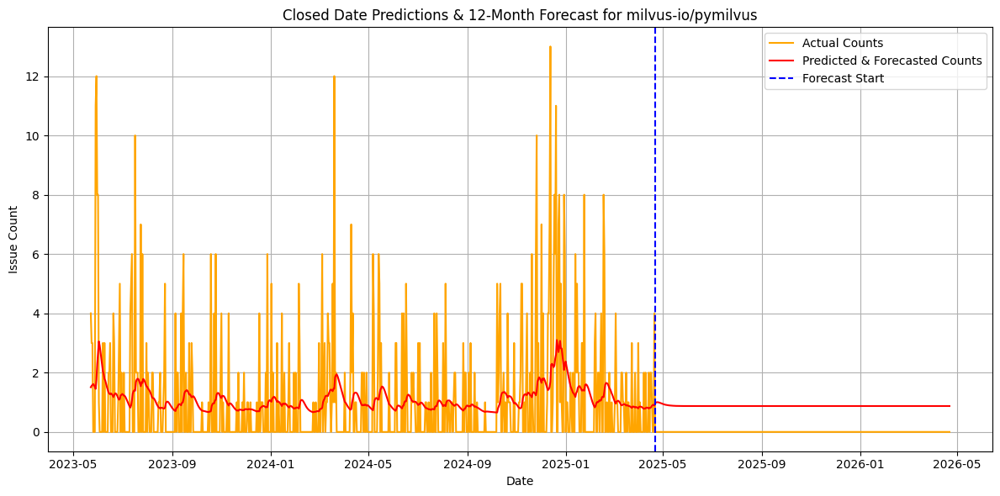

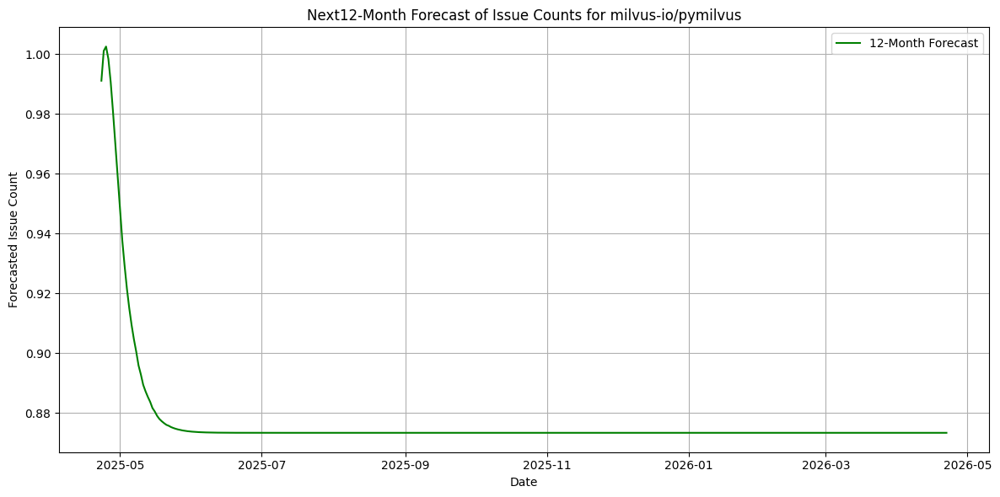

In [1]:
#Add your code for requirement 8.6 in this cell

import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

warnings.filterwarnings('ignore', category = UserWarning, message = 'Converting to PeriodArray/Index representation will drop timezone information')

warnings.filterwarnings('ignore', category = UserWarning, module = 'keras')

pullsData = pd.read_csv('dataset/pulls_all_repo.csv')

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()

def preprocessingData(data, sequence_length):
    X, y = [], []
    for i in range(sequence_length, len(data)):
        X.append(data[i-sequence_length:i])
        y.append(data[i])
    return np.array(X), np.array(y)

def process_LSTM(X, y):
    model = Sequential([
        Input(shape=(X.shape[1], X.shape[2])),
        LSTM(50, activation='relu', return_sequences=True),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=10, batch_size=32, verbose=1)
    return model

def forecast_future(model, last_sequence, scaler, future_days):
    forecast = []
    current_input = last_sequence
    for _ in range(future_days):
        pred = model.predict(current_input.reshape(1, *current_input.shape), verbose=0)
        forecast.append(pred[0, 0])
        current_input = np.append(current_input[1:], pred.reshape(1, 1), axis=0)
    forecast = scaler.inverse_transform(np.array(forecast).reshape(-1, 1)).flatten()
    return forecast

for i in pullsData['repository'].unique():
    repoBasedDf = pullsData[pullsData['repository'] == i].copy()

    repoBasedDf = repoBasedDf.dropna(subset="merged_at")
    
    repoBasedDf.loc[:, 'merged_at'] = pd.to_datetime(repoBasedDf['merged_at'], errors='coerce').dt.tz_localize(None).dt.date

    repoBasedDfBasedOnDate = repoBasedDf.groupby('merged_at').size().reset_index(name='count')
    repoBasedDfBasedOnDate['merged_at'] = pd.to_datetime(repoBasedDfBasedOnDate['merged_at'])

    repoBasedDfBasedOnDate = repoBasedDfBasedOnDate[
        (repoBasedDfBasedOnDate['merged_at'] >= pd.to_datetime(oldDate)) &
        (repoBasedDfBasedOnDate['merged_at'] <= pd.to_datetime(nowDate))
    ]
    repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['merged_at'].dt.day_name()

    everydayCounts = repoBasedDfBasedOnDate.groupby('merged_at')['count'].sum().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    everydayCountIndices = everydayCounts.set_index('merged_at').reindex(allDates, fill_value=0).reset_index(names='merged_at')
    everydayCountIndices['merged_at'] = pd.to_datetime(everydayCountIndices['merged_at'])
    everydayCountIndices['day_name'] = everydayCountIndices['merged_at'].dt.day_name()

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(everydayCountIndices['count'].values.reshape(-1, 1))

    nSequence = 30
    X, y = preprocessingData(scaled_data, sequence_length=nSequence)
    model = process_LSTM(X, y)

    pred = model.predict(X)
    pred = scaler.inverse_transform(pred)

    everydayCountIndices = everydayCountIndices.iloc[nSequence:].reset_index(drop=True)
    everydayCountIndices['predictions'] = pred.flatten()

    future_days = 365
    last_sequence = scaled_data[-nSequence:]
    future_preds = forecast_future(model, last_sequence, scaler, future_days)
    future_dates = pd.date_range(start=everydayCountIndices['merged_at'].iloc[-1] + pd.Timedelta(days=1), periods=future_days)

    forecast_df = pd.DataFrame({
        'merged_at': future_dates,
        'predictions': future_preds,
        'count': 0
    })

    combined_df = pd.concat([
        everydayCountIndices[['merged_at', 'count', 'predictions']],
        forecast_df
    ], ignore_index=True)

    plt.figure(figsize=(12, 6))
    plt.plot(combined_df['merged_at'], combined_df['count'], label='Actual Counts', color="orange")
    plt.plot(combined_df['merged_at'], combined_df['predictions'], label='Predicted & Forecasted Counts', color="red")
    plt.axvline(x=everydayCountIndices['merged_at'].iloc[-1], color='blue', linestyle='--', label='Forecast Start')
    plt.title(f'Closed Date Predictions & 12-Month Forecast for {i}')
    plt.xlabel('Date')
    plt.ylabel('Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(forecast_df['merged_at'], forecast_df['predictions'], label='12-Month Forecast', color='green')
    plt.title(f'Next12-Month Forecast of Issue Counts for {i}')
    plt.xlabel('Date')
    plt.ylabel('Forecasted Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<div class="alert alert-block alert-success">   
    
#### REQ8-7). Plot the commits forecast

</div>

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.7743
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4599
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.5281
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.7863
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2.0234
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4034
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4265
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9856
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2746
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5550
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


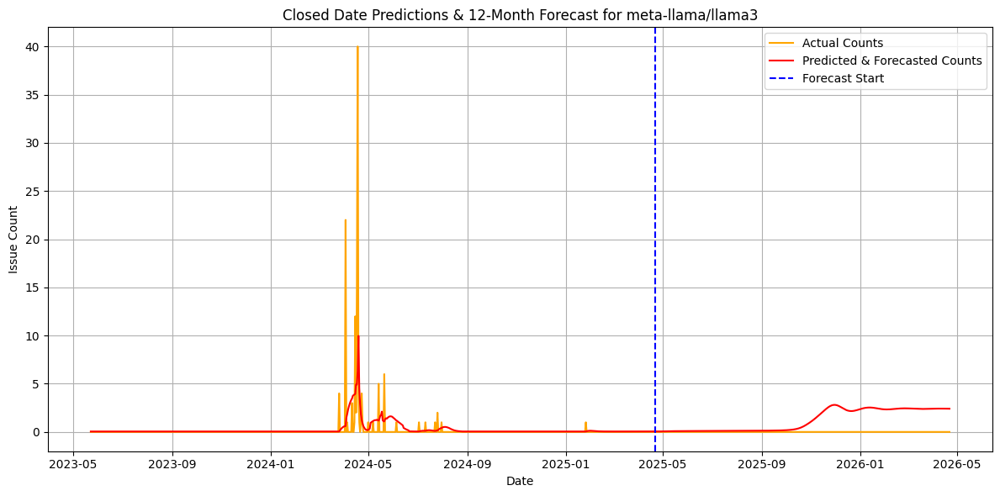

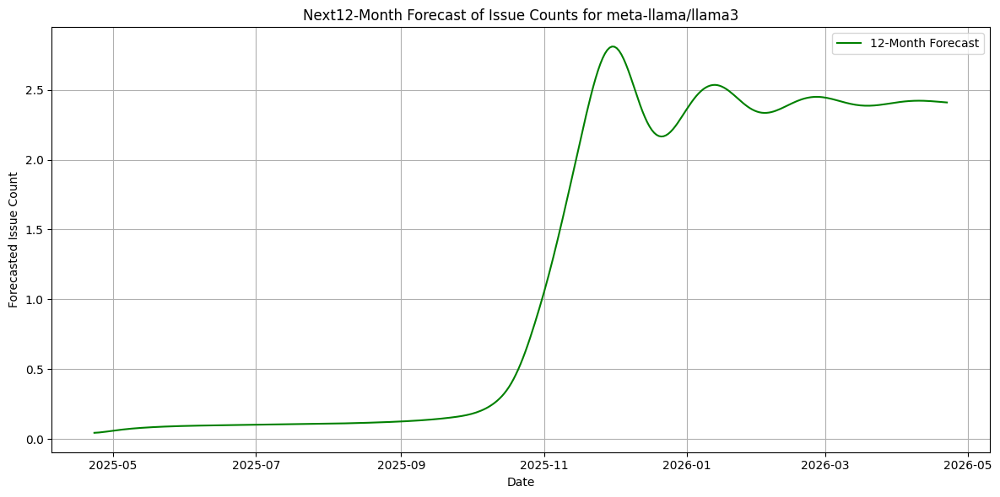

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.8999
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0737
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8014
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8224
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8165
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7062
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7752
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7969
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7096
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7126
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


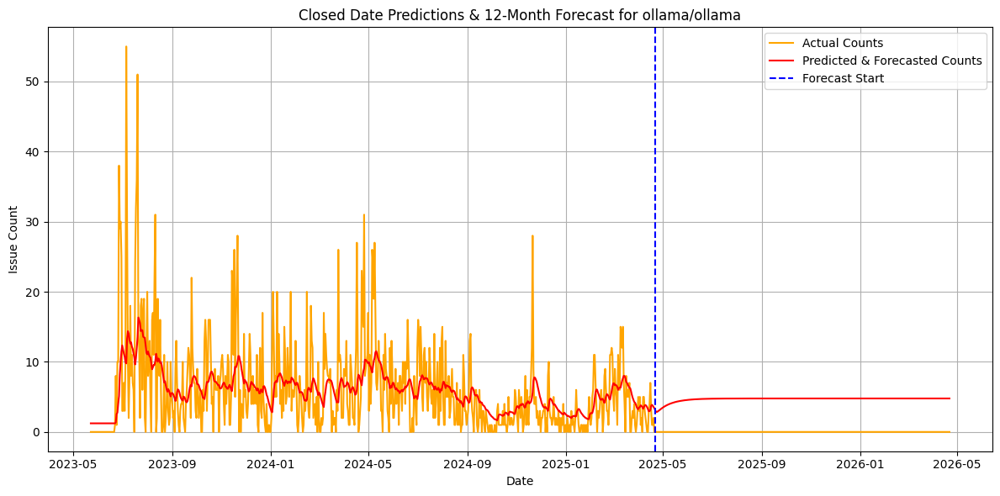

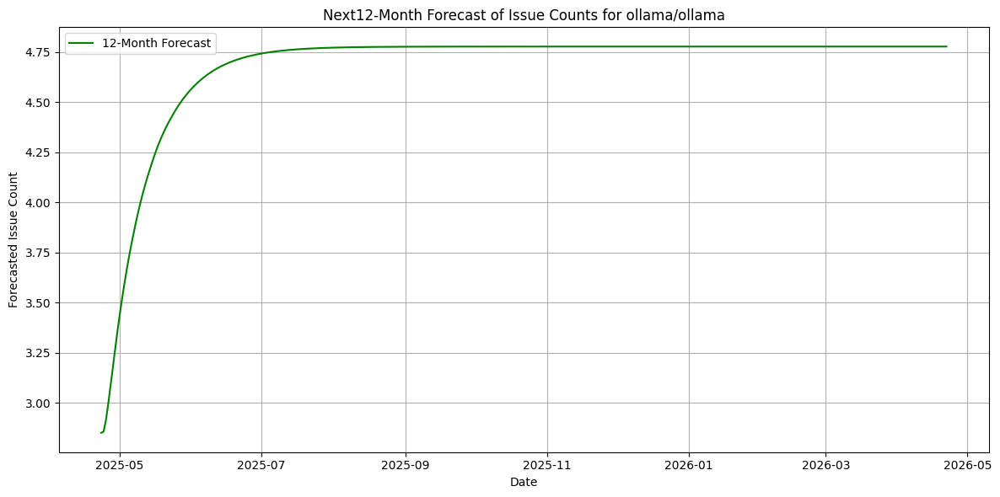

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0246
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8974
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8485
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8842
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8789
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8534
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.7869
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8489
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8307
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8745
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


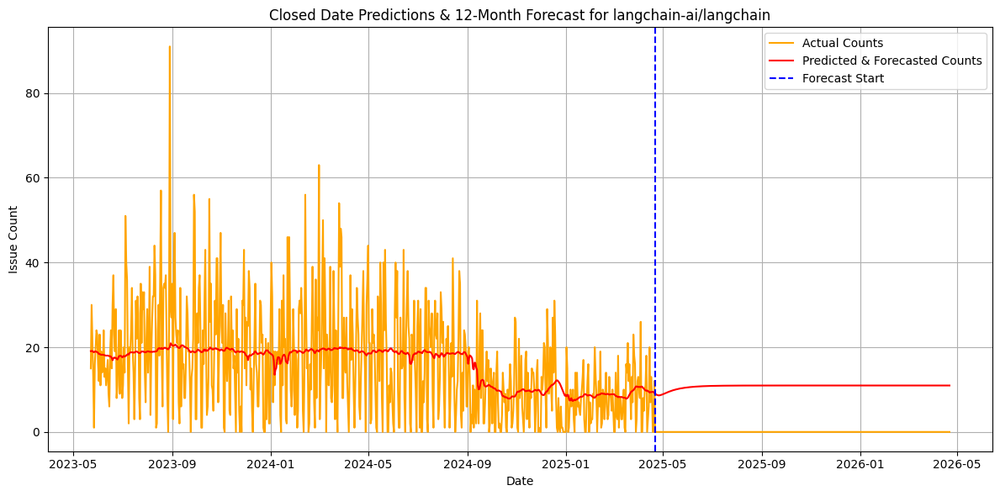

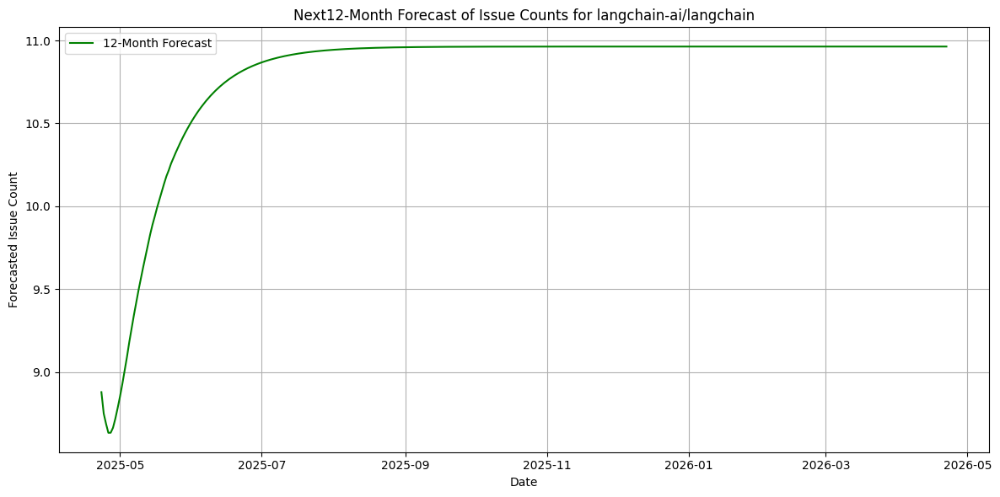

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9468
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9247
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6817
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8850
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.7886
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7187
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8871
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7360
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6866
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7233
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


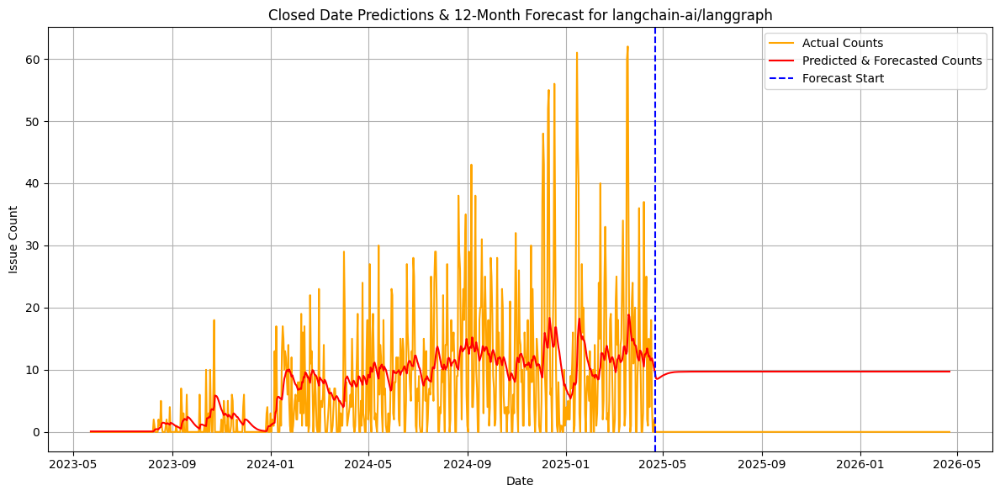

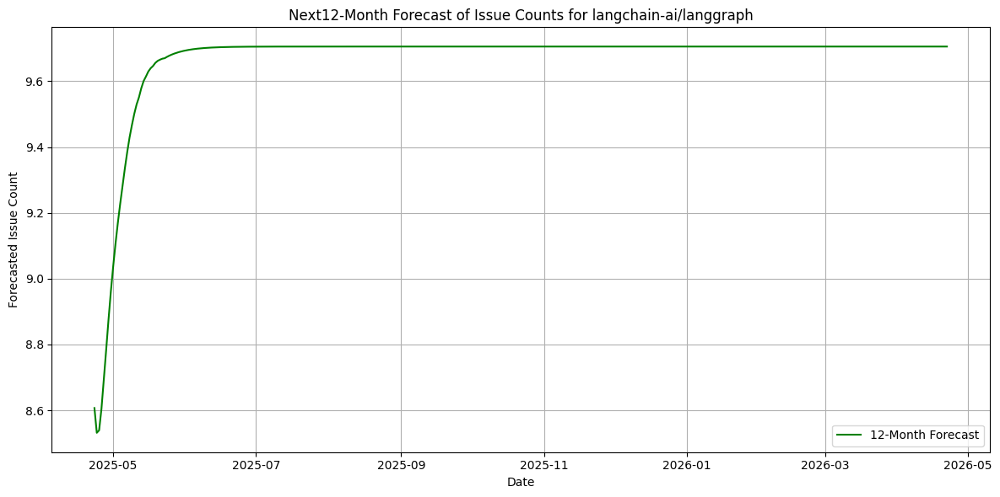

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.9307
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0575
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.1878
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8423
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9679
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9304
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9426
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8608
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8998
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7726
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


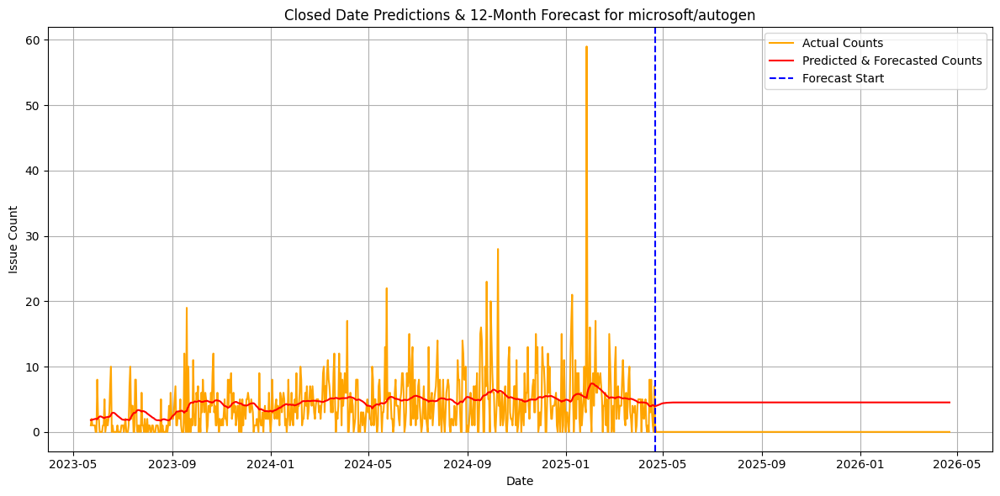

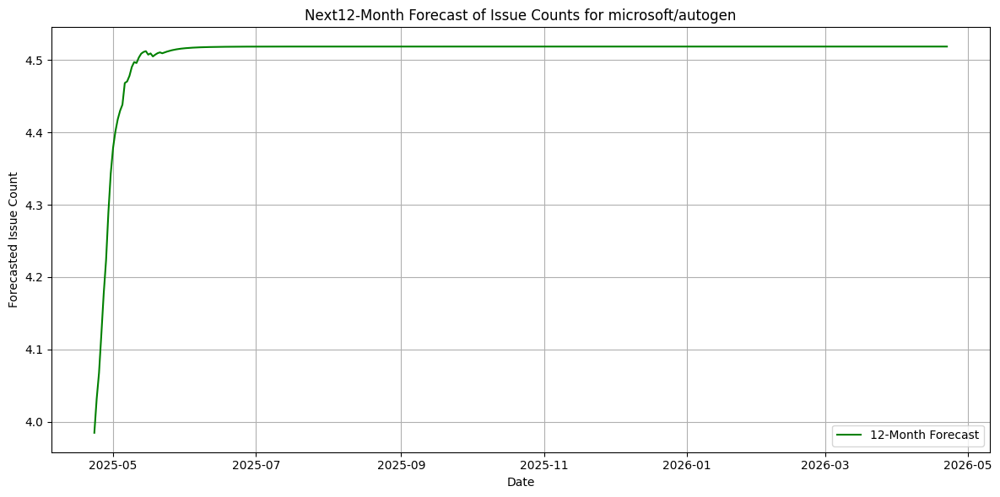

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.6966
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.0392
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.6110
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8770
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9820
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8080
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8170
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.8680
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.7309
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6793
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


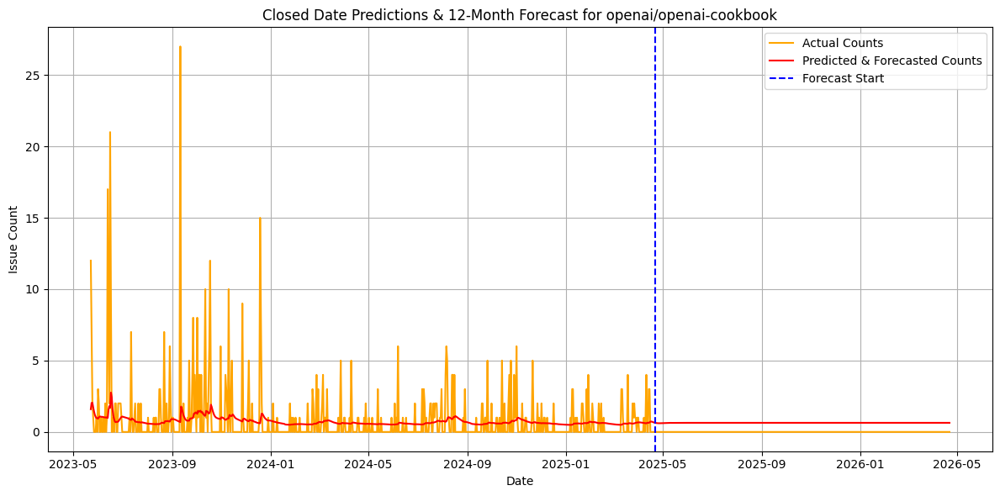

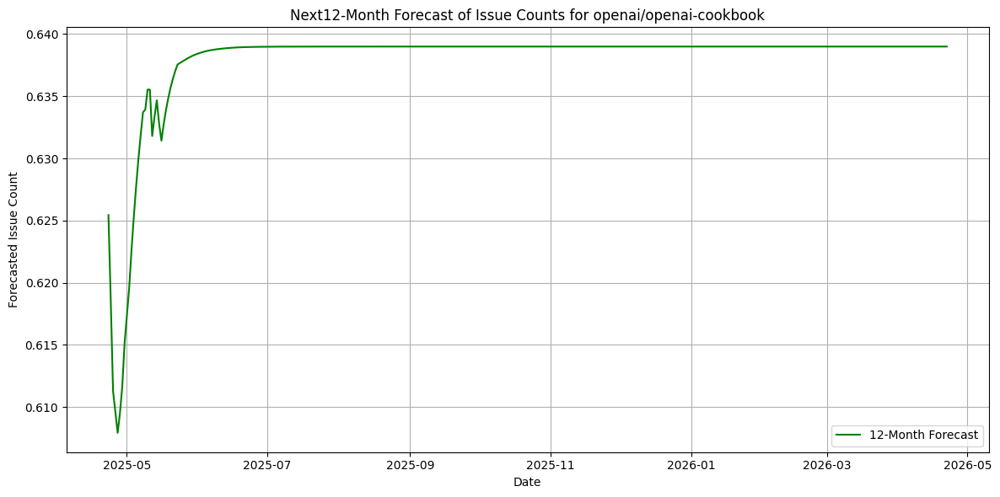

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9525
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9631
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9794
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9032
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9648
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.9835
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8823
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8111
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7372
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5984
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


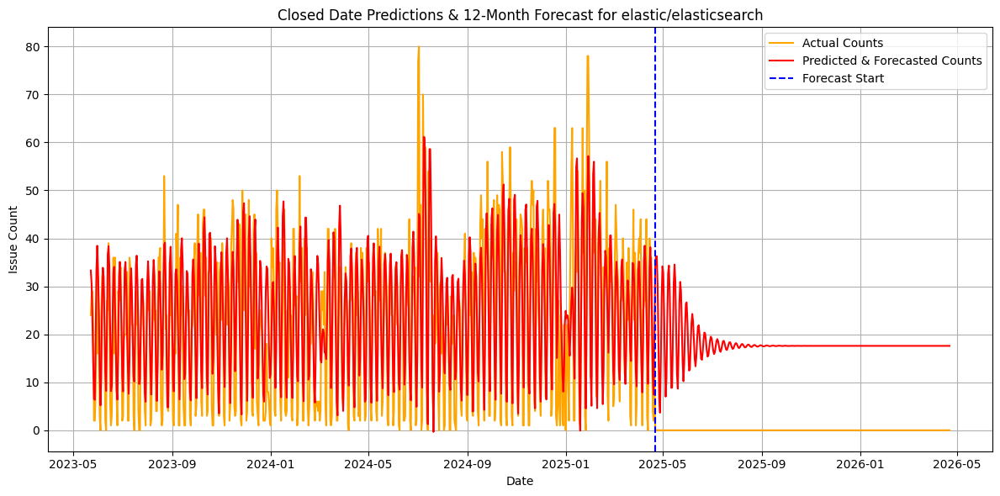

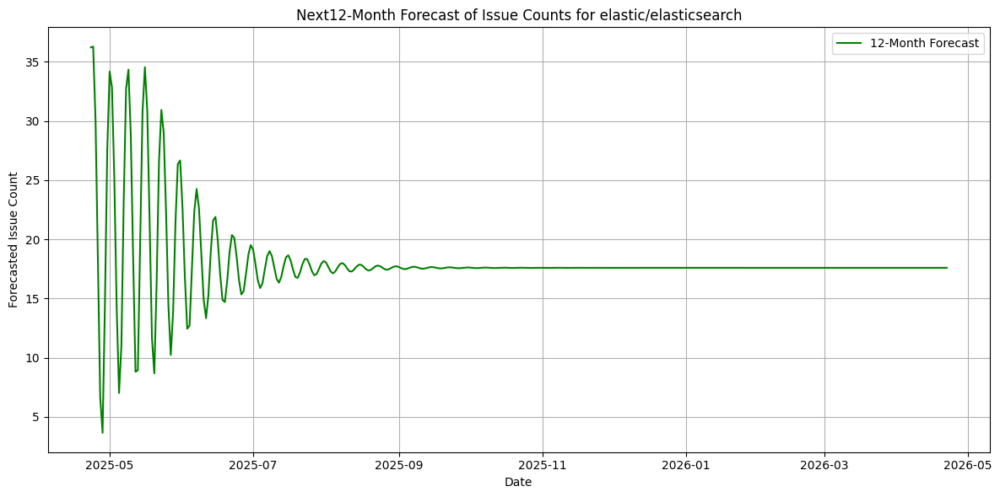

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9790
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0851
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.0623
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8798
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2361
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.8209
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9408
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8604
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8750
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9303
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


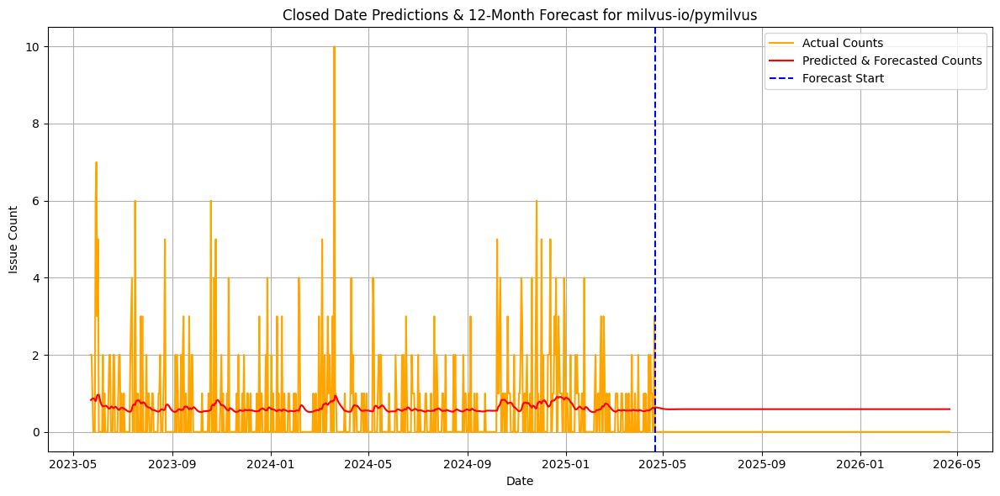

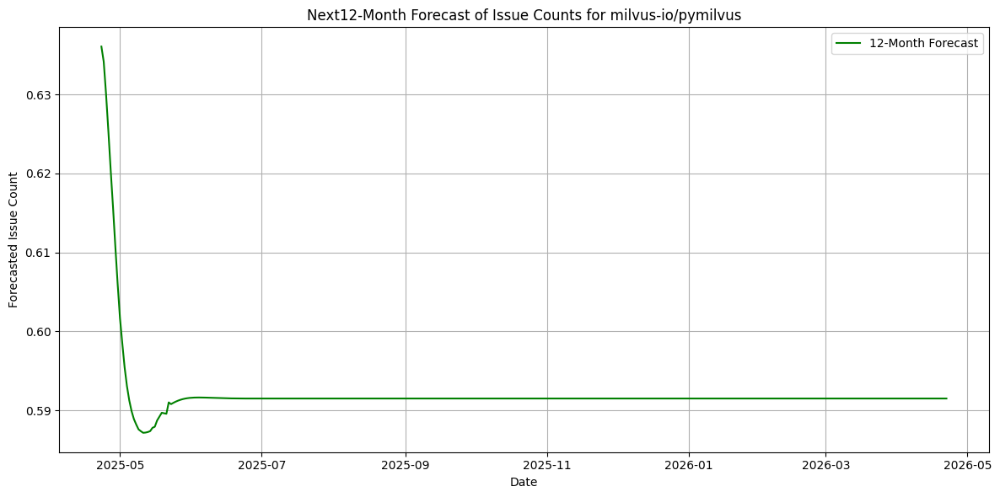

In [1]:
#Add your code for requirement 8.7 in this cell

import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

warnings.filterwarnings('ignore', category = UserWarning, message = 'Converting to PeriodArray/Index representation will drop timezone information')

warnings.filterwarnings('ignore', category = UserWarning, module = 'keras')

pullsData = pd.read_csv('dataset/commits_all_repo.csv')

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()

def preprocessingData(data, sequence_length):
    X, y = [], []
    for i in range(sequence_length, len(data)):
        X.append(data[i-sequence_length:i])
        y.append(data[i])
    return np.array(X), np.array(y)

def process_LSTM(X, y):
    model = Sequential([
        Input(shape=(X.shape[1], X.shape[2])),
        LSTM(50, activation='relu', return_sequences=True),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=10, batch_size=32, verbose=1)
    return model

def forecast_future(model, last_sequence, scaler, future_days):
    forecast = []
    current_input = last_sequence
    for _ in range(future_days):
        pred = model.predict(current_input.reshape(1, *current_input.shape), verbose=0)
        forecast.append(pred[0, 0])
        current_input = np.append(current_input[1:], pred.reshape(1, 1), axis=0)
    forecast = scaler.inverse_transform(np.array(forecast).reshape(-1, 1)).flatten()
    return forecast

for i in pullsData['repository'].unique():
    repoBasedDf = pullsData[pullsData['repository'] == i].copy()

    repoBasedDf = repoBasedDf.dropna(subset="commit_date")
    
    repoBasedDf.loc[:, 'commit_date'] = pd.to_datetime(repoBasedDf['commit_date'], errors='coerce').dt.tz_localize(None).dt.date

    repoBasedDfBasedOnDate = repoBasedDf.groupby('commit_date').size().reset_index(name='count')
    repoBasedDfBasedOnDate['commit_date'] = pd.to_datetime(repoBasedDfBasedOnDate['commit_date'])

    repoBasedDfBasedOnDate = repoBasedDfBasedOnDate[
        (repoBasedDfBasedOnDate['commit_date'] >= pd.to_datetime(oldDate)) &
        (repoBasedDfBasedOnDate['commit_date'] <= pd.to_datetime(nowDate))
    ]
    repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['commit_date'].dt.day_name()

    everydayCounts = repoBasedDfBasedOnDate.groupby('commit_date')['count'].sum().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    everydayCountIndices = everydayCounts.set_index('commit_date').reindex(allDates, fill_value=0).reset_index(names='commit_date')
    everydayCountIndices['commit_date'] = pd.to_datetime(everydayCountIndices['commit_date'])
    everydayCountIndices['day_name'] = everydayCountIndices['commit_date'].dt.day_name()

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(everydayCountIndices['count'].values.reshape(-1, 1))

    nSequence = 30
    X, y = preprocessingData(scaled_data, sequence_length=nSequence)
    model = process_LSTM(X, y)

    pred = model.predict(X)
    pred = scaler.inverse_transform(pred)

    everydayCountIndices = everydayCountIndices.iloc[nSequence:].reset_index(drop=True)
    everydayCountIndices['predictions'] = pred.flatten()

    future_days = 365
    last_sequence = scaled_data[-nSequence:]
    future_preds = forecast_future(model, last_sequence, scaler, future_days)
    future_dates = pd.date_range(start=everydayCountIndices['commit_date'].iloc[-1] + pd.Timedelta(days=1), periods=future_days)

    forecast_df = pd.DataFrame({
        'commit_date': future_dates,
        'predictions': future_preds,
        'count': 0
    })

    combined_df = pd.concat([
        everydayCountIndices[['commit_date', 'count', 'predictions']],
        forecast_df
    ], ignore_index=True)

    plt.figure(figsize=(12, 6))
    plt.plot(combined_df['commit_date'], combined_df['count'], label='Actual Counts', color="orange")
    plt.plot(combined_df['commit_date'], combined_df['predictions'], label='Predicted & Forecasted Counts', color="red")
    plt.axvline(x=everydayCountIndices['commit_date'].iloc[-1], color='blue', linestyle='--', label='Forecast Start')
    plt.title(f'Closed Date Predictions & 12-Month Forecast for {i}')
    plt.xlabel('Date')
    plt.ylabel('Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(forecast_df['commit_date'], forecast_df['predictions'], label='12-Month Forecast', color='green')
    plt.title(f'Next12-Month Forecast of Issue Counts for {i}')
    plt.xlabel('Date')
    plt.ylabel('Forecasted Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<div class="alert alert-block alert-success">   
    
#### REQ8-8). Plot the branches forecast

</div>

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.0886
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.4802
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7428
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0115
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8130
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4037
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9062
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8700
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3123
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5573
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


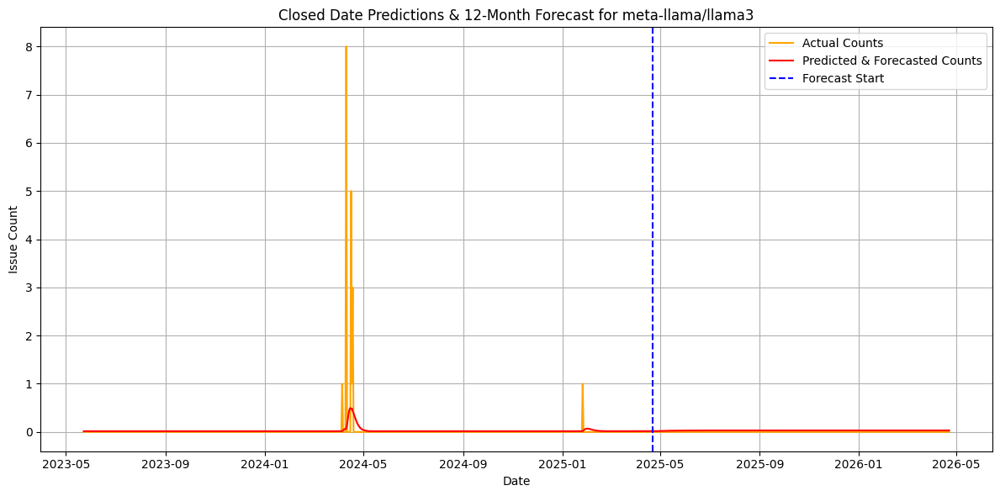

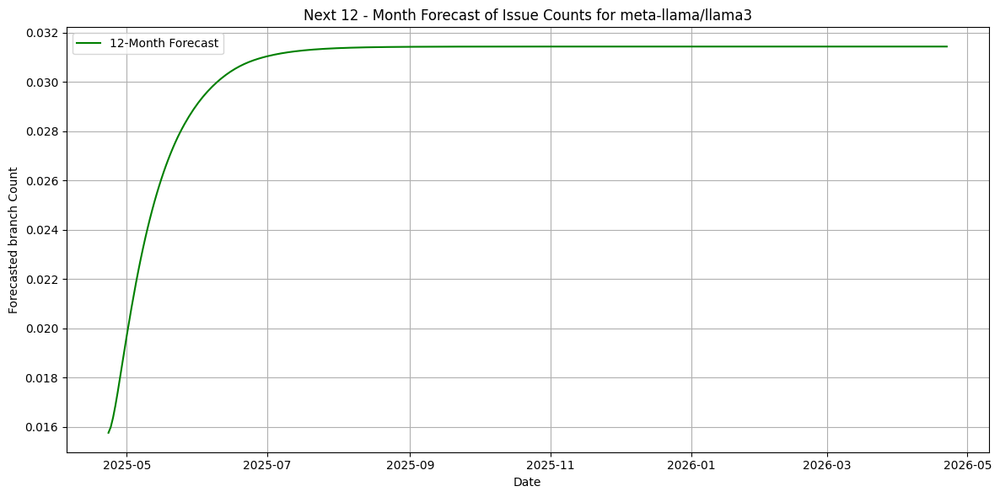

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.9733
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9735
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8080
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7766
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0026
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8809
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9146
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8991
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0287
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8724
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


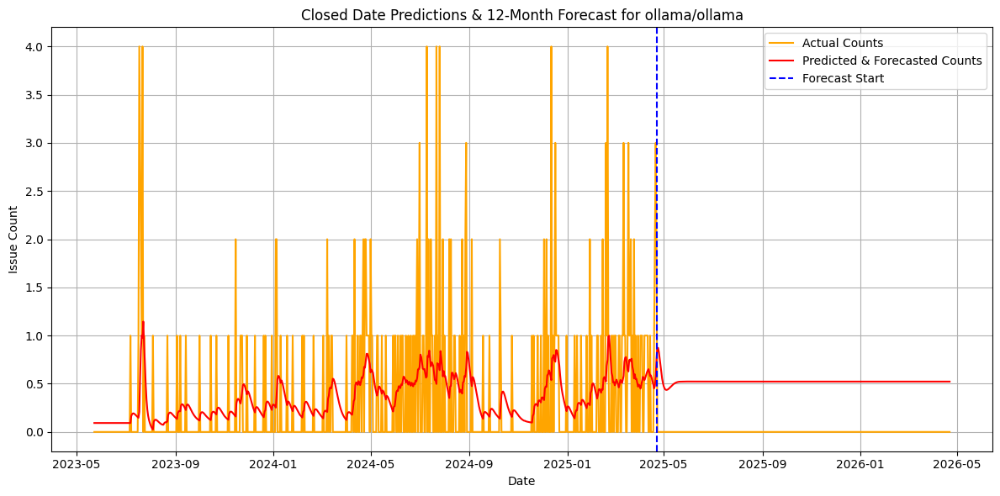

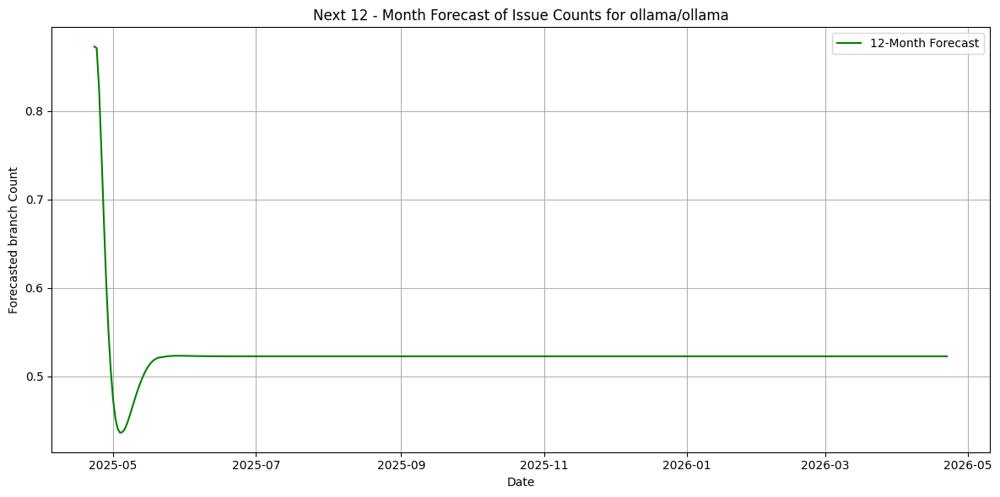

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.9228
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9519
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9215
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7844
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.9180
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7990
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7870
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7506
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7555
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9245
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Invalid prediction encountered: nan
Invalid prediction encountered: nan
Invalid prediction encountered: nan
Invalid prediction encountered: nan
Invalid prediction encountered: nan
Invalid prediction encountered: nan
Invalid prediction encountered: nan
Invalid prediction encountered: nan
Invalid predict

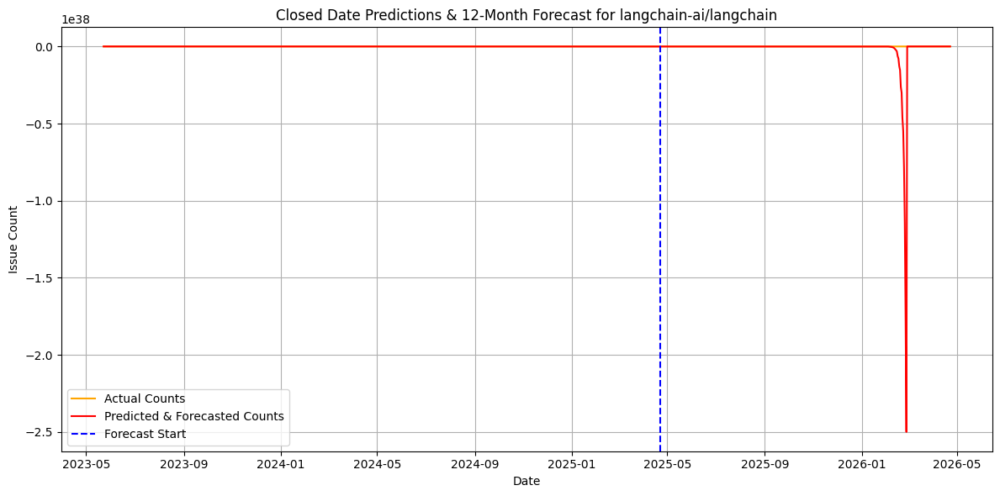

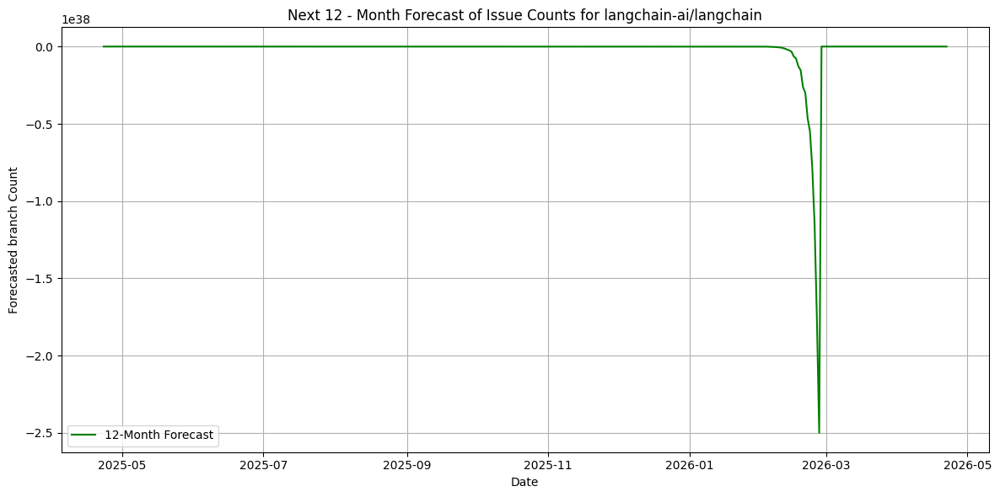

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.8714
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7849
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9974
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0697
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7646
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8657
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9694
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8327
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8966
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.0861
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


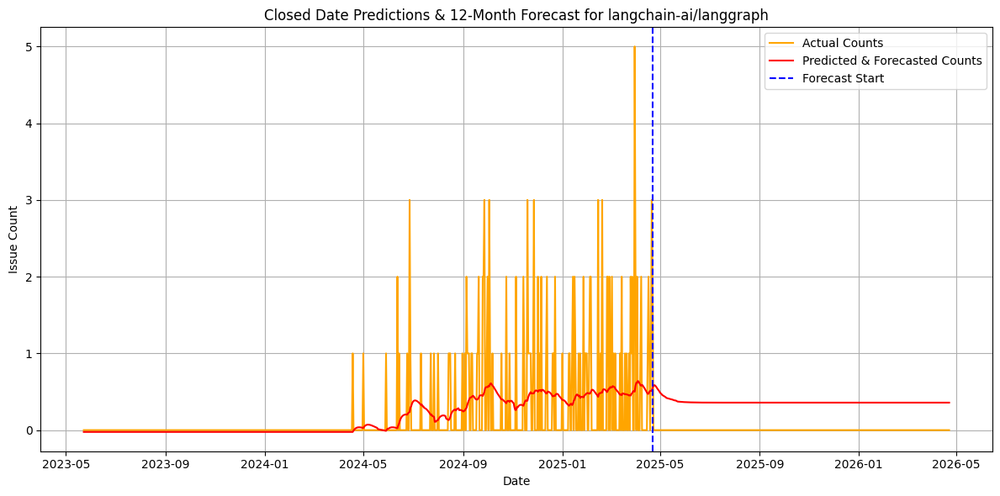

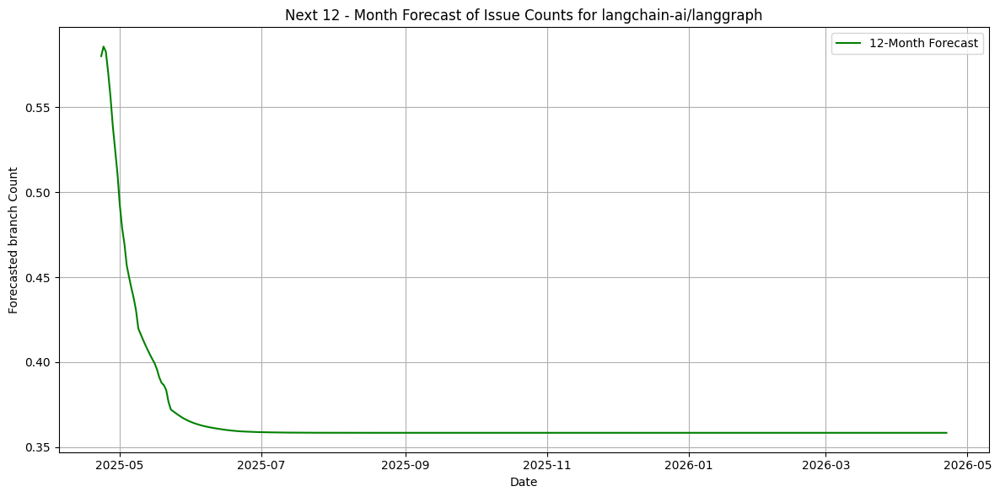

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.8289
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8949
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3827
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1945
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5636
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8713
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9133
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0918
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6343
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6362
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


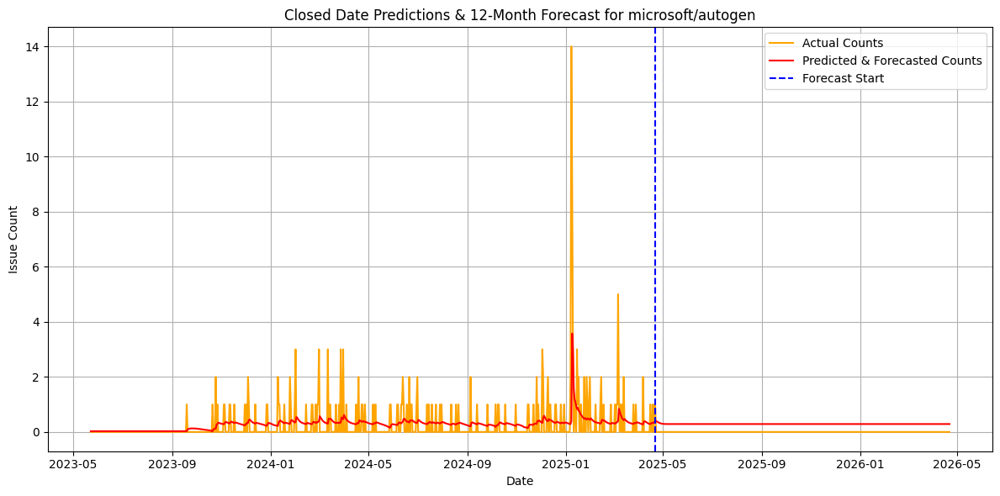

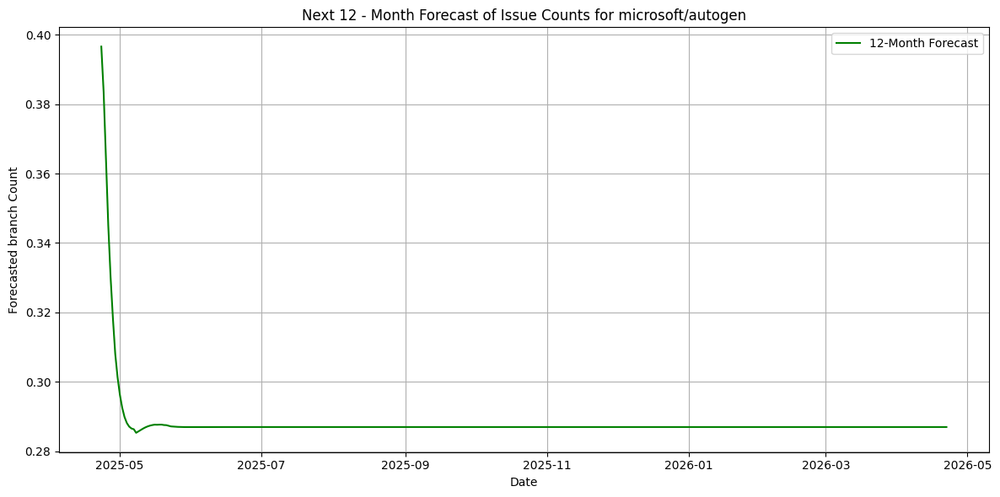

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2942
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0199
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.2334
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.7964
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9110
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8378
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9880
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1633
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7243
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7599
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


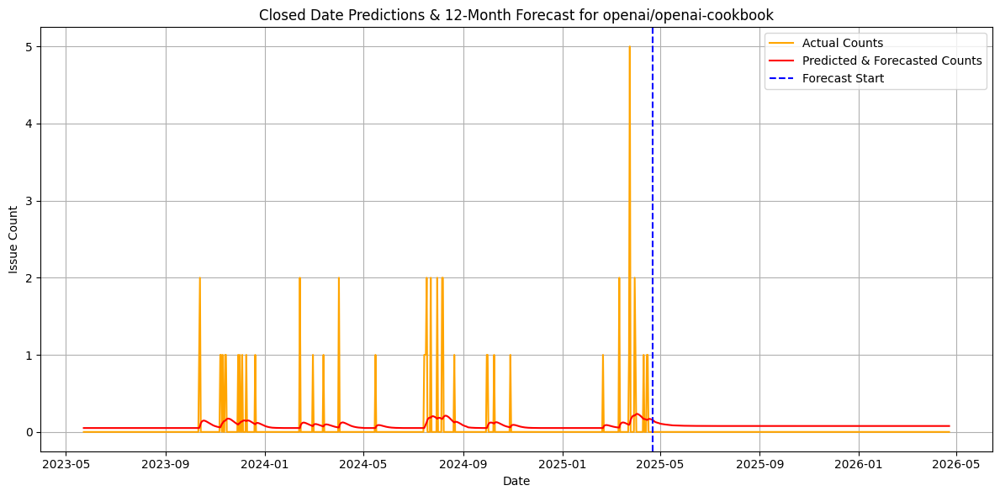

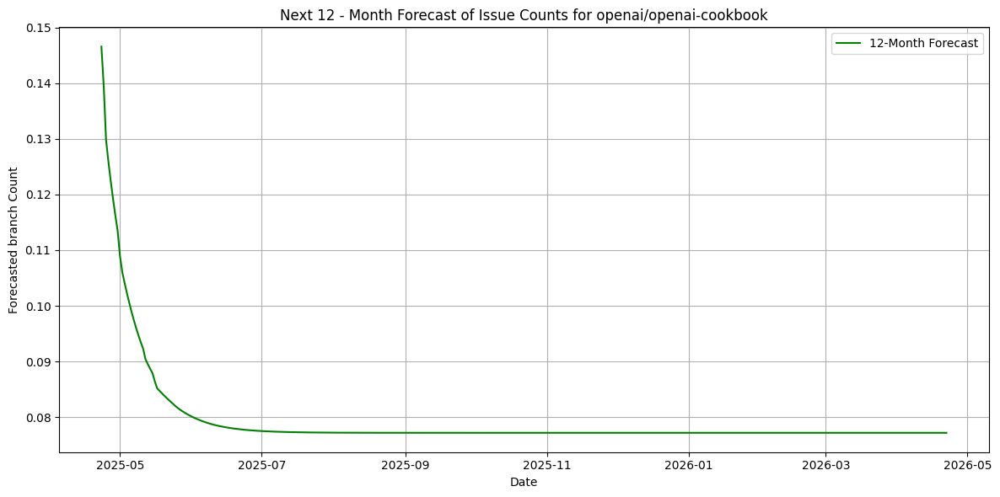

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.1023
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.1350
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9561
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9622
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9225
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6813
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9046
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0699
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8775
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.7941
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


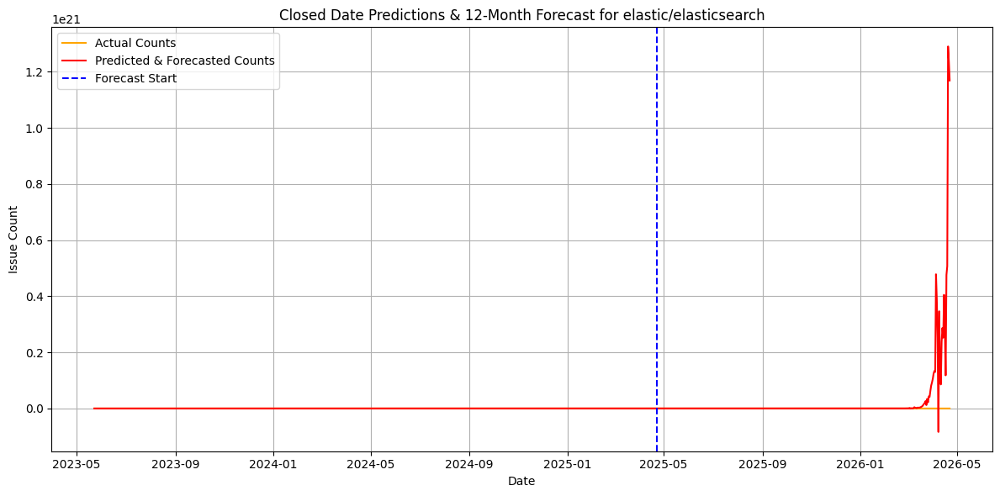

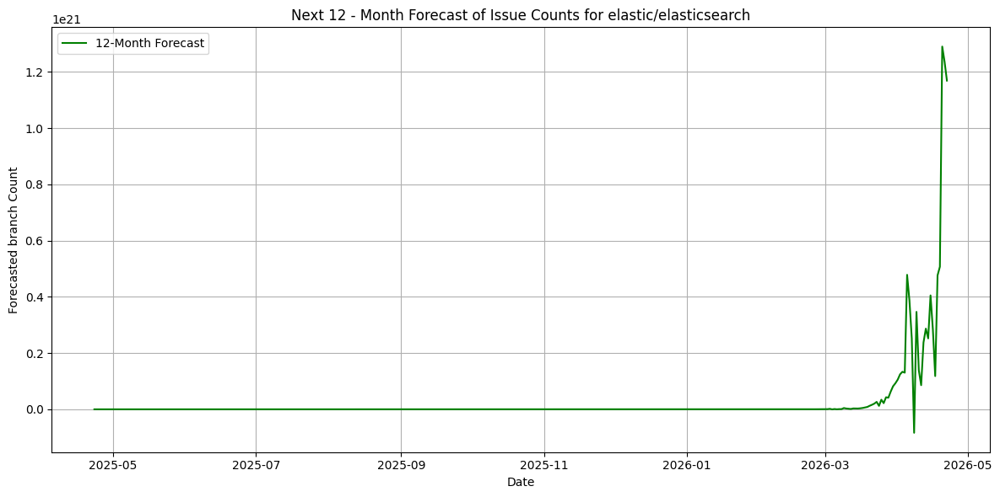

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.3473
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.4476
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.5211
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.3173
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1627
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.3577
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4527
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.4969
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7271
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9433
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


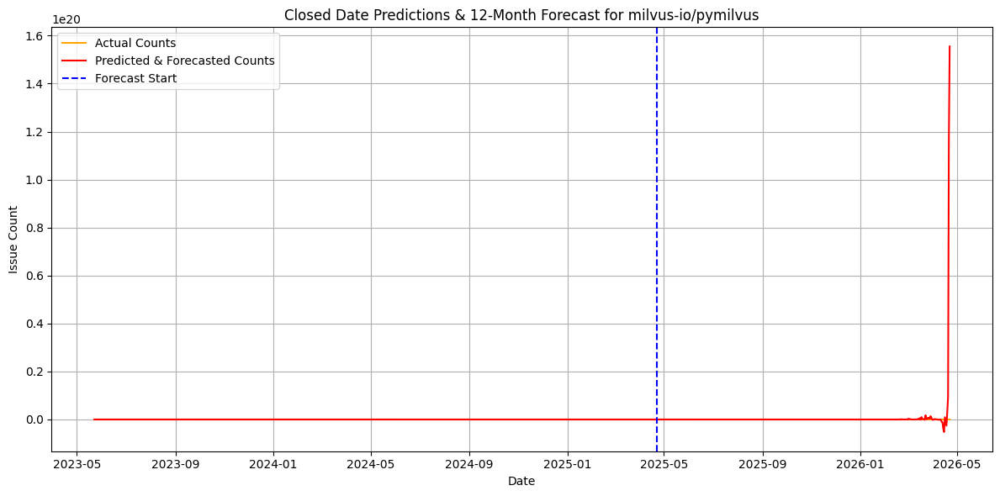

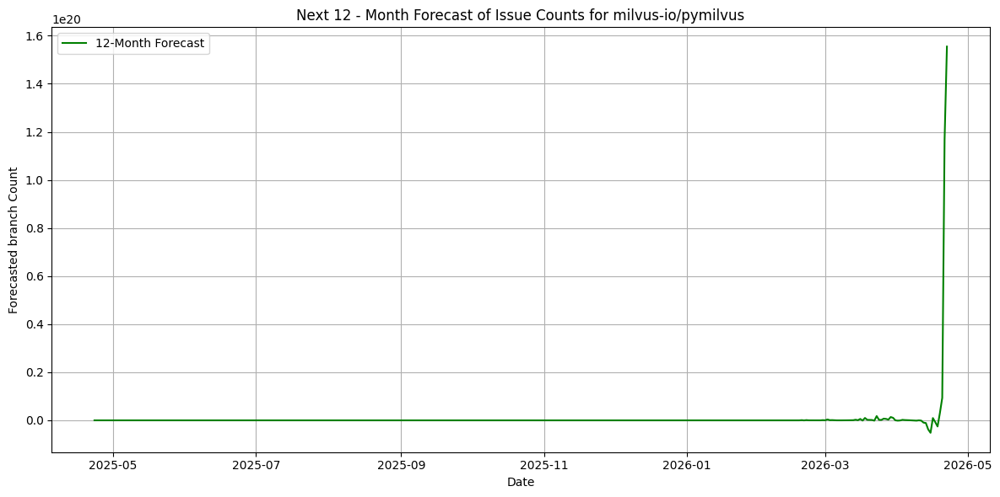

In [1]:
#Add your code for requirement 8.8 in this cell

import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

warnings.filterwarnings('ignore', category = UserWarning, message = 'Converting to PeriodArray/Index representation will drop timezone information')

warnings.filterwarnings('ignore', category = UserWarning, module = 'keras')

branchedData = pd.read_csv('dataset/branches_all_repo.csv')

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()

def preprocessingData(data, sequence_length):
    X, y = [], []
    for i in range(sequence_length, len(data)):
        X.append(data[i-sequence_length:i])
        y.append(data[i])
    return np.array(X), np.array(y)

def process_LSTM(X, y):
    model = Sequential([
        Input(shape=(X.shape[1], X.shape[2])),
        LSTM(50, activation='relu', return_sequences=True),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=10, batch_size=32, verbose=1)
    return model

def forecast_future(model, last_sequence, scaler, future_days):
    forecast = []
    current_input = last_sequence
    for _ in range(future_days):
        pred = model.predict(current_input.reshape(1, *current_input.shape), verbose=0)
        pred_value = pred[0, 0]

        # Check for NaN or Inf
        if not np.isfinite(pred_value):
            print(f"Invalid prediction encountered: {pred_value}")
            pred_value = 0  # or use last valid value, e.g., forecast[-1]

        forecast.append(pred_value)
        current_input = np.append(current_input[1:], [[pred_value]], axis=0)

    forecast_array = np.array(forecast).reshape(-1, 1)

    # Additional check before inverse_transform
    if not np.all(np.isfinite(forecast_array)):
        raise ValueError("Forecast array contains non-finite values.")

    forecast = scaler.inverse_transform(forecast_array).flatten()
    return forecast


for i in branchedData['repository'].unique():
    repoBasedDf = branchedData[branchedData['repository'] == i].copy()

    repoBasedDf = repoBasedDf.dropna(subset="commit_date")
    
    repoBasedDf.loc[:, 'commit_date'] = pd.to_datetime(repoBasedDf['commit_date'], errors='coerce').dt.tz_localize(None).dt.date

    repoBasedDfBasedOnDate = repoBasedDf.groupby('commit_date').size().reset_index(name='count')
    repoBasedDfBasedOnDate['commit_date'] = pd.to_datetime(repoBasedDfBasedOnDate['commit_date'])

    repoBasedDfBasedOnDate = repoBasedDfBasedOnDate[
        (repoBasedDfBasedOnDate['commit_date'] >= pd.to_datetime(oldDate)) &
        (repoBasedDfBasedOnDate['commit_date'] <= pd.to_datetime(nowDate))
    ]
    repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['commit_date'].dt.day_name()

    everydayCounts = repoBasedDfBasedOnDate.groupby('commit_date')['count'].sum().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    everydayCountIndices = everydayCounts.set_index('commit_date').reindex(allDates, fill_value=0).reset_index(names='commit_date')
    everydayCountIndices['commit_date'] = pd.to_datetime(everydayCountIndices['commit_date'])
    everydayCountIndices['day_name'] = everydayCountIndices['commit_date'].dt.day_name()

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(everydayCountIndices['count'].values.reshape(-1, 1))

    nSequence = 30
    X, y = preprocessingData(scaled_data, sequence_length=nSequence)
    model = process_LSTM(X, y)

    pred = model.predict(X)
    pred = scaler.inverse_transform(pred)

    everydayCountIndices = everydayCountIndices.iloc[nSequence:].reset_index(drop=True)
    everydayCountIndices['predictions'] = pred.flatten()

    future_days = 365
    last_sequence = scaled_data[-nSequence:]
    future_preds = forecast_future(model, last_sequence, scaler, future_days)
    future_dates = pd.date_range(start=everydayCountIndices['commit_date'].iloc[-1] + pd.Timedelta(days=1), periods=future_days)

    forecast_df = pd.DataFrame({
        'commit_date': future_dates,
        'predictions': future_preds,
        'count': 0
    })

    combined_df = pd.concat([
        everydayCountIndices[['commit_date', 'count', 'predictions']],
        forecast_df
    ], ignore_index=True)

    plt.figure(figsize=(12, 6))
    plt.plot(combined_df['commit_date'], combined_df['count'], label='Actual Counts', color="orange")
    plt.plot(combined_df['commit_date'], combined_df['predictions'], label='Predicted & Forecasted Counts', color="red")
    plt.axvline(x=everydayCountIndices['commit_date'].iloc[-1], color='blue', linestyle='--', label='Forecast Start')
    plt.title(f'Closed Date Predictions & 12-Month Forecast for {i}')
    plt.xlabel('Date')
    plt.ylabel('Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(forecast_df['commit_date'], forecast_df['predictions'], label='12-Month Forecast', color='green')
    plt.title(f'Next 12 - Month Forecast of Issue Counts for {i}')
    plt.xlabel('Date')
    plt.ylabel('Forecasted branch Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<div class="alert alert-block alert-success">   
    
#### REQ8-9). Plot the contributors forecast

</div>

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.7676
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6751
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6178
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6640
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5414
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2465
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7614
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3413
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1973
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3471
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


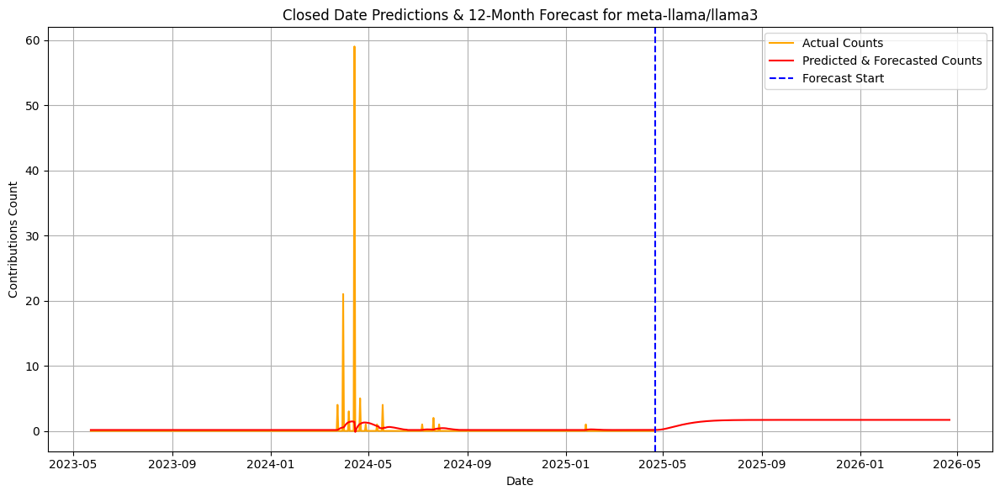

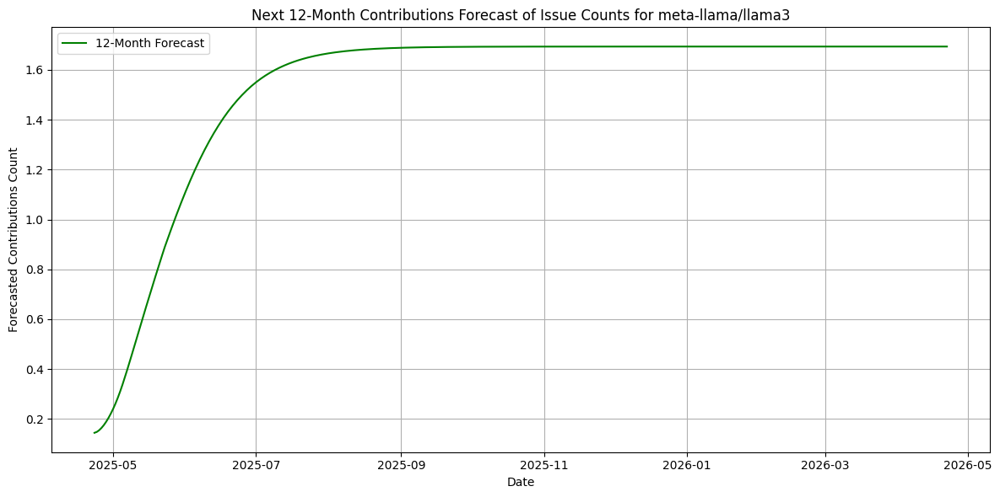

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.9378
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2574
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9546
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8176
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9884
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.1695
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 1.1818
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9540
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.1372
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.7178
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


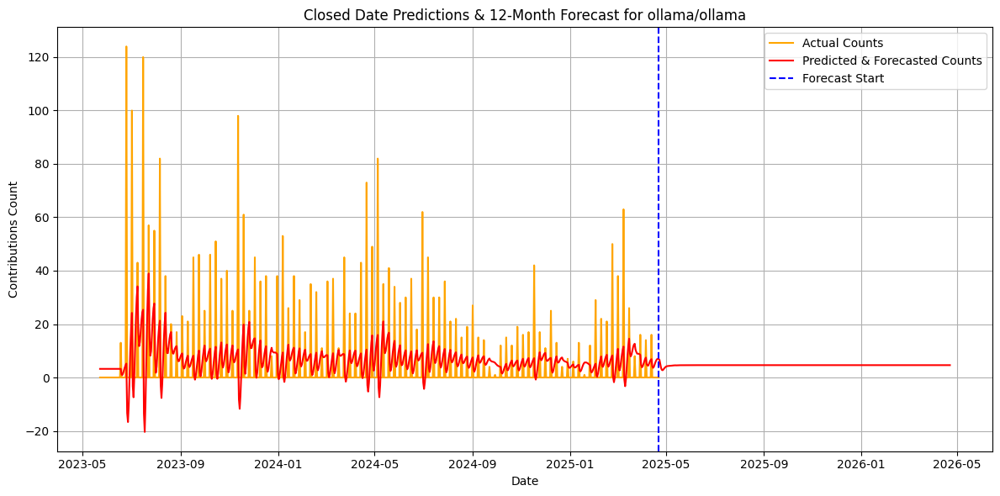

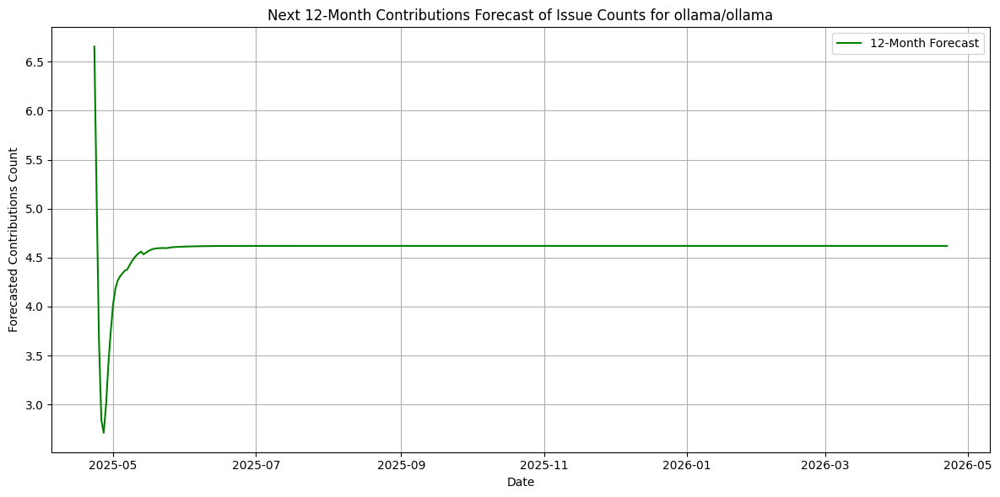

Epoch 1/10


/var/folders/q3/91x5m0k55jz1bvt_fqnvcwn00000gn/T/ipykernel_96765/2520979882.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['date'].dt.day_name()


22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9612
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8810
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8458
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7761
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8252
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9536
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7489
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6715
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6008
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7463
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


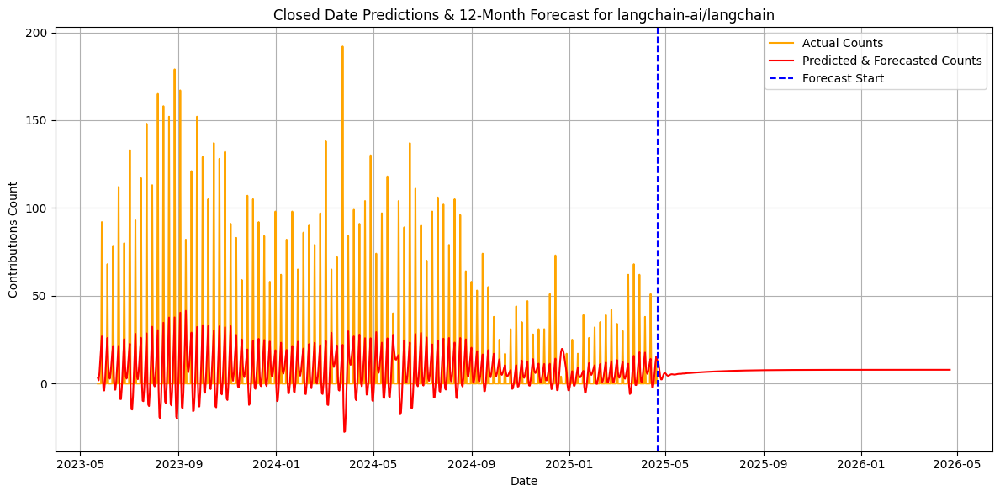

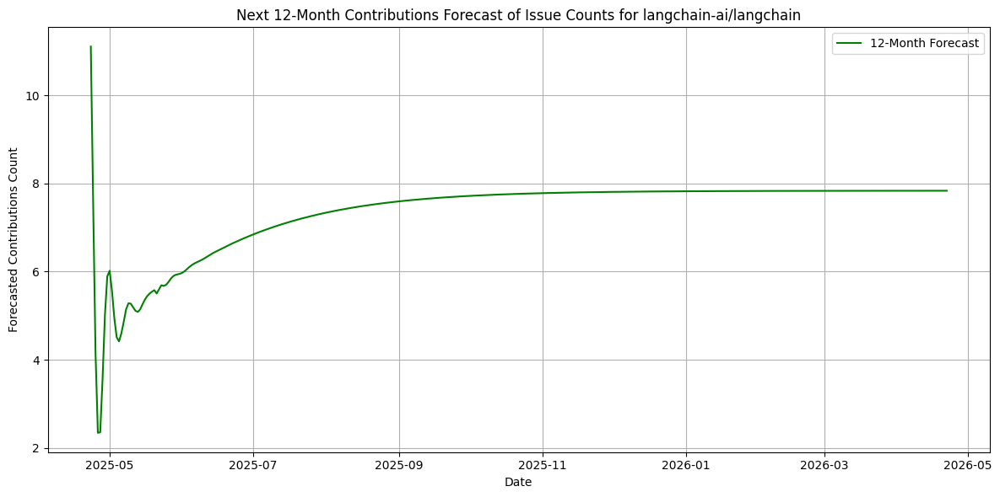

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 1.0013
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1053
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9198
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.2492
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0455
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.0114
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7916
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9841
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7649
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9037
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


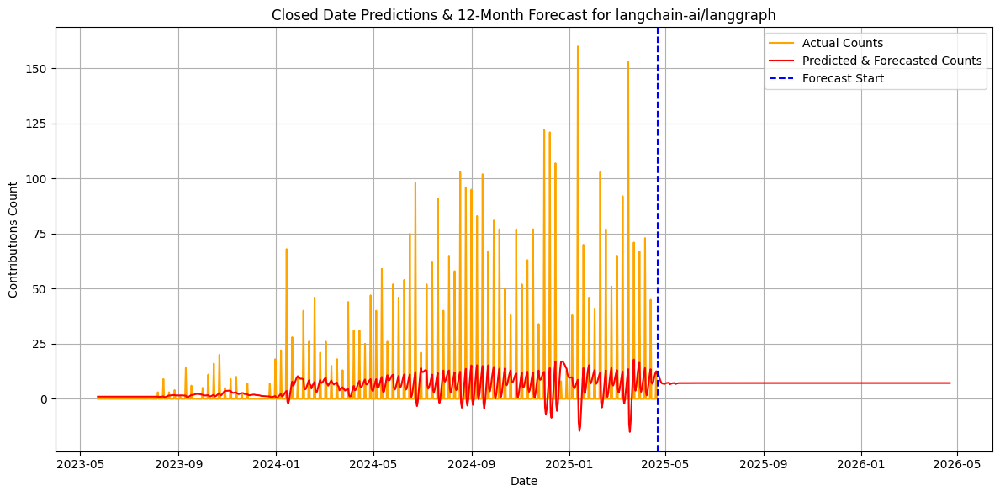

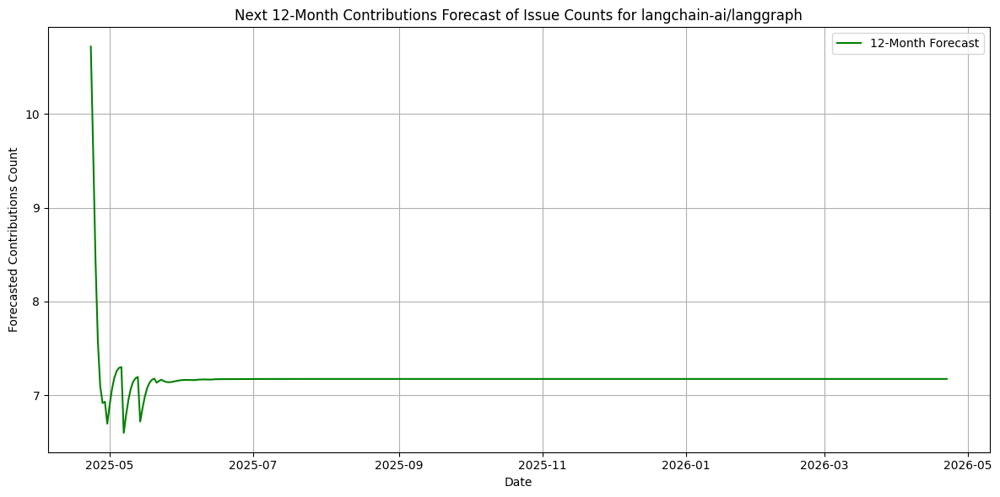

Epoch 1/10


/var/folders/q3/91x5m0k55jz1bvt_fqnvcwn00000gn/T/ipykernel_96765/2520979882.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['date'].dt.day_name()


22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.8801
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1107
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8123
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7942
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.1033
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8173
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0145
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6940
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9159
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8588
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


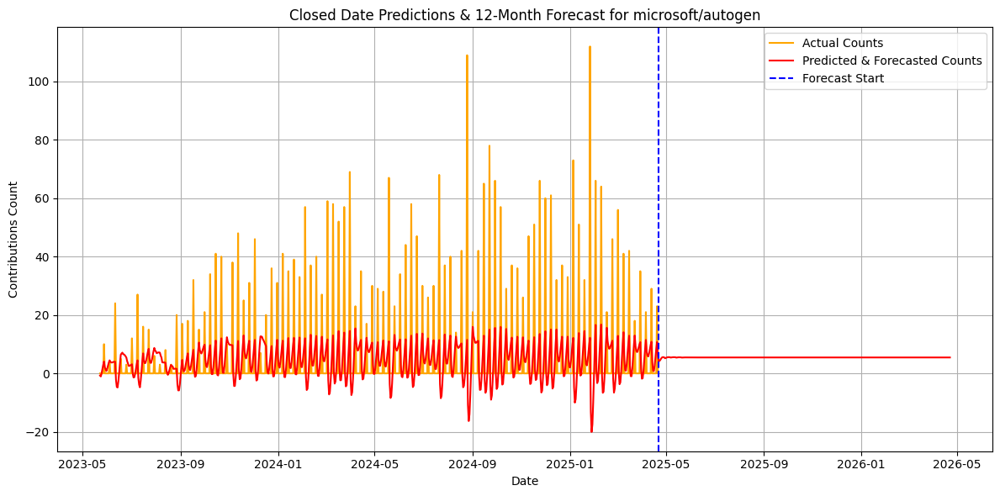

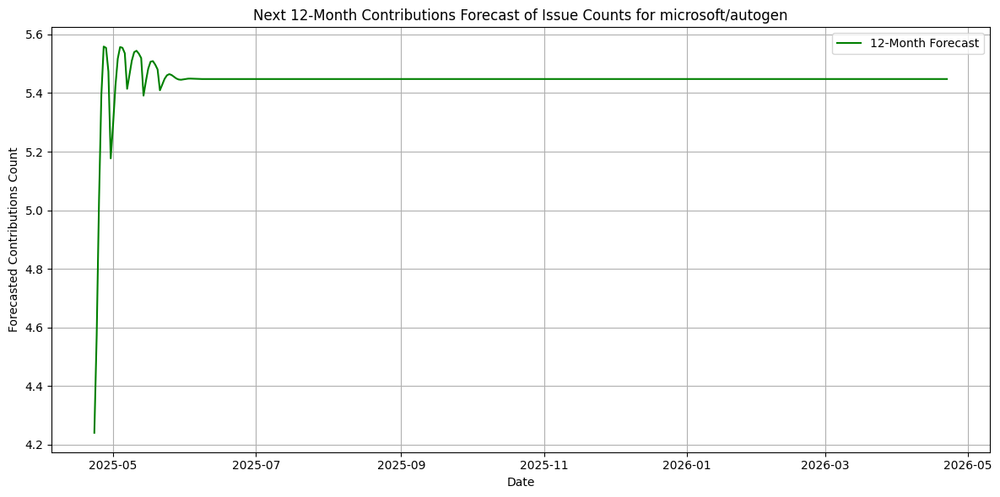

Epoch 1/10


/var/folders/q3/91x5m0k55jz1bvt_fqnvcwn00000gn/T/ipykernel_96765/2520979882.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['date'].dt.day_name()


22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9565
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.7614
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.5586
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.4015
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9357
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9122
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8273
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8727
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7039
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5706
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


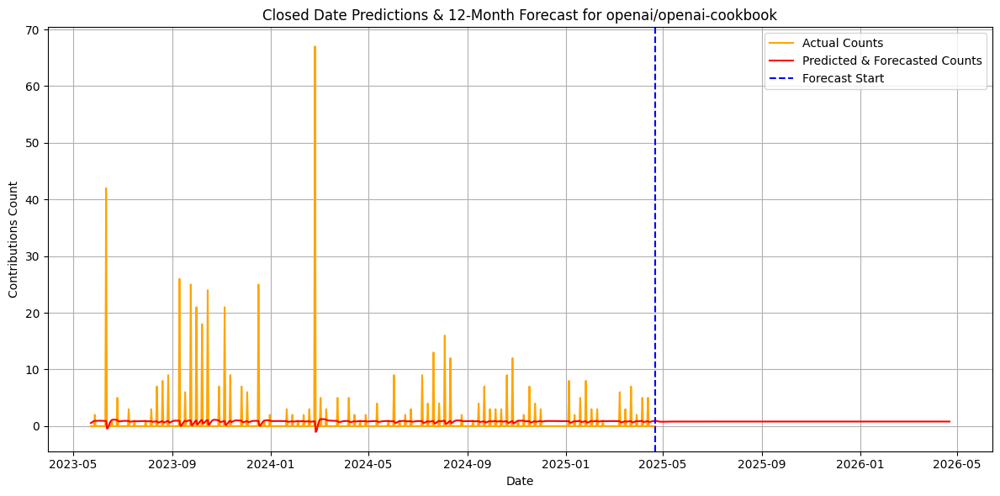

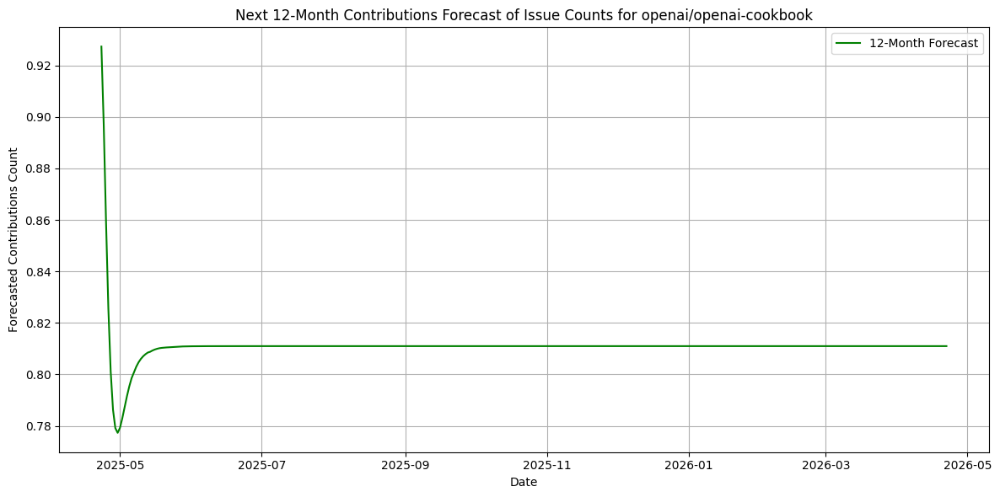

Epoch 1/10


/var/folders/q3/91x5m0k55jz1bvt_fqnvcwn00000gn/T/ipykernel_96765/2520979882.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['date'].dt.day_name()


22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.0786
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8249
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0004
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3151
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.0382
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.8101
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.9505
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.8916
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.8482
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9608
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


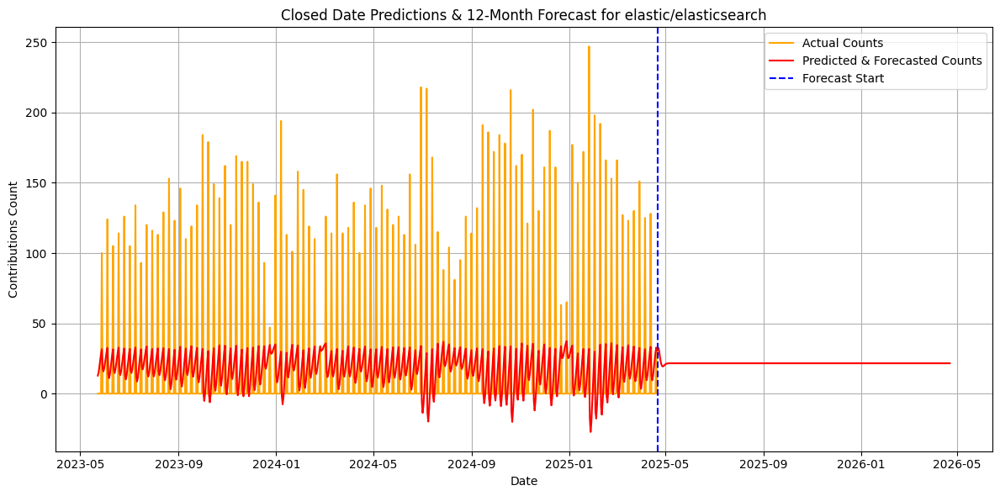

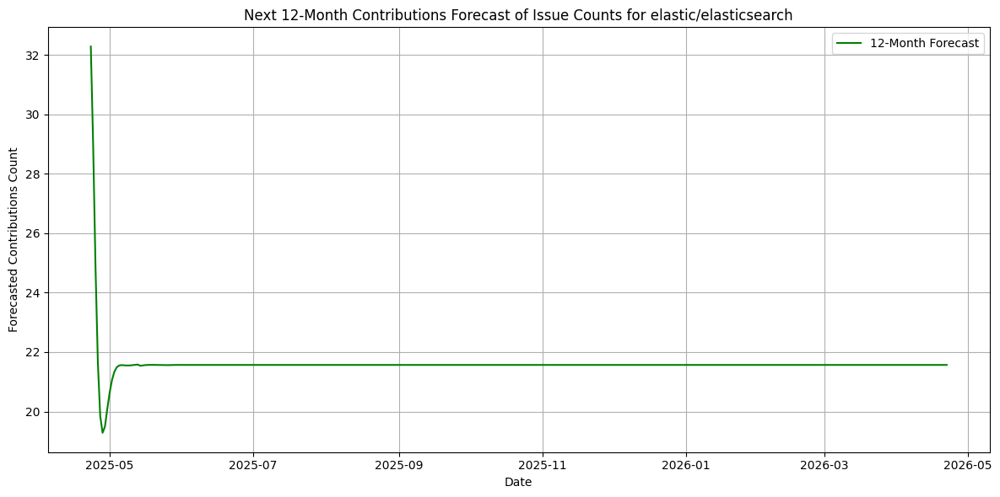

Epoch 1/10


/var/folders/q3/91x5m0k55jz1bvt_fqnvcwn00000gn/T/ipykernel_96765/2520979882.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['date'].dt.day_name()


22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9931
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7520
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2342
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7799
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.1074
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9400
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8891
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9395
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6556
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9117
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


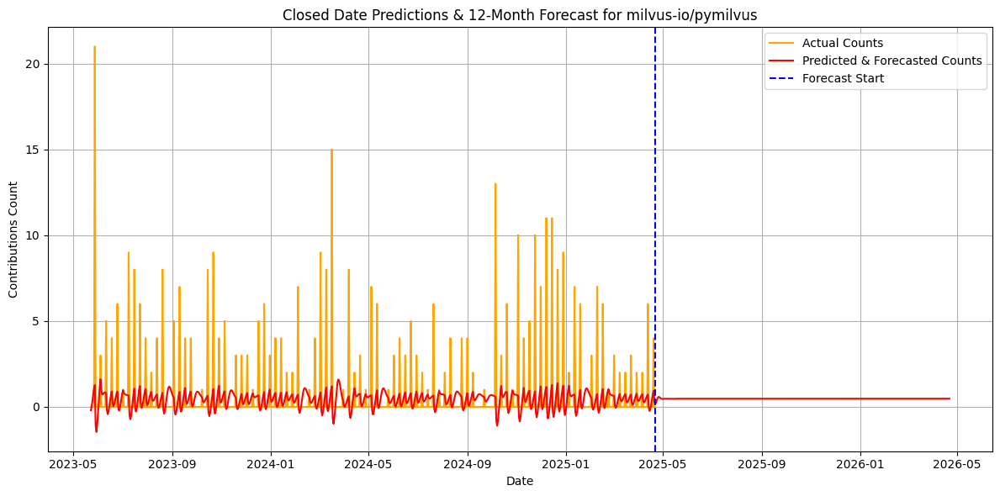

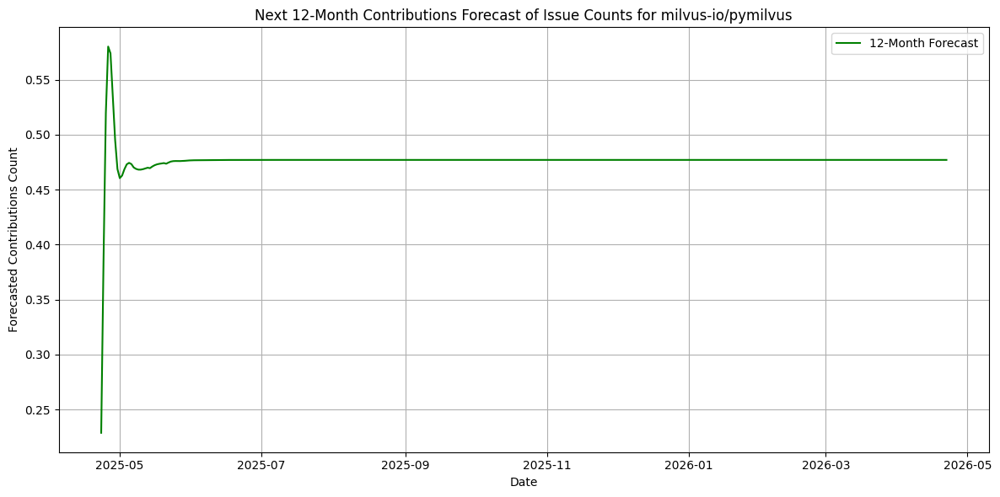

In [1]:
#Add your code for requirement 8.9 in this cell

import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

warnings.filterwarnings('ignore', category = UserWarning, message = 'Converting to PeriodArray/Index representation will drop timezone information')

warnings.filterwarnings('ignore', category = UserWarning, module = 'keras')

contributorsData = pd.read_csv('dataset/all_repo_contributors.csv')

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()

def preprocessingData(data, sequence_length):
    X, y = [], []
    for i in range(sequence_length, len(data)):
        X.append(data[i-sequence_length:i])
        y.append(data[i])
    return np.array(X), np.array(y)

def process_LSTM(X, y):
    model = Sequential([
        Input(shape=(X.shape[1], X.shape[2])),
        LSTM(50, activation='relu', return_sequences=True),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=10, batch_size=32, verbose=1)
    return model

def forecast_future(model, last_sequence, scaler, future_days):
    forecast = []
    current_input = last_sequence
    for _ in range(future_days):
        pred = model.predict(current_input.reshape(1, *current_input.shape), verbose=0)
        pred_value = pred[0, 0]
        if not np.isfinite(pred_value):
            print(f"Invalid prediction encountered: {pred_value}")
            pred_value = 0 

        forecast.append(pred_value)
        current_input = np.append(current_input[1:], [[pred_value]], axis=0)

    forecast_array = np.array(forecast).reshape(-1, 1)

    if not np.all(np.isfinite(forecast_array)):
        raise ValueError("Forecast array contains non-finite values.")

    forecast = scaler.inverse_transform(forecast_array).flatten()
    return forecast

for i in contributorsData['Repository'].unique():
    repoBasedDf = contributorsData[contributorsData['Repository'] == i].copy()

    repoBasedDf = repoBasedDf.dropna(subset="date")
    
    repoBasedDf.loc[:, 'date'] = pd.to_datetime(repoBasedDf['date'], errors='coerce').dt.tz_localize(None).dt.date

    repoBasedDfBasedOnDate = repoBasedDf # repoBasedDf.groupby('date').size().reset_index(name='count')
    repoBasedDfBasedOnDate['date'] = pd.to_datetime(repoBasedDfBasedOnDate['date'])

    repoBasedDfBasedOnDate = repoBasedDfBasedOnDate[
        (repoBasedDfBasedOnDate['date'] >= pd.to_datetime(oldDate)) &
        (repoBasedDfBasedOnDate['date'] <= pd.to_datetime(nowDate))
    ]
    repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['date'].dt.day_name()

    everydayCounts = repoBasedDfBasedOnDate.groupby('date')['commitCount'].sum().reset_index(name='commitCount')
    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    everydayCountIndices = everydayCounts.set_index('date').reindex(allDates, fill_value=0).reset_index(names='date')
    everydayCountIndices['date'] = pd.to_datetime(everydayCountIndices['date'])
    everydayCountIndices['day_name'] = everydayCountIndices['date'].dt.day_name()

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(everydayCountIndices['commitCount'].values.reshape(-1, 1))

    nSequence = 30
    X, y = preprocessingData(scaled_data, sequence_length=nSequence)
    model = process_LSTM(X, y)

    pred = model.predict(X)
    pred = scaler.inverse_transform(pred)

    everydayCountIndices = everydayCountIndices.iloc[nSequence:].reset_index(drop=True)
    everydayCountIndices['predictions'] = pred.flatten()

    future_days = 365
    last_sequence = scaled_data[-nSequence:]
    future_preds = forecast_future(model, last_sequence, scaler, future_days)
    future_dates = pd.date_range(start=everydayCountIndices['date'].iloc[-1] + pd.Timedelta(days=1), periods=future_days)

    forecast_df = pd.DataFrame({
        'date': future_dates,
        'predictions': future_preds,
        'count': 0
    })

    combined_df = pd.concat([
        everydayCountIndices[['date', 'commitCount', 'predictions']],
        forecast_df
    ], ignore_index=True)

    plt.figure(figsize=(12, 6))
    plt.plot(combined_df['date'], combined_df['commitCount'], label='Actual Counts', color="orange")
    plt.plot(combined_df['date'], combined_df['predictions'], label='Predicted & Forecasted Counts', color="red")
    plt.axvline(x=everydayCountIndices['date'].iloc[-1], color='blue', linestyle='--', label='Forecast Start')
    plt.title(f'Closed Date Predictions & 12-Month Forecast for {i}')
    plt.xlabel('Date')
    plt.ylabel('Contributions Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(forecast_df['date'], forecast_df['predictions'], label='12-Month Forecast', color='green')
    plt.title(f'Next 12-Month Contributions Forecast of Issue Counts for {i}')
    plt.xlabel('Date')
    plt.ylabel('Forecasted Contributions Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<div class="alert alert-block alert-success">   
    
#### REQ8-10). Plot the releases forecast

</div>

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1653
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0226
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0780
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8973
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.1668
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9849
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9898
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.1779
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9778
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1803
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


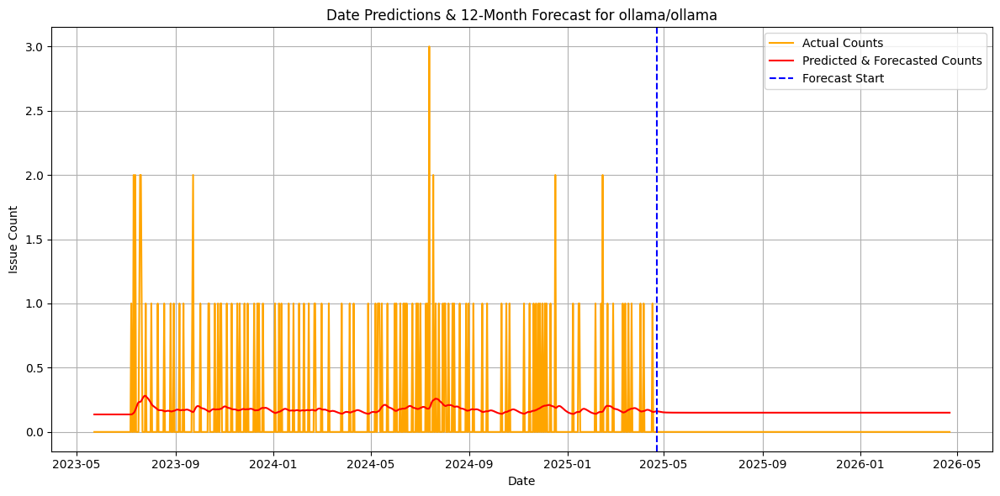

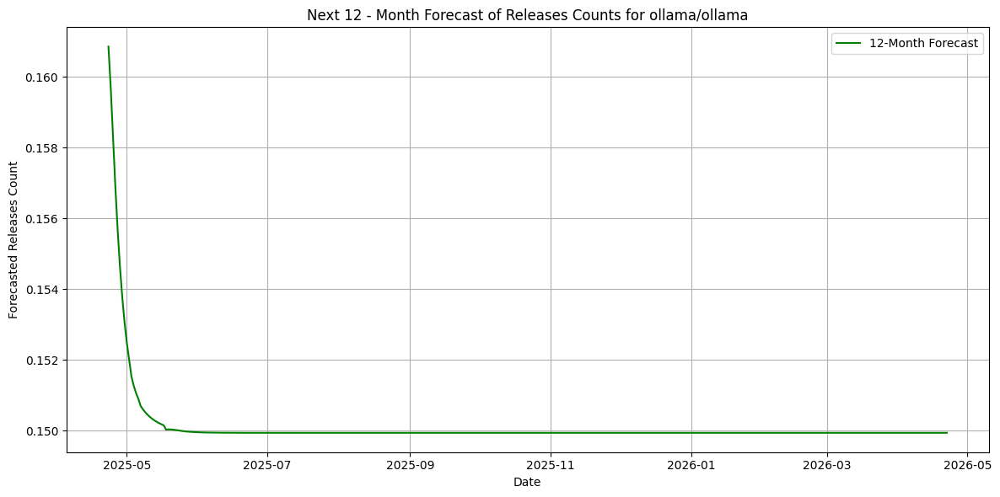

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 1.0265
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0734
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.0527
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.1716
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8113
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1198
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0542
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9747
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.2333
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9078
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


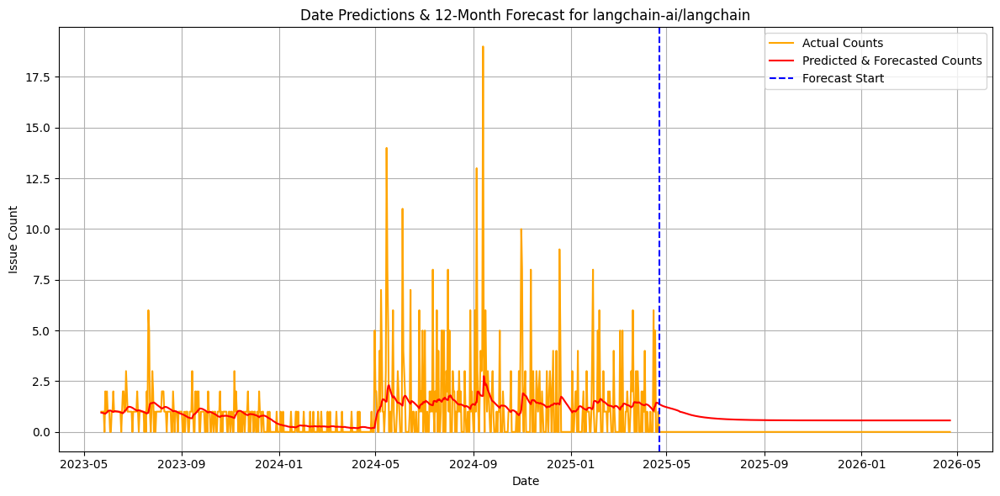

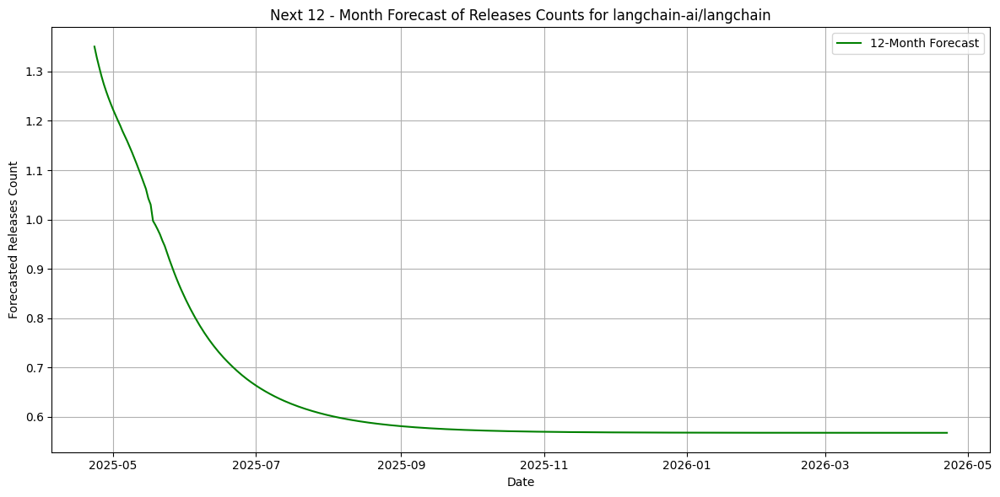

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 1.0767
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8153
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7995
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9082
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7296
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8655
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6585
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7032
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8900
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8695
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


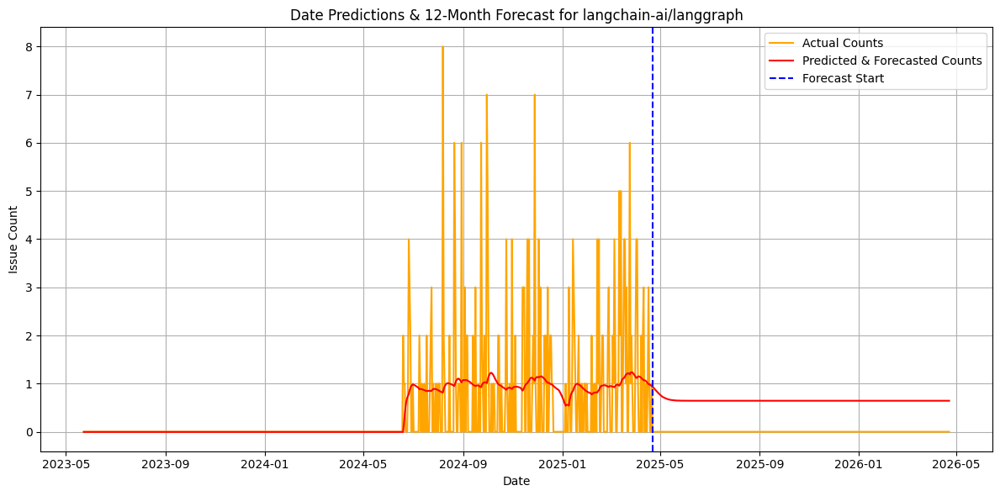

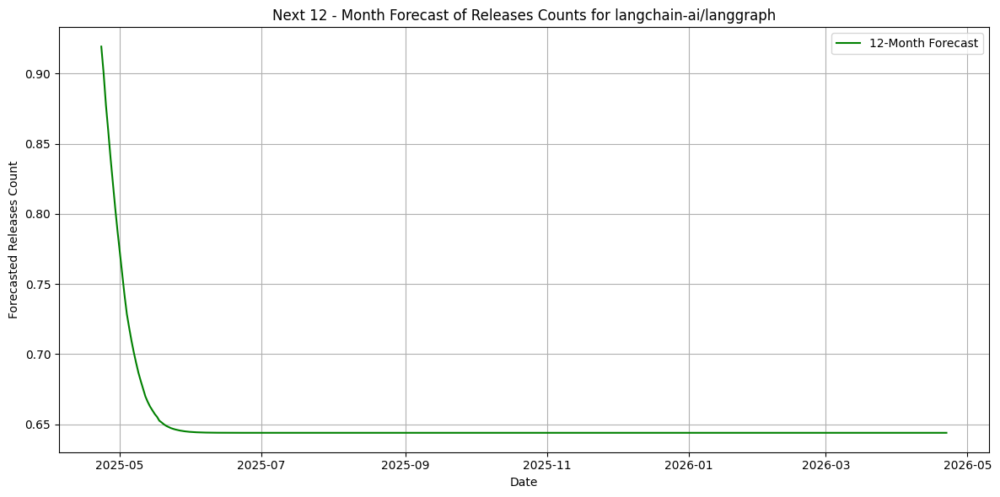

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.1144
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8464
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9777
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9073
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0191
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8680
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1070
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8661
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9919
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8796
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


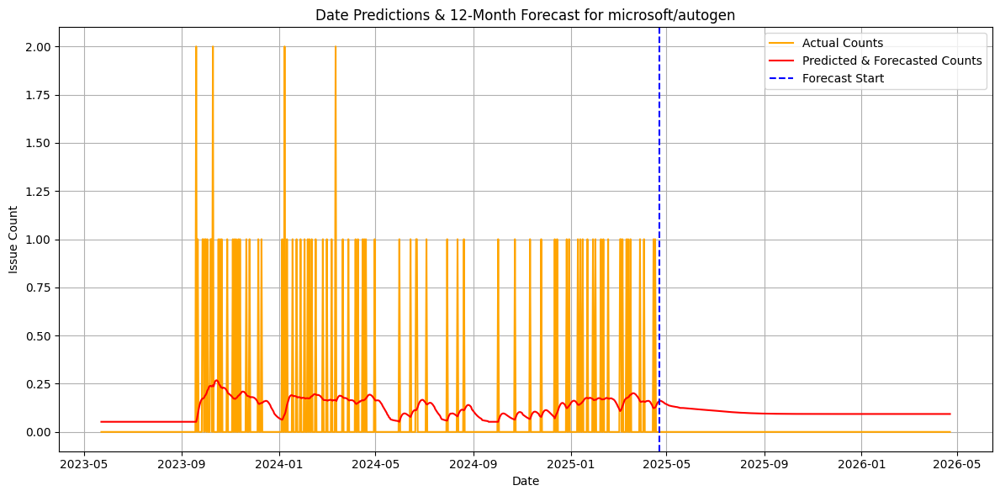

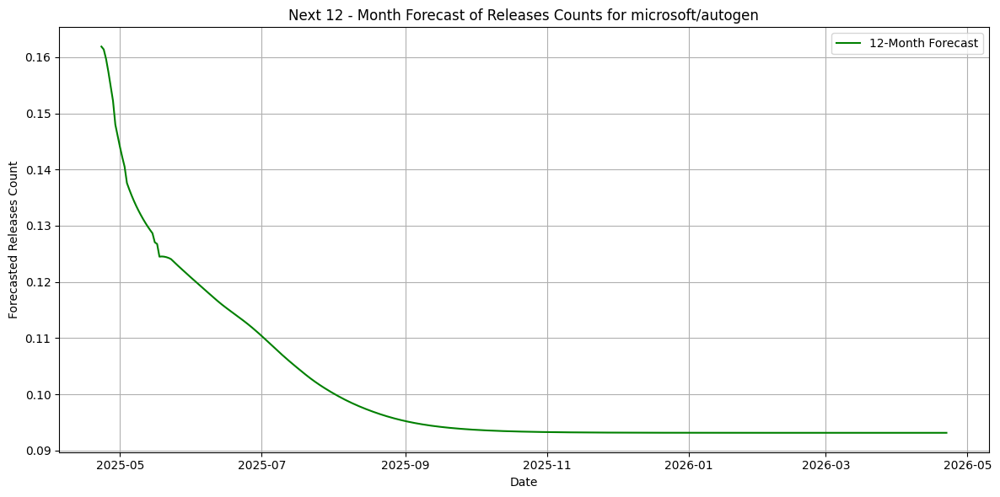

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.9043
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9159
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.4372
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8528
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8507
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9470
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3164
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9750
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1171
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7954
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


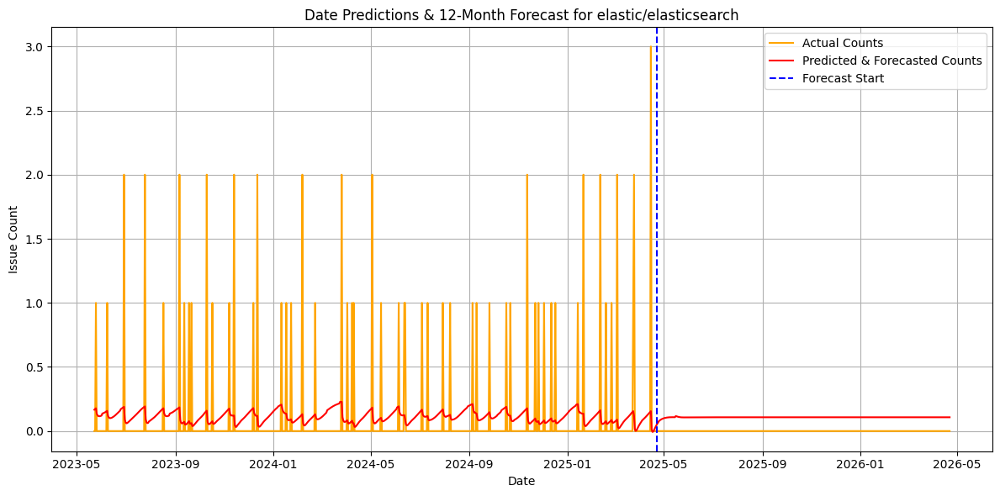

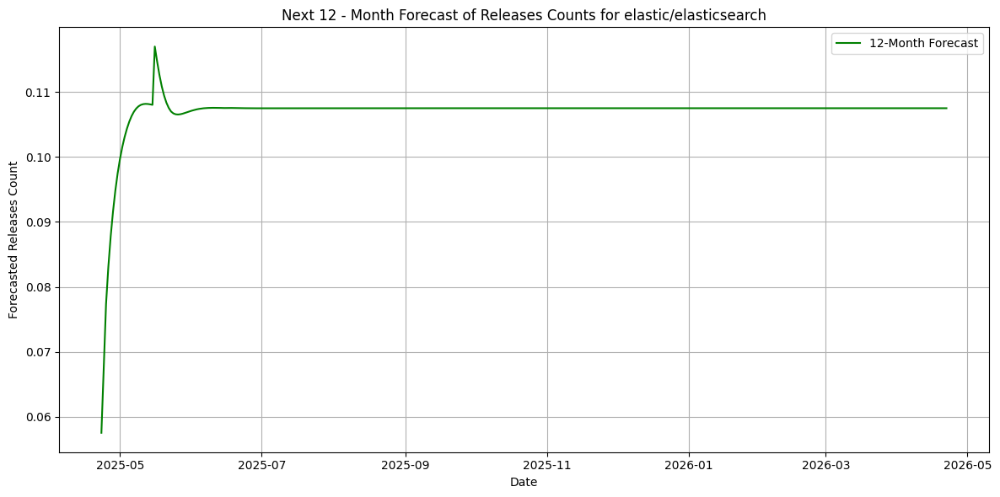

Epoch 1/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2114
Epoch 2/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.2366
Epoch 3/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9678
Epoch 4/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7568
Epoch 5/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9767
Epoch 6/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1953
Epoch 7/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.3638
Epoch 8/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9802
Epoch 9/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0169
Epoch 10/10
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2284
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


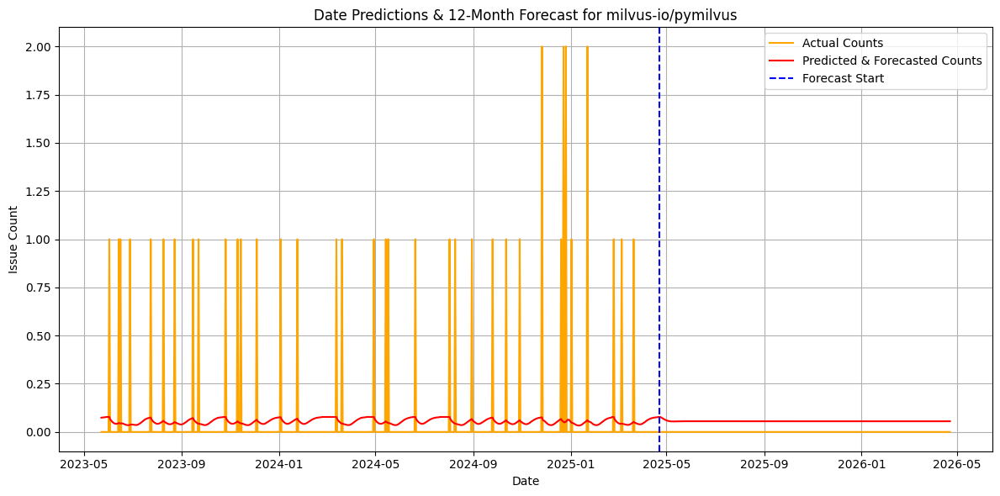

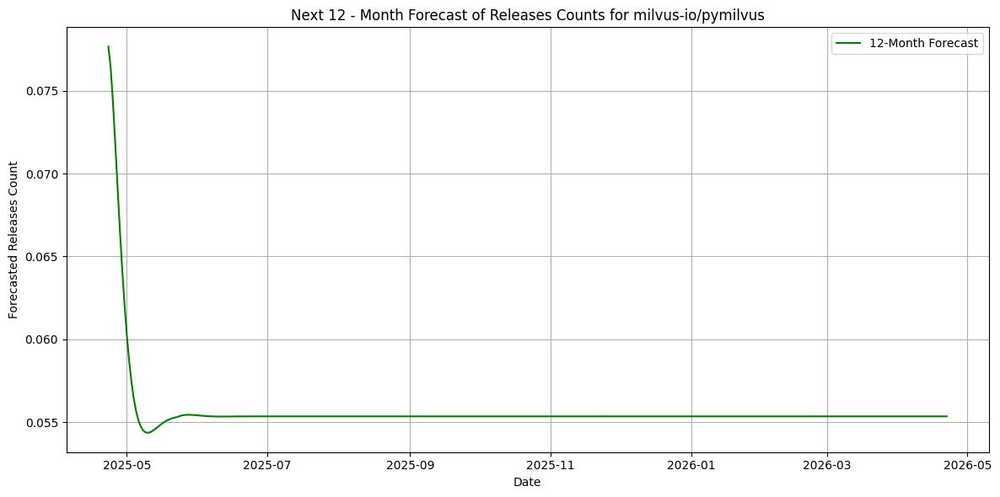

In [1]:
#Add your code for requirement 8.10 in this cell

#Add your code for requirement 8.10 in this cell

import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

warnings.filterwarnings('ignore', category = UserWarning, message = 'Converting to PeriodArray/Index representation will drop timezone information')

warnings.filterwarnings('ignore', category = UserWarning, module = 'keras')

releasesData = pd.read_csv('dataset/releases_all_repo.csv')

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).date()

def preprocessingData(data, sequence_length):
    X, y = [], []
    for i in range(sequence_length, len(data)):
        X.append(data[i-sequence_length:i])
        y.append(data[i])
    return np.array(X), np.array(y)

def process_LSTM(X, y):
    model = Sequential([
        Input(shape=(X.shape[1], X.shape[2])),
        LSTM(50, activation='relu', return_sequences=True),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=10, batch_size=32, verbose=1)
    return model

def forecast_future(model, last_sequence, scaler, future_days):
    forecast = []
    current_input = last_sequence
    for _ in range(future_days):
        pred = model.predict(current_input.reshape(1, *current_input.shape), verbose=0)
        forecast.append(pred[0, 0])
        current_input = np.append(current_input[1:], pred.reshape(1, 1), axis=0)
    forecast = scaler.inverse_transform(np.array(forecast).reshape(-1, 1)).flatten()
    return forecast

for i in releasesData['repository'].unique():
    repoBasedDf = releasesData[releasesData['repository'] == i].copy()

    repoBasedDf = repoBasedDf.dropna(subset="published_at")
    
    repoBasedDf.loc[:, 'published_at'] = pd.to_datetime(repoBasedDf['published_at'], errors='coerce').dt.tz_localize(None).dt.date

    repoBasedDfBasedOnDate = repoBasedDf.groupby('published_at').size().reset_index(name='count')
    repoBasedDfBasedOnDate['published_at'] = pd.to_datetime(repoBasedDfBasedOnDate['published_at'])

    repoBasedDfBasedOnDate = repoBasedDfBasedOnDate[
        (repoBasedDfBasedOnDate['published_at'] >= pd.to_datetime(oldDate)) &
        (repoBasedDfBasedOnDate['published_at'] <= pd.to_datetime(nowDate))
    ]
    repoBasedDfBasedOnDate['day_week'] = repoBasedDfBasedOnDate['published_at'].dt.day_name()

    everydayCounts = repoBasedDfBasedOnDate.groupby('published_at')['count'].sum().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    everydayCountIndices = everydayCounts.set_index('published_at').reindex(allDates, fill_value=0).reset_index(names='published_at')
    everydayCountIndices['published_at'] = pd.to_datetime(everydayCountIndices['published_at'])
    everydayCountIndices['day_name'] = everydayCountIndices['published_at'].dt.day_name()

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(everydayCountIndices['count'].values.reshape(-1, 1))

    nSequence = 30
    X, y = preprocessingData(scaled_data, sequence_length=nSequence)
    model = process_LSTM(X, y)

    pred = model.predict(X)
    pred = scaler.inverse_transform(pred)

    everydayCountIndices = everydayCountIndices.iloc[nSequence:].reset_index(drop=True)
    everydayCountIndices['predictions'] = pred.flatten()

    future_days = 365
    last_sequence = scaled_data[-nSequence:]
    future_preds = forecast_future(model, last_sequence, scaler, future_days)
    future_dates = pd.date_range(start=everydayCountIndices['published_at'].iloc[-1] + pd.Timedelta(days=1), periods=future_days)

    forecast_df = pd.DataFrame({
        'published_at': future_dates,
        'predictions': future_preds,
        'count': 0
    })

    combined_df = pd.concat([
        everydayCountIndices[['published_at', 'count', 'predictions']],
        forecast_df
    ], ignore_index=True)

    plt.figure(figsize=(12, 6))
    plt.plot(combined_df['published_at'], combined_df['count'], label='Actual Counts', color="orange")
    plt.plot(combined_df['published_at'], combined_df['predictions'], label='Predicted & Forecasted Counts', color="red")
    plt.axvline(x=everydayCountIndices['published_at'].iloc[-1], color='blue', linestyle='--', label='Forecast Start')
    plt.title(f'Date Predictions & 12-Month Forecast for {i}')
    plt.xlabel('Date')
    plt.ylabel('Issue Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(forecast_df['published_at'], forecast_df['predictions'], label='12-Month Forecast', color='green')
    plt.title(f'Next 12 - Month Forecast of Releases Counts for {i}')
    plt.xlabel('Date')
    plt.ylabel('Forecasted Releases Count')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()